# datasets from nb_bcat_Data_download_3_some.ipynb

 BCAT1, BCAT2, SLC7A8 in subtype AML-ETO, FLT3-ITD, MLL-AF9

- data/tcga_laml_RNAseq_Counts.rds
- data/tcga_laml_clin.rds
- data/tcga_laml_mutation.rds

- data/target_laml_RNAseq_Counts.rds
- data/target_aml_clin.rds
- data/target_aml_snv.tsv

- data/beataml_laml_RNAseq_Counts.rds
- data/beataml_aml_clin.rds
- data/beat_aml_snv.rds

# import packages

In [3]:
library(DESeq2)
library(data.table)
library(dplyr)
library(ChIPseeker)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(survminer)
library(EnsDb.Hsapiens.v75)
library(clusterProfiler)
library(AnnotationDbi)
library(XML)
library(org.Hs.eg.db)
library(ggplot2)
library(gridExtra)
library(IRdisplay)
library(pbapply)
library(ChIPpeakAnno)
library(sva)
library(TCGAbiolinks) 
library(IRdisplay)
library(ggpubr)
library(DiffBind)
library(Seurat)
library(kableExtra)
library(tidyverse)
library(clusterProfiler)
library(enrichplot)
library(readxl)
library(umap)
library(corrplot)
library(ggrepel)
library(msigdbr)
library(ggraph)
library(tidygraph)
library(fgsea)
library(ggvenn)
library(ComplexHeatmap)
library(ggVennDiagram)
library(venneuler)
library(sva)
library(DT)
library(tools)
library(tidyverse)
library(maSigPro)
library(RSQLite)
library(rstatix)

library(edgeR)

#txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene

options(width = 188)

base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/'
source('~/script/utils.r')
setwd(base_dir)

path = '/usr/NX/bin:/cm/local/apps/environment-modules/4.5.3//bin:/hpcf/lsf/lsf_prod/10.1/linux3.10-glibc2.17-x86_64/etc:/hpcf/lsf/lsf_prod/10.1/linux3.10-glibc2.17-x86_64/bin:/usr/lpp/mmfs/bin:/usr/lpp/mmfs/lib:/usr/local/bin:/usr/bin:/usr/local/sbin:/usr/sbin:/sbin:/usr/sbin:/cm/local/apps/environment-modules/4.5.3/bin:/usr/sbin:/sbin:/bin:/usr/bin:/etc:/usr/ucb:/usr/local/bin:/usr/local/local_dfs/bin:/usr/bin/X11:/usr/local/sas:/home/whu78/edirect:/home/whu78/.local/bin:/home/whu78/bin'
path = paste0(Sys.getenv('PATH'), ':', path)
Sys.setenv(PATH = path)


In [4]:
aml_genes = c('TET2',  'DNMT3A',  'SF3B1',  'TP53',  'PPM1D',  'ASXL1',  'NRAS', 
  'JAK2',  'GNB1',  'KRAS',  'CBL',  'IDH1',  'IDH2') 


In [5]:
mnx_ids = c('TARGET-20-PARUNX',  'TARGET-20-PASIBG',  'TARGET-20-PAWUTL',  'TARGET-20-PAVXZL',  'TARGET-20-PAXMPG',  'TARGET-20-PAXHGR',  'TARGET-20-PAUYCA', 
            'TARGET-20-PAWNHH',  'TARGET-20-PAVCJB',  'TARGET-20-PAXEWS',  'TARGET-20-PAVXPB',  'TARGET-20-PAWBTJ',  'TARGET-20-PAVFDW',  'TARGET-20-PAVAAM', 
            'TARGET-20-PAWNYK',  'TARGET-20-PAVNGY',  'TARGET-20-PAWYKA',  'TARGET-20-PAVDGM',  'TARGET-20-PAWMLK',  'TARGET-20-PAUYZY',  'TARGET-21-PASVJS',  'TARGET-20-PAUSBP',  'TARGET-20-PAXKAL',
            'TARGET-20-PAWMLK',  'TARGET-20-PAUYZY',  'TARGET-21-PASVJS',  'TARGET-20-PAUSBP',  'TARGET-20-PAXKAL') 
length(mnx_ids)
length(unique(mnx_ids))
# TARGET-20-PAWUTL TARGET-20-PAXMPG TARGET-20-PAUYCA TARGET-20-PAVFDW TARGET-20-PAVAAM
mnx_ids[duplicated(mnx_ids)]
#TARGET-20-PAWJDM
#TARGET-20-PAWMDY
mnx_ids_2 = sort(unique(c(mnx_ids, 'TARGET-20-PAWJDM')))

[1] 28

[1] 23

[1] "TARGET-20-PAWMLK" "TARGET-20-PAUYZY" "TARGET-21-PASVJS" "TARGET-20-PAUSBP" "TARGET-20-PAXKAL"

In [6]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat"

# load TARGET RNA-Seq data

In [372]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat"

In [ ]:
query <- GDCquery(
    project = "TARGET-AML",
    data.category = "Transcriptome Profiling",
    data.type = "Gene Expression Quantification", 
    workflow.type = "STAR - Counts"
)
#GDCdownload(query = query)
#data <- GDCprepare(query = query)


In [380]:
res = as.data.table(query$results[[1]])
dim(res)
datatable(head(res))


[1] 3181   30

HTML widgets cannot be represented in plain text (need html)

In [261]:
res[, fname := paste0(getwd(), '/GDCdata/TARGET-AML/Transcriptome_Profiling/Gene_Expression_Quantification/', id, '/', file_name) ]
#dim(res[file.exists(fname), ])
# # gene-model: GENCODE v36
# gene_id gene_name       gene_type       unstranded      stranded_first  stranded_second tpm_unstranded  fpkm_unstranded fpkm_uq_unstranded
# N_unmapped                      5803754 5803754 5803754
# N_multimapping                  8850570 8850570 8850570
# N_noFeature                     37840800        70619861        38927680
# N_ambiguous                     3699968 65397   2159178
# ENSG00000000003.15      TSPAN6  protein_coding  3       1       2       0.0807  0.0225  0.0212
# ENSG00000000005.6       TNMD    protein_coding  0       0       0       0.0000  0.0000  0.0000
# ENSG00000000419.13      DPM1    protein_coding  358     3       360     36.2052 10.0711 9.5158

In [263]:
res_2 = res[!duplicated(sample.submitter_id), ]


In [259]:
dim(res_2)

[1] 3063   31

In [ ]:
tgt_list = lapply(1:nrow(res_2), function(ii){
    fname = res_2[ii, fname]
    sname = res_2[ii, sample.submitter_id]
    tmp = fread(fname)
    tmp = tmp[gene_type == 'protein_coding', ][!duplicated(gene_name), ]
    tmp = tmp[, .(gene_name, unstranded)]
    setnames(tmp, 2, sname) 
})


In [399]:
fun = function(x, y){
    merge(x, y, by = 'gene_name')
}
tgt_dt = Reduce(f = fun, tgt_list)


In [402]:
saveRDS(tgt_dt, file = 'data/target_rnaseq_counts_3063cases.rds')


In [25]:
tgt_dt = readRDS('data/target_rnaseq_counts_3063cases.rds')


In [26]:
tgt_df = setDF(tgt_dt[, 2:ncol(tgt_dt)], rownames = tgt_dt$gene_name)
colnames(tgt_df)  = substr(colnames(tgt_df), 1, 16)
tgt_df = tgt_df[, !duplicated(colnames(tgt_df))]
dim(tgt_df)
head2(tgt_df)


[1] 19938  2184

,TARGET-20-PAVDAJ,TARGET-20-PAXBXU,TARGET-20-PAWDKU,TARGET-20-PAUVMN,TARGET-20-PAXEWS
,<int>,<int>,<int>,<int>,<int>
A1BG,239,41,136,90,14
A1CF,4,0,1,0,1
A2M,409,148,757,367,799


# load clinical data

In [ ]:
query <- GDCquery(
    project = "TARGET-AML",
    data.category = "Clinical",
    data.type = "Clinical Supplement"
)
GDCdownload(query)


In [35]:
xlsx_list = paste0('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/GDCdata/TARGET-AML/Clinical/Clinical_Supplement/', 
                   c('TARGET_AML_ClinicalData_Discovery_20230720.xlsx', 
                     'TARGET_AML_ClinicalData_AML1031_20230720.xlsx', 
                     'TARGET_AML_ClinicalData_AAML1031_AAML0631_additionalCasesForSortedCellsAndCBExperiment_20230720.xlsx', 
                     'TARGET_AML_ClinicalData_Validation_20230720.xlsx', 
                     'TARGET_AML_CDE_20230524.xlsx', 
                     'TARGET_AML_ClinicalData_LowDepthRNAseq_20230720.xlsx', 
                     'TARGET_AML_ClinicalData_Discovery_and_Validation_Tumor_Content_and_RIN_Supplement_20230720.xlsx') )
#inv = lapply(xlsx_list, function(fname){
#    tmp = read_xlsx(fname, 1)
#    print(head(tmp))
#})
fnames = c('TARGET_AML_ClinicalData_AML1031_20230720.txt', 
  'TARGET_AML_ClinicalData_Discovery_20230720.txt', 
  'TARGET_AML_ClinicalData_LowDepthRNAseq_20230720.txt', 
  'TARGET_AML_ClinicalData_Validation_20230720.txt') 
fnames = paste0('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/GDCdata/TARGET-AML/Clinical/Clinical_Supplement/', fnames)

In [36]:
tmp1 = fread(fnames[1])
tmp2 = fread(fnames[2])
tmp3 = fread(fnames[3])
tmp4 = fread(fnames[4])
clin_list = list(tmp1, tmp2, tmp3, tmp4)
names(clin_list) = c('AML1031', 'Discovery', 'LowDepth', 'validation')
clin_dt = rbindlist(clin_list, idcol = T, fill = T)
clin_dt_unq = clin_dt[!duplicated(`TARGET USI`), ]

In [37]:
datatable(clin_dt_unq)

Warning message in instance$preRenderHook(instance):
"It seems your data is too big for client-side DataTables. You may consider server-side processing: https://rstudio.github.io/DT/server.html"


HTML widgets cannot be represented in plain text (need html)

In [38]:
clin_dt_unq = clin_dt_unq[, !duplicated(colnames(clin_dt_unq)), with = F]

In [332]:
colnames(clin_dt_unq)

[1] ".id"                                                     "TARGET USI"                                              "Gender"                                                 
 [4] "Race"                                                    "Ethnicity"                                               "Age at Diagnosis in Days"                               
 [7] "First Event"                                             "Event Free Survival Time in Days"                        "Vital Status"                                           
[10] "Overall Survival Time in Days"                           "Year of Diagnosis"                                       "Year of Last Follow Up"                                 
[13] "Protocol"                                                "WBC at Diagnosis"                                        "Bone marrow leukemic blast percentage (%)"              
[16] "Peripheral blasts (%)"                                   "CNS disease"                                             "Chloroma"                                               
[19] "FAB Category"                                            "t(6;9)"                                                  "t(8;21)"                                                
[22] "t(3;5)(q25;q34)"                                         "t(6;11)(q27;q23)"                                        "t(9;11)(p22;q23)"                                       
[25] "t(10;11)(p11.2;q23)"                                     "t(11:19)(q23:p13.1)"                                     "inv(16)"                                                
[28] "del5q"                                                   "del7q"                                                   "del9q"                                                  
[31] "monosomy 5"                                              "monosomy 7"                                              "trisomy 8"                                              
[34] "trisomy 21"                                              "MLL"                                                     "Minus Y"                                                
[37] "Minus X"                                                 "Cytogenetic Code Other"                                  "Cytogenetic Complexity"                                 
[40] "Primary Cytogenetic Code"                                "ISCN"                                                    "FLT3/ITD positive?"                                     
[43] "FLT3/ITD allelic ratio"                                  "FLT3 PM"                                                 "NPM mutation"                                           
[46] "CEBPA mutation"                                          "WT1 mutation"                                            "c-Kit Mutation Exon 8"                                  
[49] "c-Kit Mutation Exon 17"                                  "MRD at end of course 1"                                  "MRD % at end of course 1"                               
[52] "MRD at end of course 2"                                  "MRD % at end of course 2"                                "CR status at end of course 1"                           
[55] "CR status at end of course 2"                            "Risk group"                                              "SCT in 1st CR"                                          
[58] "Bone Marrow Site of Relapse/Induction Failure"           "CNS Site of Relapse/Induction Failure"                   "Chloroma Site of Relapse/Induction Failure"             
[61] "Cytogenetic Site of Relapse/Induction Failure"           "Other Site of Relapse/Induction Failure"                 "Gene Fusion"                                            
[64] "Gemtuzumab ozogamicin treatment"                         "Refractory Timepoint sent for Induction Failure Project" "Comment"                                                
[67] "Blast count used for RNA seq"

In [39]:
dsn = merge(dsn, clin_dt_unq, by.x = 'patient_name', by.y = "TARGET USI", all.x = T)


ERROR: Error in fix.by(by.x, x): 'by' must specify a uniquely valid column


# load Jude pAML data

In [28]:
dsn_jude = fread('~/WenhuoHu/dataset/pediatrics/stjude_dsn_670cases.tsv')
dsn_jude[, sid := `CompBio sampleID` ]
setkey(dsn_jude, 'sid')
head(dsn_jude[, .(sid, subtype, sample_name)]) 

sid,subtype,sample_name
<chr>,<chr>,<chr>
SJAML001408_D1,KMT2Ar,SJ001408
SJAML001409_D2,NUP98r,SJ001409
SJAML001414_D3,NUP98r,SJ001414
SJAML001417_D1,NPM1,SJ001417
SJAML001427_D3,NPM1,SJ001427
SJAML001428_D1,UBTF,SJ001428


In [29]:
jude_mtx = fread('/research_jude/rgs01_jude/groups/jxugrp/projects/klco_xu/common/pAML_n887/pAML887_5CD34_RNAseq_HTseq_rawCount_jma_20MAR24.txt')

In [30]:
jude_mtx_2 = jude_mtx[Type == 'protein_coding', ]
jude_mtx_2 = setDF(jude_mtx_2[, 8:ncol(jude_mtx)], rownames = jude_mtx_2$Gene)
jude_mtx_2 = jude_mtx_2[, dsn_jude$sid]
colnames(jude_mtx_2) = dsn_jude[colnames(jude_mtx_2), sample_name ]


In [69]:
head(jude_mtx_2)

,SJ001408,SJ001409,SJ001414,SJ001417,SJ001427,SJ001428,SJ001430,SJ001440,SJ001441,SJ001442,⋯,SJ007145,SJ007149,SJ007150,SJ003311,SJ003312,SJ003313,SJ003314,SJ003318,SJ003319,SJ030007
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
A1BG,46,45,13,36,50,22,12,13,54,6,⋯,22,23,3,110,87,7,16,4,8,16
A1CF,42,0,0,0,6,0,0,0,0,11,⋯,0,0,0,0,0,0,1,0,1,0
A2M,55,1,2,35,22,4,29,1,11,84,⋯,116,374,178,67,116,104,0,81,24,2
A2ML1,55,0,3,5,19,1,123,2,3,5,⋯,10,13,8,39,18,30,0,56,1,1
A3GALT2,7,6,7,5,8,4,5,5,12,4,⋯,10,13,9,9,2,4,0,2,4,6
A4GALT,82,2,54,12,14,0,163,11,77,25,⋯,74,29,173,8,4,0,1,24,1,47


# merge TARGET and Jude samples

## merge data

In [72]:
dim(tgt_df)
dim(jude_mtx_2)

[1] 19938  2184

[1] 19721   670

In [31]:
ov = intersect(rownames(tgt_df), rownames(jude_mtx_2))
length(ov)


[1] 17821

In [32]:
mtx_2c = cbind(tgt_df[ov, ], jude_mtx_2[ov, ]) 
head2(mtx_2c) 


,TARGET-20-PAVDAJ,TARGET-20-PAXBXU,TARGET-20-PAWDKU,TARGET-20-PAUVMN,TARGET-20-PAXEWS
,<int>,<int>,<int>,<int>,<int>
A1BG,239,41,136,90,14
A1CF,4,0,1,0,1
A2M,409,148,757,367,799


In [33]:
dsn_2c = data.table(rn = colnames(mtx_2c))
dsn_2c[, batch := 'target' ]
dsn_2c[rn %in% colnames(jude_mtx_2), batch := 'jude' ]
dsn_2c = merge(dsn_2c, dsn_jude[, .(sample_name, subtype)], by.x = 'rn', by.y ='sample_name', all.x = T)
head(dsn_2c) 


rn,batch,subtype
<chr>,<chr>,<chr>
SJ000089,jude,CBFB-MYH11
SJ001018,jude,RUNX1-RUNX1T1
SJ001408,jude,KMT2Ar
SJ001409,jude,NUP98r
SJ001414,jude,NUP98r
SJ001417,jude,NPM1


In [79]:
saveRDS(mtx_2c, file = 'mtx_2cohort_target_jude_2854cases.rds') 

## batch correction


In [50]:
mtx_2c_combat = ComBat_seq(as.matrix(mtx_2c), batch=dsn_2c$batch, group=NULL)


Found 2 batches
Using null model in ComBat-seq.
Adjusting for 0 covariate(s) or covariate level(s)
Estimating dispersions
Fitting the GLM model
Shrinkage off - using GLM estimates for parameters
Adjusting the data


In [51]:
logcpm_2c = logcpm_fun(mtx_2c_combat) 

In [52]:
saveRDS(mtx_2c_combat, file = 'mtx_2c_combat_jude_target.rds')

In [53]:
saveRDS(logcpm_2c, file = 'logcpm_2c_jude_target.rds')

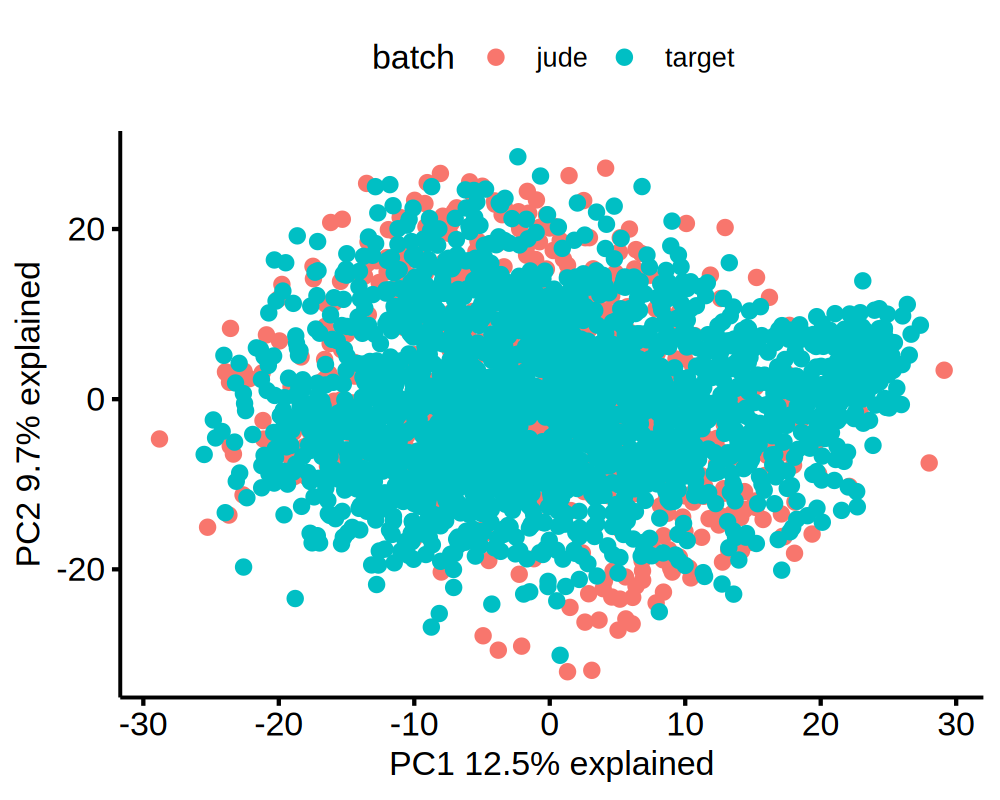

In [364]:
plotdat = pca_fun(logcpm_2c) 
mtx = merge(plotdat$plotdat, dsn_2c, by.x = 'rn', by.y = 'rn')
gg = ggscatter(mtx, x = 'PC1', y = 'PC2', color = 'batch') + xlab(plotdat$labx) + ylab(plotdat$laby)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
gg

In [90]:
rm(mtx, plotdat) 


In [ ]:
logcpm_2c_dt = as.data.table(t(logcpm_2c), keep.rownames = T)
head(logcpm_2c_dt)


# checking the expression of related genes

Warning message:
"The melt generic in data.table has been passed a matrix and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(logcpm_2c[genes, ]). In the next version, this warning will become an error."
Warning message:
"Removed 2851 rows containing missing values (`geom_text_repel()`)."


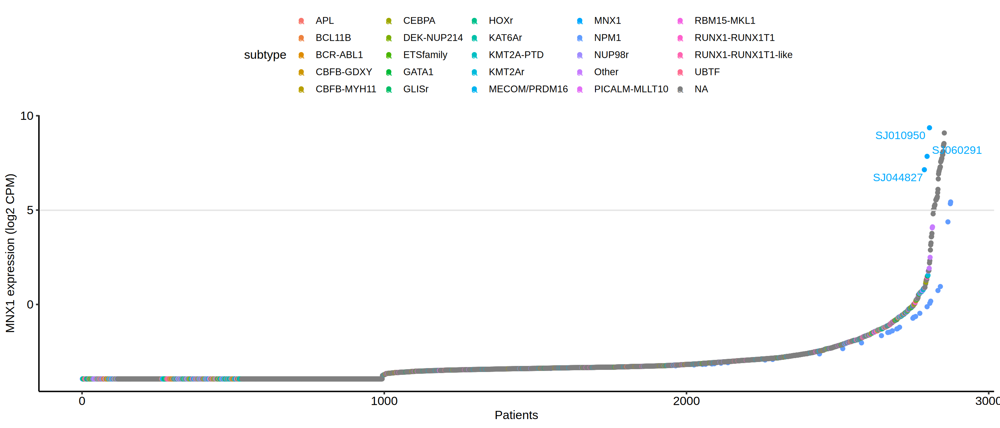

In [349]:
gene_sel = c('MNX1', 'ETV6', 'NOM1')
plotdat = as.data.table(melt(logcpm_2c[genes, ])) 
setnames(plotdat, c('gene_name', 'sample_name', 'logcpm'))
plotdat = plotdat[gene_name == 'MNX1', ]
plotdat = merge(plotdat, dsn_2c[, .(rn, subtype)], by.x = 'sample_name', by.y = 'rn', all.x = T)
plotdat = plotdat[order(logcpm), ]

plotdat$xx = 1:nrow(plotdat)
plotdat[subtype == 'MNX1', xx := xx - 50 ]
plotdat[subtype == 'NPM1', xx := xx + 50 ]
plotdat[subtype == 'MNX1', lbl := sub('_.*', '', sample_name)]
options(repr.plot.width = 14, repr.plot.height = 6, repr.plot.res = 200)
ggplot(plotdat, aes(x = xx, y = logcpm, label = lbl, color = subtype)) + geom_point() + theme_pubr() +
ggrepel::geom_text_repel() + xlab('Patients') + ylab('MNX1 expression (log2 CPM)') + #geom_vline(xintercept = 660, color = 'grey90') +
geom_hline(yintercept = 5, color = 'grey90')

sample_order = plotdat$sample_name


In [146]:
tmp = plotdat[logcpm > 2, ]
mnx_id_logcpm2 = tmp$sample_name
dim(tmp)
head(tmp)
length(mnx_id_logcpm2)


[1] 51  6

sample_name,gene_name,logcpm,subtype,xx,lbl
<chr>,<fct>,<dbl>,<chr>,<int>,<chr>
TARGET-20-PARTYK,MNX1,2.201355,NA,2804,TARGET-20-PARTYK
TARGET-20-PAVDNF,MNX1,2.320144,NA,2805,TARGET-20-PAVDNF
SJ030416,MNX1,2.496197,Other,2806,SJ030416
TARGET-20-PAPZJT,MNX1,2.885061,NA,2807,TARGET-20-PAPZJT
TARGET-20-PANLJN,MNX1,3.158310,NA,2808,TARGET-20-PANLJN
TARGET-20-PAWWRG,MNX1,3.261136,NA,2809,TARGET-20-PAWWRG


[1] 51

Warning message:
"The melt generic in data.table has been passed a matrix and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(logcpm_2c[genes, ]). In the next version, this warning will become an error."
Warning message:
"Removed 8511 rows containing missing values (`geom_text_repel()`)."
Warning message:
"ggrepel: 34 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


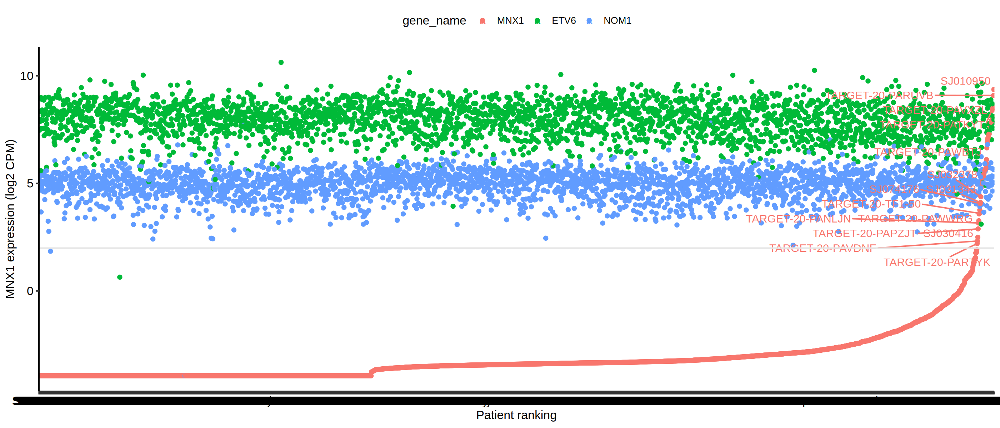

In [141]:
gene_sel = c('MNX1', 'ETV6', 'NOM1')
plotdat = as.data.table(melt(logcpm_2c[genes, ])) 
setnames(plotdat, c('gene_name', 'sample_name', 'logcpm'))
plotdat[, sample_name := factor(sample_name, levels = sample_order) ]
#plotdat = merge(plotdat, dsn_2c[, .(rn, subtype)], by.x = 'sample_name', by.y = 'rn', all.x = T)
#plotdat = plotdat[order(logcpm), ]

#plotdat$xx = 1:nrow(plotdat)
plotdat[gene_name == 'MNX1' & logcpm > 2, lbl := sub('_.*', '', sample_name)]
options(repr.plot.width = 14, repr.plot.height = 6, repr.plot.res = 200)
ggplot(plotdat, aes(x = sample_name, y = logcpm, label = lbl, color = gene_name)) + geom_point() + theme_pubr() +
ggrepel::geom_text_repel() + xlab('Patient ranking') + ylab('MNX1 expression (log2 CPM)') + #geom_vline(xintercept = 660, color = 'grey90') +
geom_hline(yintercept = 2, color = 'grey90')


In [149]:
dat = logcpm_2c[, mnx_id_logcpm2]
ii_row = dat['MNX1', ]
cor_list = lapply(1:nrow(logcpm_2c), function(jj){
    jj_row = dat[jj, ] 
    cor(ii_row, jj_row) 
})
cor_list = unlist(cor_list)
names(cor_list) = rownames(dat)
cor_dt = as.data.table(cor_list, keep.rownames = T)  
setnames(cor_dt, 2, 'rr')

tmp = lapply(1:nrow(logcpm_2c), function(jj){
    jj_row = dat[jj, ] 
    unname(unlist(cor.test(ii_row, jj_row)[3])) 
})
tmp = unlist(tmp)
names(tmp) = rownames(dat)
tmp = as.data.table(tmp, keep.rownames = T)  
setnames(tmp, 2, 'pval')

cor_dt = merge(cor_dt, tmp, by = 'rn')
cor_dt = cor_dt[order(pval), ]
head(cor_dt) 


rn,rr,pval
<chr>,<dbl>,<dbl>
MNX1,1.0000000,0.000000e+00
KIT,0.7249314,1.795389e-09
ADAMTS10,0.7023054,9.279933e-09
TTC39C,-0.6987288,1.186572e-08
COL6A1,0.6980277,1.244627e-08
ABCC1,0.6969386,1.340130e-08


In [369]:
mnx_ids
mnx_ids_2
sname_mnx_high
sname_mnx_high_fusion

[1] "TARGET-20-PARUNX" "TARGET-20-PASIBG" "TARGET-20-PAWUTL" "TARGET-20-PAVXZL" "TARGET-20-PAXMPG" "TARGET-20-PAXHGR" "TARGET-20-PAUYCA" "TARGET-20-PAWNHH" "TARGET-20-PAVCJB"
[10] "TARGET-20-PAXEWS" "TARGET-20-PAVXPB" "TARGET-20-PAWBTJ" "TARGET-20-PAVFDW" "TARGET-20-PAVAAM" "TARGET-20-PAWNYK" "TARGET-20-PAVNGY" "TARGET-20-PAWYKA" "TARGET-20-PAVDGM"
[19] "TARGET-20-PAWMLK" "TARGET-20-PAUYZY" "TARGET-21-PASVJS" "TARGET-20-PAUSBP" "TARGET-20-PAXKAL" "TARGET-20-PAWMLK" "TARGET-20-PAUYZY" "TARGET-21-PASVJS" "TARGET-20-PAUSBP"
[28] "TARGET-20-PAXKAL"

[1] "TARGET-20-PARUNX" "TARGET-20-PASIBG" "TARGET-20-PAUSBP" "TARGET-20-PAUYCA" "TARGET-20-PAUYZY" "TARGET-20-PAVAAM" "TARGET-20-PAVCJB" "TARGET-20-PAVDGM" "TARGET-20-PAVFDW"
[10] "TARGET-20-PAVNGY" "TARGET-20-PAVXPB" "TARGET-20-PAVXZL" "TARGET-20-PAWBTJ" "TARGET-20-PAWJDM" "TARGET-20-PAWMLK" "TARGET-20-PAWNHH" "TARGET-20-PAWNYK" "TARGET-20-PAWUTL"
[19] "TARGET-20-PAWYKA" "TARGET-20-PAXEWS" "TARGET-20-PAXHGR" "TARGET-20-PAXKAL" "TARGET-20-PAXMPG" "TARGET-21-PASVJS"

[1] "TARGET-20-PAXEWS" "TARGET-20-PAWNHH" "TARGET-20-PALISI" "TARGET-20-PARUVB" "TARGET-20-PAWBTJ" "TARGET-20-PASIZB" "TARGET-20-PASIBG" "TARGET-20-PAUYCA" "TARGET-20-PAUSBP"
[10] "TARGET-20-PAXHGR" "TARGET-20-MUTZ3-" "TARGET-20-PATHPT" "TARGET-20-PAWMLK" "TARGET-20-PARUNX" "TARGET-20-PATKYT" "TARGET-20-PATJWN" "TARGET-20-PAVXPB" "TARGET-20-PAXMPG"
[19] "TARGET-20-PAWUTL" "TARGET-20-PAWJDM" "TARGET-20-PAVCJB" "TARGET-20-PAWNYK" "TARGET-20-PAUPPD" "TARGET-21-PASVJS" "TARGET-20-IGROV1" "TARGET-20-PAVXZL" "TARGET-20-PANXAF"
[28] "TARGET-20-PAVNGY" "TARGET-20-PAVAAM" "TARGET-20-PAVFDW" "TARGET-20-PASIEE" "TARGET-20-PAWYKA" "TARGET-20-PATBPW" "SJ015345"         "SJ016529"         "SJ044827"        
[37] "SJ060291"         "SJ010950"         "TARGET-20-PAWMUZ"

[1] "TARGET-20-PAXEWS" "TARGET-20-PAWNHH" "TARGET-20-PAWBTJ" "TARGET-20-PASIBG" "TARGET-20-PARUNX" "TARGET-20-PATKYT" "TARGET-20-PAVXPB" "TARGET-20-PAXMPG" "TARGET-20-PAWNYK"
[10] "TARGET-20-PAVXZL" "TARGET-20-PANXAF" "SJ044827"         "TARGET-20-PAWMUZ"

In [365]:
sname_mnx_high_fusion

[1] "TARGET-20-PAXEWS" "TARGET-20-PAWNHH" "TARGET-20-PAWBTJ" "TARGET-20-PASIBG" "TARGET-20-PARUNX" "TARGET-20-PATKYT" "TARGET-20-PAVXPB" "TARGET-20-PAXMPG" "TARGET-20-PAWNYK"
[10] "TARGET-20-PAVXZL" "TARGET-20-PANXAF" "SJ044827"         "TARGET-20-PAWMUZ"

In [373]:
dsn_2c[grepl('SJ', rn) & subtype == 'MNX1', .(rn, subtype)]

rn,subtype
<chr>,<chr>
SJ010950,MNX1
SJ044827,MNX1
SJ060291,MNX1


In [ ]:
# no pathway up-regulated with top 50 genes
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 300)
yy <- enrichGO(cor_dt[1:150, rn], 'org.Hs.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
print(dotplot(yy))

In [135]:
logcpm_2c_dt = as.data.table(t(logcpm_2c), keep.rownames = T)
head(logcpm_2c_dt)


rn,A1BG,A1CF,A2M,A2ML1,A3GALT2,A4GALT,A4GNT,AAAS,AACS,⋯,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TARGET-20-PAVDAJ,2.6482448,-2.725879,3.132231,0.6402116,-1.0981837,2.1845004,-3.029916,4.540569,5.296453,⋯,3.749497,3.141652,3.926163,4.689317,6.530838,-2.725879,5.908482,6.840591,8.292647,6.156344
TARGET-20-PAXBXU,0.4223981,-3.943644,1.577462,1.7883685,-1.9087057,1.6095456,-2.920258,5.144327,5.051030,⋯,4.030345,4.270014,3.419881,4.837357,7.062009,-1.737503,5.393853,7.400513,8.212249,6.614970
TARGET-20-PAWDKU,1.8461646,-3.419491,4.185962,-1.0230962,-1.4028778,1.6894350,-3.035847,5.200241,4.407296,⋯,4.241305,3.899853,3.440369,4.583813,6.772649,-2.482977,5.340659,6.916957,7.959941,6.616896
TARGET-20-PAUVMN,1.2336799,-3.943644,2.881896,0.3695881,-1.2259674,0.5725866,-3.943644,5.883728,5.308723,⋯,4.369670,4.176282,3.271703,4.494498,6.967017,-3.049759,5.728490,6.619649,8.117530,6.747213
TARGET-20-PAXEWS,-1.0989213,-3.415882,4.266052,1.1303970,-1.5061731,3.1732996,-3.943644,5.265768,4.682023,⋯,4.012570,4.295876,2.917833,4.494500,6.385392,-1.628883,4.833500,7.793208,8.096826,6.153744
TARGET-20-PAWMLA,-0.2370203,-2.669630,3.200148,-2.2986333,-0.4936415,1.6566913,-2.003790,4.748920,5.028995,⋯,4.592352,4.894626,3.023343,4.616948,6.818772,-1.759098,5.542706,8.148896,8.010582,6.022453


In [157]:
cor_dt[1:50, rn]

[1] "MNX1"     "KIT"      "ADAMTS10" "TTC39C"   "COL6A1"   "ABCC1"    "ADCY9"    "LRRC8B"   "ZBTB46"   "ERMP1"    "DNAJC12"  "BAMBI"    "SPRY2"    "COL6A2"   "EMID1"    "ZNF121"  
[17] "SIGLEC6"  "SLC2A13"  "SH3RF1"   "TGFBR1"   "ITGA9"    "ZNF71"    "GRIP1"    "TATDN2"   "INPPL1"   "SNX24"    "CLIP3"    "ZNF474"   "DOCK6"    "MT1G"     "GPT2"     "MAPKBP1" 
[33] "ZNF551"   "ZNF532"   "CNTNAP5"  "ZNF304"   "MT1F"     "ITGB5"    "KCNK17"   "ZNF561"   "TMEM86A"  "DCBLD2"   "NR3C2"    "OAT"      "LRRK1"    "CCDC71L"  "MVB12B"   "MRAS"    
[49] "MN1"      "IL17RE"

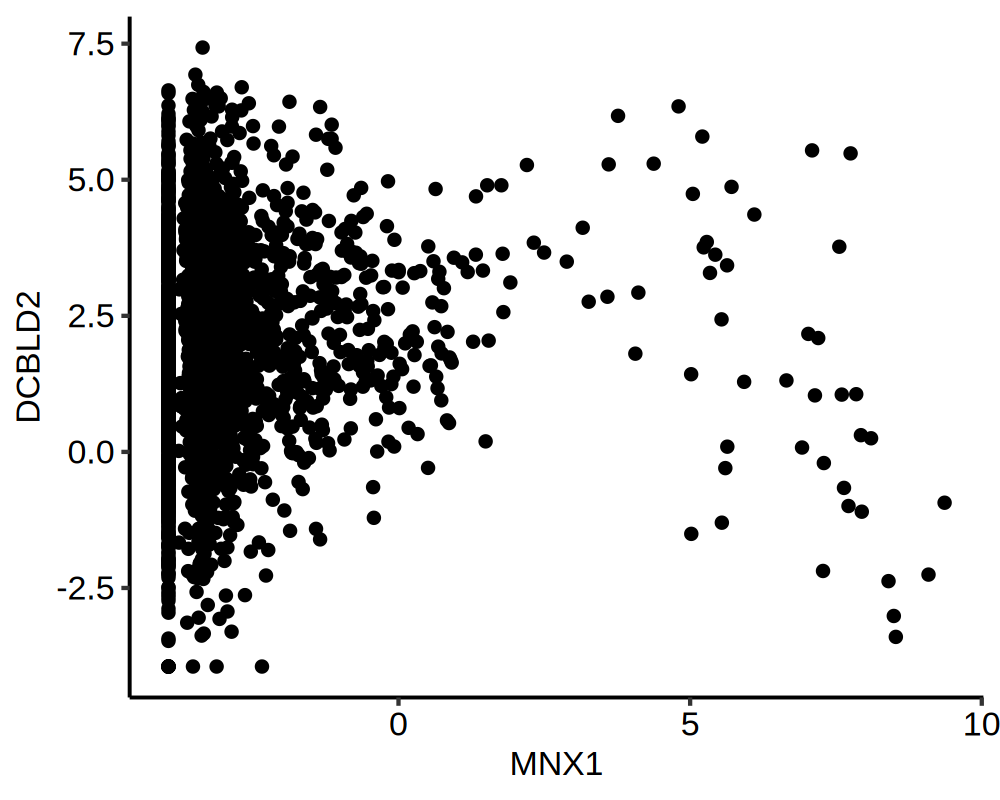

In [172]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
ggplot(logcpm_2c_dt, aes(MNX1, DCBLD2)) + geom_point() + theme_pubr()

In [414]:
genes = c('MNX1', 'ETV6', 'NOM1')
plotdat = as.data.table(melt(logcpm_2c[genes, ])) 
head(plotdat) 


Warning message:
"The melt generic in data.table has been passed a matrix and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(logcpm_2c[genes, ]). In the next version, this warning will become an error."


Var1,Var2,value
<fct>,<fct>,<dbl>
MNX1,TARGET-20-PAVDAJ,-3.029916
ETV6,TARGET-20-PAVDAJ,8.776571
NOM1,TARGET-20-PAVDAJ,4.735157
MNX1,TARGET-20-PAXBXU,-3.343049
ETV6,TARGET-20-PAXBXU,8.581516
NOM1,TARGET-20-PAXBXU,5.350607


In [422]:
table(dsn_2c_2$group)


other  mnx1 
 2816    38 

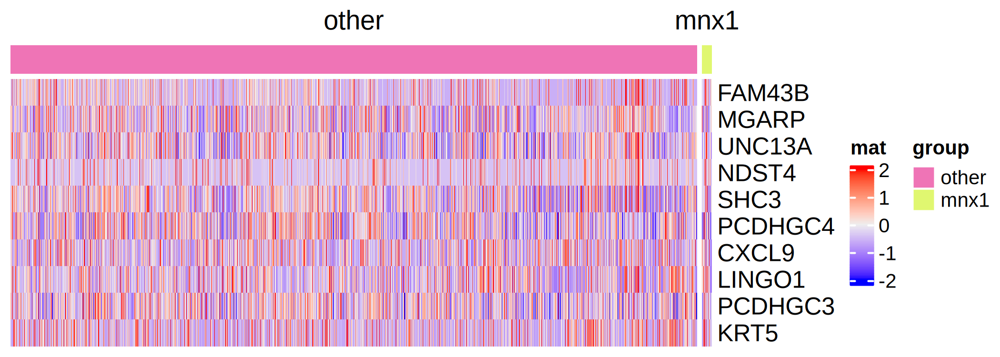

In [35]:
logcpm = logcpm_fun(tgt_df)

In [37]:
dim(logcpm)
head2(logcpm)

[1] 19938  3063

,TARGET-20-PAVDAJ-09A,TARGET-20-PAXBXU-09A,TARGET-20-PAWDKU-09A,TARGET-20-PAUVMN-09A,TARGET-20-PAUVMN-04A
A1BG,2.680471,0.3725671,1.779476,1.204463,0.6455179
A1CF,-2.604742,-4.1058659,-3.592595,-4.105866,-3.1919667
A2M,3.450119,2.1769027,4.236001,3.204539,4.1967758


In [36]:
saveRDS(logcpm, file = 'logcpm_target_3062cases_oct9.rds')

In [40]:
dsn = data.table(sample_name = colnames(tgt_dt)[2:3064])
dsn[, patient_name := substr(sample_name, 1, 16) ]
dim(dsn[!duplicated(patient_name), ])
head(dsn)


[1] 2184    2

sample_name,patient_name
<chr>,<chr>
TARGET-20-PAVDAJ-09A,TARGET-20-PAVDAJ
TARGET-20-PAXBXU-09A,TARGET-20-PAXBXU
TARGET-20-PAWDKU-09A,TARGET-20-PAWDKU
TARGET-20-PAUVMN-09A,TARGET-20-PAUVMN
TARGET-20-PAUVMN-04A,TARGET-20-PAUVMN
TARGET-20-PAXEWS-09A,TARGET-20-PAXEWS


In [19]:
logcpm_target_3063cases = readRDS('TARGET_logcpm_3063cases.xls')


In [38]:
head2(logcpm)


,TARGET-20-PAVDAJ-09A,TARGET-20-PAXBXU-09A,TARGET-20-PAWDKU-09A,TARGET-20-PAUVMN-09A,TARGET-20-PAUVMN-04A
A1BG,2.680471,0.3725671,1.779476,1.204463,0.6455179
A1CF,-2.604742,-4.1058659,-3.592595,-4.105866,-3.1919667
A2M,3.450119,2.1769027,4.236001,3.204539,4.1967758


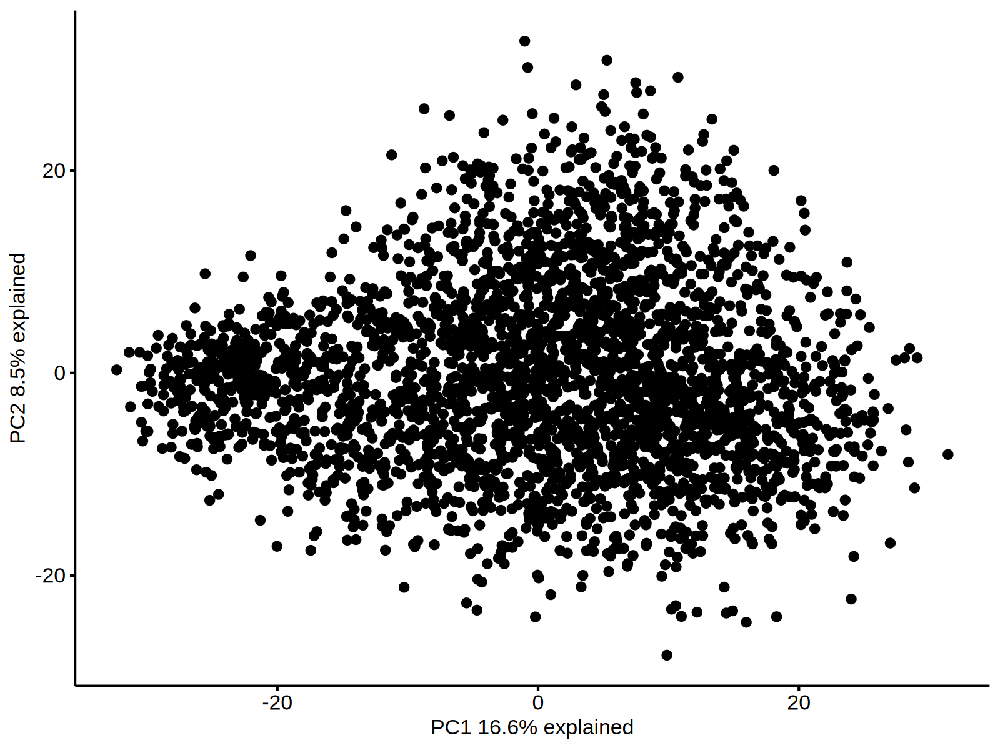

In [39]:
plotdat = pca_fun(logcpm)
options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 200)
ggscatter(plotdat$plotdat, x = 'PC1', y = 'PC2') + xlab(plotdat$labx) + ylab(plotdat$laby)


# DEG MNX1 high vs low

In [350]:
colnames(dsn_2c)

[1] "rn"      "batch"   "subtype" "group"

In [351]:
sname_mnx_high
sname_mnx_high_fusion

[1] "TARGET-20-PAXEWS" "TARGET-20-PAWNHH" "TARGET-20-PALISI" "TARGET-20-PARUVB" "TARGET-20-PAWBTJ" "TARGET-20-PASIZB" "TARGET-20-PASIBG" "TARGET-20-PAUYCA" "TARGET-20-PAUSBP"
[10] "TARGET-20-PAXHGR" "TARGET-20-MUTZ3-" "TARGET-20-PATHPT" "TARGET-20-PAWMLK" "TARGET-20-PARUNX" "TARGET-20-PATKYT" "TARGET-20-PATJWN" "TARGET-20-PAVXPB" "TARGET-20-PAXMPG"
[19] "TARGET-20-PAWUTL" "TARGET-20-PAWJDM" "TARGET-20-PAVCJB" "TARGET-20-PAWNYK" "TARGET-20-PAUPPD" "TARGET-21-PASVJS" "TARGET-20-IGROV1" "TARGET-20-PAVXZL" "TARGET-20-PANXAF"
[28] "TARGET-20-PAVNGY" "TARGET-20-PAVAAM" "TARGET-20-PAVFDW" "TARGET-20-PASIEE" "TARGET-20-PAWYKA" "TARGET-20-PATBPW" "SJ015345"         "SJ016529"         "SJ044827"        
[37] "SJ060291"         "SJ010950"         "TARGET-20-PAWMUZ"

[1] "TARGET-20-PAXEWS" "TARGET-20-PAWNHH" "TARGET-20-PAWBTJ" "TARGET-20-PASIBG" "TARGET-20-PARUNX" "TARGET-20-PATKYT" "TARGET-20-PAVXPB" "TARGET-20-PAXMPG" "TARGET-20-PAWNYK"
[10] "TARGET-20-PAVXZL" "TARGET-20-PANXAF" "SJ044827"         "TARGET-20-PAWMUZ"

In [232]:
sname_sel = names(logcpm_2c['MNX1',][logcpm_2c['MNX1',] > 5])
dsn_2c[, group := 'other']
dsn_2c[rn %in% sname_sel, group := 'mnx1']
dsn_2c[, group := factor(group, levels = c('other', 'mnx1'))]
table(dsn_2c$group)



other  mnx1 
 2816    38 

In [234]:
groups = dsn_2c$group
dge = DGEList(counts = mtx_2c, group = groups)
dge <- calcNormFactors(dge)
dge = normLibSizes(dge)
design = model.matrix(~0 + groups)
dge = estimateDisp(dge, design)
et <- exactTest(dge)
deg = topTags(et, n = nrow(logcpm_2c))
deg = as.data.table(deg$table, keep.rownames = T)
head(deg) 


rn,logFC,logCPM,PValue,FDR
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
FAM43B,4.456306,-2.8643624,2.294596e-65,4.089200e-61
MGARP,3.479836,-1.1984099,1.741641e-56,1.551889e-52
UNC13A,2.928740,-0.6375464,1.638047e-48,9.730546e-45
NDST4,5.452403,-1.7517652,3.314265e-40,1.476588e-36
SHC3,2.868206,-1.2769496,1.269311e-34,4.524080e-31
PCDHGC4,2.517180,0.4981319,9.134752e-30,2.713174e-26


In [406]:
head(deg, 15)

rn,logFC,logCPM,PValue,FDR,rank,logFDR,lbl
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
FAM43B,4.456306,-2.8643624,2.294596e-65,4.089200e-61,60.38836,60.38836,FAM43B
MGARP,3.479836,-1.1984099,1.741641e-56,1.551889e-52,51.80914,51.80914,MGARP
UNC13A,2.928740,-0.6375464,1.638047e-48,9.730546e-45,44.01186,44.01186,UNC13A
NDST4,5.452403,-1.7517652,3.314265e-40,1.476588e-36,35.83074,35.83074,NDST4
SHC3,2.868206,-1.2769496,1.269311e-34,4.524080e-31,30.34447,30.34447,SHC3
PCDHGC4,2.517180,0.4981319,9.134752e-30,2.713174e-26,25.56652,25.56652,PCDHGC4
CXCL9,3.154588,0.0904504,2.363485e-25,6.017096e-22,21.22061,21.22061,CXCL9
LINGO1,2.847699,-1.6608144,9.296971e-25,1.868512e-21,20.72850,20.72850,LINGO1
PCDHGC3,2.151534,2.4150081,1.006265e-24,1.868512e-21,20.72850,20.72850,PCDHGC3


In [ ]:
saveRDS(deg, file = 'deg_mnx1_high_vs_other.rds')
fwrite(deg, file = 'deg_mnx1_high_vs_other.xls', sep = '\t')

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
"There are ties in the preranked stats (62.36% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results."


pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
HALLMARK_E2F_TARGETS,3.268685e-06,0.0001634342,0.6272567,-0.6564203,-1.854898,195,"WDR90, P...."
HALLMARK_G2M_CHECKPOINT,3.193270e-04,0.0079831742,0.4984931,-0.5963037,-1.662175,188,"POLE, HO...."
HALLMARK_ALLOGRAFT_REJECTION,1.410203e-03,0.0235033766,0.4550599,0.8609077,1.669018,195,"CXCL9, G...."
HALLMARK_INTERFERON_GAMMA_RESPONSE,2.860108e-03,0.0357513542,0.4317077,0.8419604,1.631435,198,"CXCL9, I...."
HALLMARK_IL6_JAK_STAT3_SIGNALING,1.357369e-02,0.1357368612,0.3807304,0.8682446,1.621875,87,"CXCL9, I...."
HALLMARK_KRAS_SIGNALING_DN,5.197740e-02,0.4331450094,0.2089550,0.7479542,1.453248,193,"KRT5, TE...."


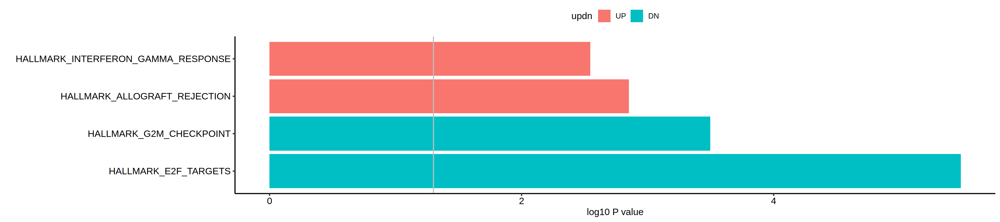

In [236]:
ranking = ranking_fun(deg) 

#pathwaysDF <- msigdbr(species = "Mus musculus", category="H") #, subcategory = 'immunesigdb') 
pathwaysDF <- msigdbr(species = "Homo sapiens", category="H") #, subcategory = 'VAX') 
pathways <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)

fgsea <- fgsea(pathways = pathways, stats = ranking, eps = 0.0, minSize = 15, maxSize = 500)
fgseaRes = as.data.table(fgsea)
fgseaRes = fgseaRes[order(padj), ]
head(fgseaRes)

fgseaRes[, logFDR := -log(pval, 10)] 
fgseaRes[NES > 0, updn := 'UP']
fgseaRes[NES < 0, updn := 'DN']
fgseaRes[, updn := factor(updn, levels = c('UP', 'DN'))]
plotdat = fgseaRes[padj < 0.1, ]
plotdat[, pathway := factor(pathway, levels = plotdat$pathway)] 

options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr() + geom_hline(yintercept = -log(0.05, 10), color = 'grey')  + ylab('log10 P value') + xlab('')


In [352]:
dsn_2c[, group_fusion := 'No_fusion'] 
dsn_2c[rn %in% sname_mnx_high_fusion, group_fusion := 'fusion'] 

In [353]:
groups = dsn_2c$group_fusion
dge = DGEList(counts = mtx_2c, group = groups)
dge <- calcNormFactors(dge)
dge = normLibSizes(dge)
design = model.matrix(~0 + groups)
dge = estimateDisp(dge, design)
et <- exactTest(dge)
deg_fusion = topTags(et, n = nrow(logcpm_2c))
deg_fusion = as.data.table(deg_fusion$table, keep.rownames = T)
head(deg_fusion) 


rn,logFC,logCPM,PValue,FDR
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
FAM43B,-5.935772,-2.8643631,9.472062e-73,1.688016e-68
UNC13A,-4.312055,-0.6375455,3.044792e-58,2.713062e-54
NDST4,-6.966306,-1.7517657,3.456966e-43,2.053553e-39
SHC3,-4.229222,-1.2769491,5.742900e-41,2.558605e-37
LINGO1,-4.317693,-1.6608134,3.518705e-32,1.254137e-28
ETV4,-3.181470,0.8062823,1.016842e-24,3.020190e-21


In [355]:
saveRDS(deg_fusion, file = 'deg_fusion_mnx1_high_vs_other.rds')
fwrite(deg_fusion, file = 'deg_fusion_mnx1_high_vs_other.xls', sep = '\t')

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
"There are ties in the preranked stats (58.58% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results."


pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
HALLMARK_ADIPOGENESIS,6.918787e-05,0.003459394,0.5384341,0.5577708,1.641993,192,"MGLL, CD...."
HALLMARK_HYPOXIA,5.021286e-03,0.125532147,0.4070179,0.4798738,1.412621,191,"TKTL1, C...."
HALLMARK_INTERFERON_ALPHA_RESPONSE,8.864066e-03,0.147734432,0.3807304,-0.8690099,-1.737925,95,"LAMP3, U...."
HALLMARK_INTERFERON_GAMMA_RESPONSE,2.013251e-02,0.251656327,0.3524879,-0.8278095,-1.724432,198,"USP18, Z...."
HALLMARK_ALLOGRAFT_REJECTION,3.703704e-02,0.308641975,0.2616635,-0.7982975,-1.660879,195,"GZMB, IL...."
HALLMARK_KRAS_SIGNALING_UP,3.615960e-02,0.308641975,0.2663507,-0.8015325,-1.661054,191,"ETV4, PL...."


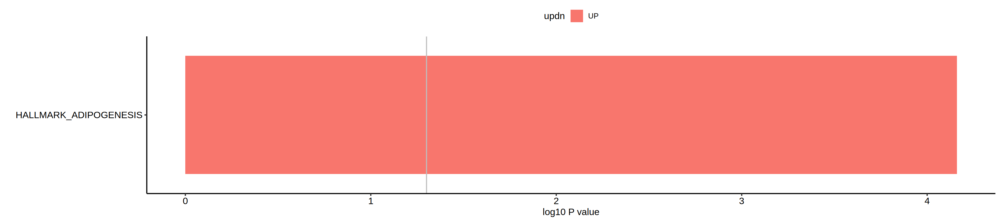

In [356]:
ranking = ranking_fun(deg_fusion) 

#pathwaysDF <- msigdbr(species = "Mus musculus", category="H") #, subcategory = 'immunesigdb') 
pathwaysDF <- msigdbr(species = "Homo sapiens", category="H") #, subcategory = 'VAX') 
pathways <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)

fgsea <- fgsea(pathways = pathways, stats = ranking, eps = 0.0, minSize = 15, maxSize = 500)
fgseaRes = as.data.table(fgsea)
fgseaRes = fgseaRes[order(padj), ]
head(fgseaRes)

fgseaRes[, logFDR := -log(pval, 10)] 
fgseaRes[NES > 0, updn := 'UP']
fgseaRes[NES < 0, updn := 'DN']
fgseaRes[, updn := factor(updn, levels = c('UP', 'DN'))]
plotdat = fgseaRes[padj < 0.1, ]
plotdat[, pathway := factor(pathway, levels = plotdat$pathway)] 

options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr() + geom_hline(yintercept = -log(0.05, 10), color = 'grey')  + ylab('log10 P value') + xlab('')


In [217]:
length(gene_sel) 


[1] 250

In [357]:
dim(logcpm_2c)

[1] 17821  2854

In [358]:
2854 - 670

[1] 2184

[1]   63 2854

`use_raster` is automatically set to TRUE for a matrix with more than 2000 columns You can control `use_raster` argument by explicitly setting TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



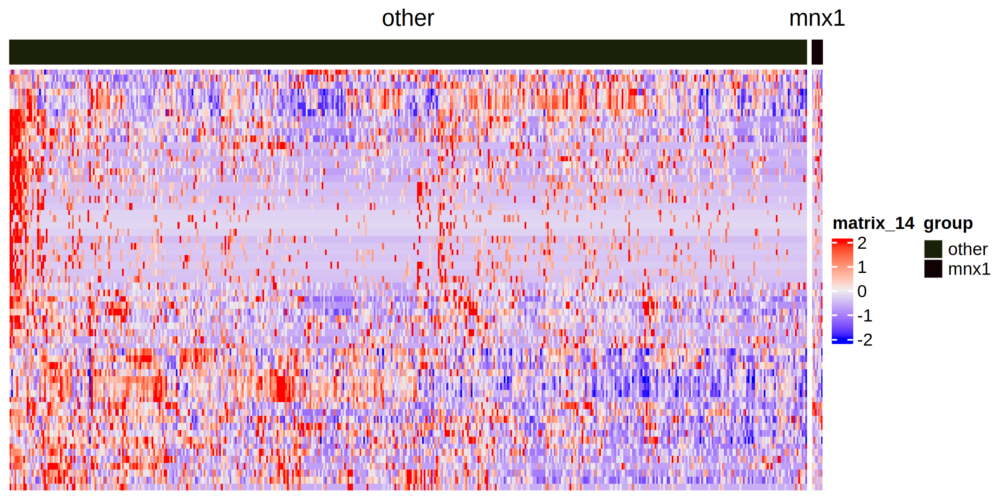

In [442]:
gene_sel = deg[abs(logFC) > 1.5 & FDR < .001, rn]
plotdat = logcpm_2c[gene_sel, dsn_2c$rn] 
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
dim(plotdat)

column_ha = HeatmapAnnotation(df = dsn_2c[, 'group', drop = F], show_annotation_name = F)

options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = T, 
        cluster_rows = T,  #row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, column_split = dsn_2c$group) 


In [243]:
dim(plotdat)

[1]  152 2854

In [238]:
deg[, logFDR := -log(FDR, 10) ]

Warning message:
"Removed 17811 rows containing missing values (`geom_text_repel()`)."


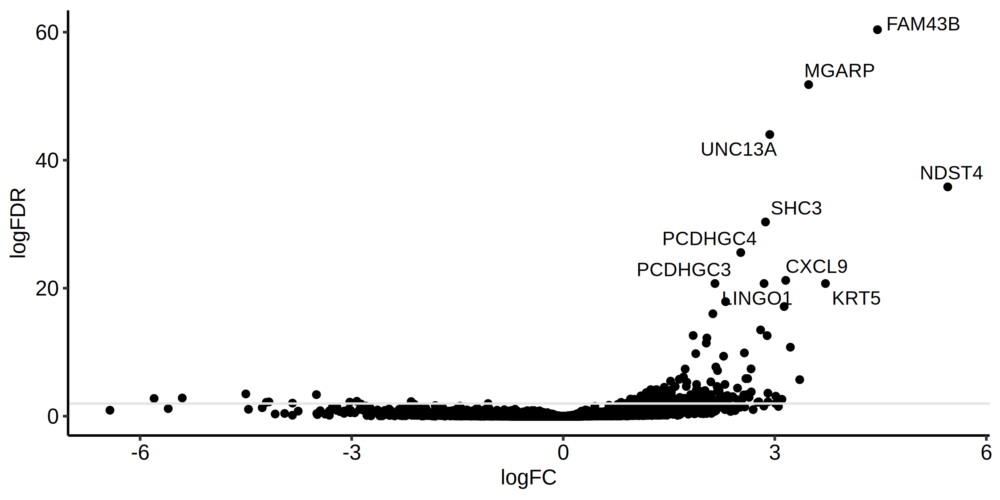

In [245]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 300)
deg[logFDR > 20, lbl := rn ]
ggplot(deg, aes(x = logFC, y = logFDR, label = lbl)) + geom_point() + theme_pubr() +
ggrepel::geom_text_repel() + geom_hline(yintercept = -log(0.01, 10), color = 'grey90')

In [436]:
genes = c('FAM43B', 'MGARP', 'UNC13A', 'NDST4', 'SHC3', 'PCDHGC4', 'CXCL9', 'LINGO1', 'PCDHGC3', 'KRT5')
genes


[1] "FAM43B"  "MGARP"   "UNC13A"  "NDST4"   "SHC3"    "PCDHGC4" "CXCL9"   "LINGO1"  "PCDHGC3" "KRT5"

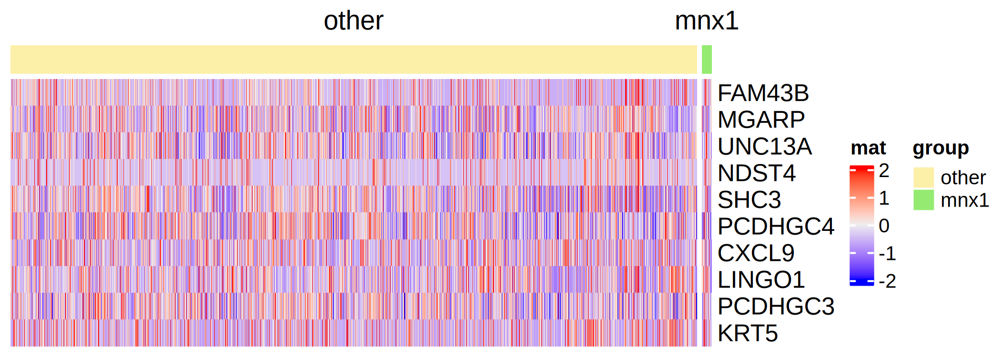

In [428]:
plotdat = logcpm_2c[deg[1:10, rn], ]
plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_2c_2[, 'group', drop = F], show_annotation_name = F)
#column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F)

options(repr.plot.width = 7, repr.plot.height = 2.5, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  #row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, #left_annotation = column_ra, 
        column_split = factor(dsn_2c_2$group, levels = c('other', 'mnx1')))  


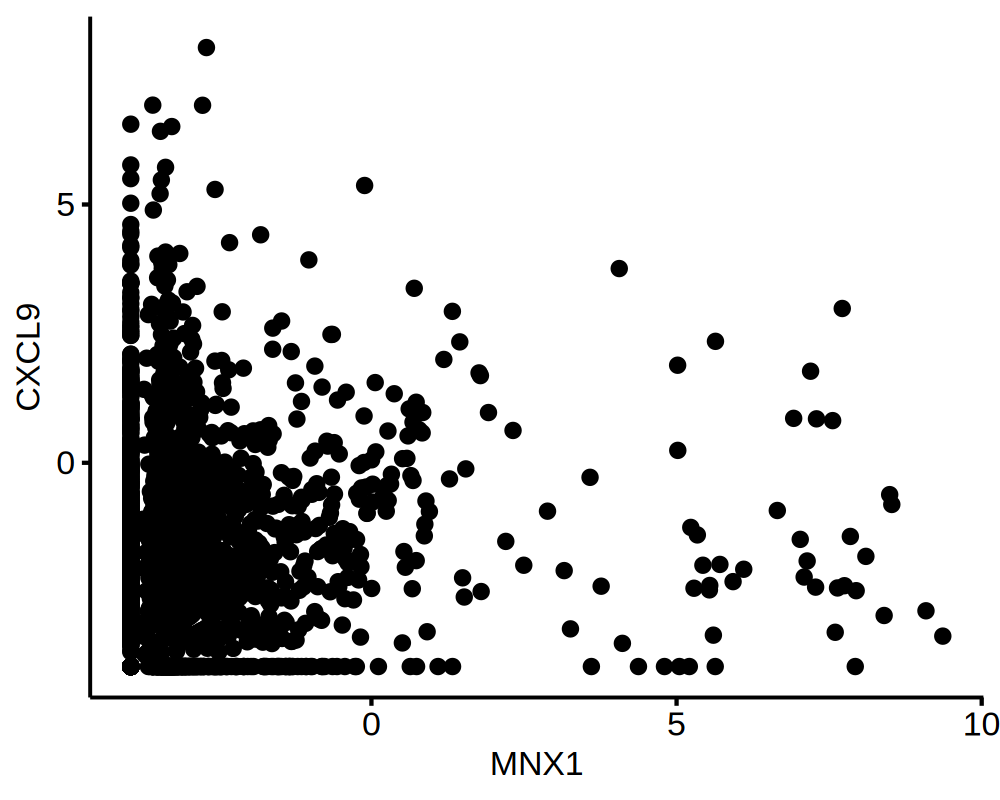

In [411]:
plotdat = as.data.table(t(logcpm_2c[c('MNX1', 'CXCL9'), ]), keep.rownames = T)
ggscatter(plotdat, x = 'MNX1', y = 'CXCL9')

In [385]:
dsn_2c_2$cxcl9 = logcpm_2c['CXCL9', ][ dsn_2c_2$rn]

In [391]:
table(dsn_2c_2$group)


other  mnx1 
 2816    38 

In [399]:
stat.test = t_test(cxcl9 ~ group, data = dsn_2c_2)
stat.test

,.y.,group1,group2,n1,n2,statistic,df,p
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>
1,cxcl9,other,mnx1,2816,38,-1.268901,38.00428,0.212


In [405]:
stat.test <- dsn_2c_2 %>%
  t_test(cxcl9 ~ group) %>%
  add_significance()
stat.test


.y.,group1,group2,n1,n2,statistic,df,p,p.signif
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>
cxcl9,other,mnx1,2816,38,-1.268901,38.00428,0.212,ns


In [403]:
stat.test <- stat.test %>% add_xy_position(x = "MNX1 subtype")
stat.test


.y.,group1,group2,n1,n2,statistic,df,p,y.position,groups,xmin,xmax
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<named list>,<dbl>,<dbl>
cxcl9,other,mnx1,2816,38,-1.268901,38.00428,0.212,8.64412,"other, mnx1",NA,NA


In [408]:
library(rstatix)

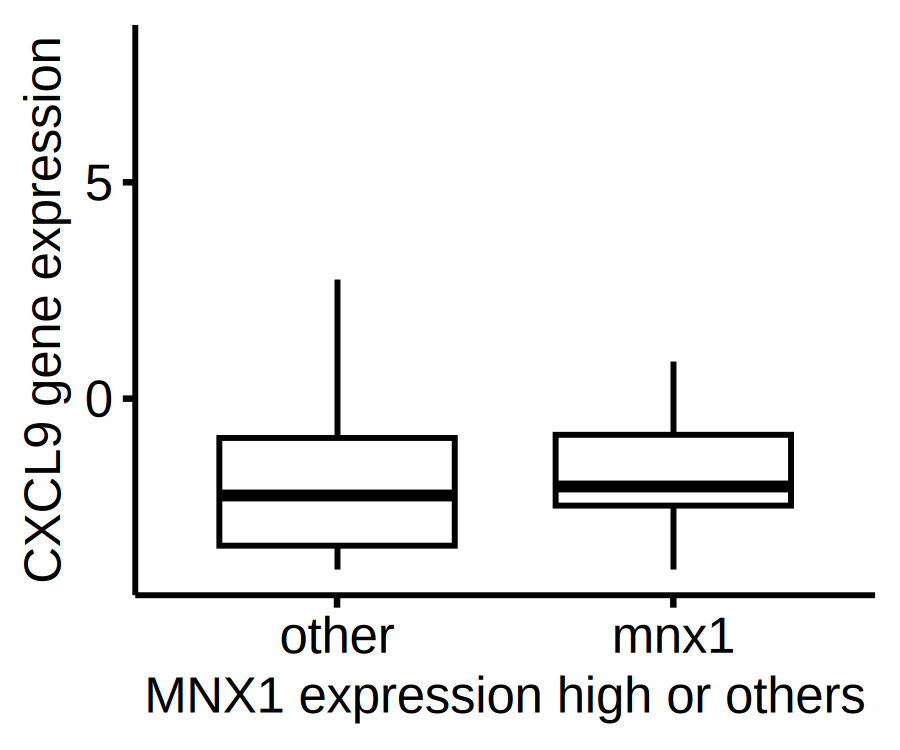

In [432]:
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
ggboxplot(dsn_2c_2, x = 'group', y = 'cxcl9', outlier.shape = NA) + xlab('MNX1 expression high or others') + ylab('CXCL9 gene expression')


In [446]:
tmp1

[1] "TARGET-20-PAXEWS" "TARGET-20-PAWNHH" "TARGET-20-PALISI" "TARGET-20-PARUVB" "TARGET-20-PAWBTJ" "TARGET-20-PASIZB" "TARGET-20-PASIBG" "TARGET-20-PAUYCA" "TARGET-20-PAUSBP"
[10] "TARGET-20-PAXHGR" "TARGET-20-MUTZ3-" "TARGET-20-PATHPT" "TARGET-20-PAWMLK" "TARGET-20-PARUNX" "TARGET-20-PATKYT" "TARGET-20-PATJWN" "TARGET-20-PAVXPB" "TARGET-20-PAXMPG"
[19] "TARGET-20-PAWUTL" "TARGET-20-PAWJDM" "TARGET-20-PAVCJB" "TARGET-20-PAWNYK" "TARGET-20-PAUPPD" "TARGET-21-PASVJS" "TARGET-20-IGROV1" "TARGET-20-PAVXZL" "TARGET-20-PANXAF"
[28] "TARGET-20-PAVNGY" "TARGET-20-PAVAAM" "TARGET-20-PAVFDW" "TARGET-20-PASIEE" "TARGET-20-PAWYKA" "TARGET-20-PATBPW" "SJ015345"         "SJ016529"         "SJ044827"        
[37] "SJ060291"         "SJ010950"

In [387]:
head(dsn_2c_2[, .(cxcl9, subtype)])

cxcl9,subtype
<dbl>,<chr>
-2.3694542,CBFB-MYH11
-3.2454127,RUNX1-RUNX1T1
-0.6058607,KMT2Ar
-2.4043453,NUP98r
-3.9436440,NUP98r
-3.9436440,NPM1


In [ ]:
stat.test <- df %>%
  t_test(len ~ supp) %>%
  add_significance()
stat.test


In [ ]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 300)
deg[logFDR > 20, lbl := rn ]
ggplot(deg, aes(x = logFC, y = logFDR, label = lbl)) + geom_point() + theme_pubr() +
ggrepel::geom_text_repel() + geom_hline(yintercept = -log(0.01, 10), color = 'grey90')

# downwload fusion gene information

## load jude fusion analysis

In [1]:
# load jude fusion analysis
jude_fusion_dt = readRDS('~/WenhuoHu/dataset/pediatrics/arriba_fusion_dt_jude670cases.rds')

In [4]:
length(unique(jude_fusion_dt$.id))

[1] 559

In [3]:
dim(jude_fusion_dt)
head(jude_fusion_dt)

[1] 23334    38

.id,gene1,gene2,strand1,strand2,breakpoint1,breakpoint2,site1,site2,type,⋯,fusion_transcript,peptide_sequence,read_identifiers,FusionName,left_chr,left_pos,right_chr,right_pos,subtype,sample_name
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SJ000089,CBFB,MYH11,+/+,-/-,16:67082308,16:15721051,CDS/splice-site,CDS/splice-site,inversion,⋯,ATGGGCTGTCTGGAGTTTGATGAGGAGCGAGCCCAG___CAGGAGGATGCATTAGCACAACAGGCCTTTGAAGAGGCTCGGAGAAGGACACGCGAATTTGAAGATAGAGACAGGTCTCATCGGGAGGAAATGGAG|GTCCATGAGCTGGAGAAGTCCAAGCGGGCCCTGGAGACCCAGATGGAGGAGATGAAGACGCAGCTGGAAGAGCTGGAGGACGAGCTGCAAGCCACGGAGGACGCCAAACTGCGGCTGGAAGTCAACATGCAGGCGCTCAAGGGCCAGTTCGAAAGGGATCTCCAAGCCCGGGACGAGCA,MGCLEFDEERAQQEDALAQQAFEEARRRTREFEDRDRSHREEME|VHELEKSKRALETQMEEMKTQLEELEDELQATEDAKLRLEVNMQALKGQFERDLQARDE,"HWI-ST1188:161:C5G7TACXX:2:1106:7923:54600,HWI-ST1188:161:C5G7TACXX:2:1115:9463:44893,HWI-ST1188:161:C5G7TACXX:2:1201:1782:23603,HWI-ST1188:161:C5G7TACXX:2:1201:17859:27090,HWI-ST1188:161:C5G7TACXX:2:1216:8237:6485,HWI-ST1188:161:C5G7TACXX:2:1302:9226:52324,HWI-ST1188:161:C5G7TACXX:2:1303:11302:66959,HWI-ST1188:161:C5G7TACXX:2:1303:2127:38763,HWI-ST1188:161:C5G7TACXX:2:1307:15976:96520,HWI-ST1188:161:C5G7TACXX:2:1308:2137:2386,HWI-ST1188:161:C5G7TACXX:2:2101:7886:96192,HWI-ST1188:161:C5G7TACXX:2:2102:7843:24626,HWI-ST1188:161:C5G7TACXX:2:2106:17778:13322,HWI-ST1188:161:C5G7TACXX:2:2108:6955:58111,HWI-ST1188:161:C5G7TACXX:2:2208:14260:58274,HWI-ST1188:161:C5G7TACXX:2:2215:16569:46285,HWI-ST1188:161:C5G7TACXX:2:2305:8339:20919,HWI-ST1188:161:C5G7TACXX:2:2306:5162:76534,HWI-ST1188:161:C5G7TACXX:2:2307:13727:93577,HWI-ST1188:161:C5G7TACXX:2:1111:20168:93051,HWI-ST1188:161:C5G7TACXX:2:1112:2907:61785,HWI-ST1188:161:C5G7TACXX:2:1115:14903:61707,HWI-ST1188:161:C5G7TACXX:2:1202:13841:17295,HWI-ST1188:161:C5G7TACXX:2:1203:5138:72917,HWI-ST1188:161:C5G7TACXX:2:1209:6718:57265,HWI-ST1188:161:C5G7TACXX:2:1213:17085:15504,HWI-ST1188:161:C5G7TACXX:2:2105:10148:42463,HWI-ST1188:161:C5G7TACXX:2:2105:10148:42463,HWI-ST1188:161:C5G7TACXX:2:2106:10391:91815,HWI-ST1188:161:C5G7TACXX:2:2107:8521:13882,HWI-ST1188:161:C5G7TACXX:2:2208:15212:63240,HWI-ST1188:161:C5G7TACXX:2:2214:15275:41011,HWI-ST1188:161:C5G7TACXX:2:2308:15062:41888,HWI-ST1188:161:C5G7TACXX:2:1111:18499:5668,HWI-ST1188:161:C5G7TACXX:2:1304:5477:72199,HWI-ST1188:161:C5G7TACXX:2:2112:13783:45220,HWI-ST1188:161:C5G7TACXX:2:2207:12349:6565,HWI-ST1188:161:C5G7TACXX:2:2304:20697:95613,HWI-ST1188:161:C5G7TACXX:2:2312:11023:11153,HWI-ST1188:161:C5G7TACXX:2:2313:9131:32121",CBFB-MYH11,chr16,67082308,chr16,15721051,CBFB-MYH11,SJ000089
SJ000089,KNL1,KNL1,+/+,+/+,15:40650819,15:40641485,intron,intron,duplication,⋯,GGGATTCTGAAATGAGAGCTGCAGAAAAAG___AATTGGAACAGCTGAAAACTGAAGAAGAGGAGCTTCAAAG___...GTTTTGAAGCACTTATTGTTTACAGGGCATTTATCCACAACAGTGTTTCTCAAGCTTGAATACTACCA|AAATCTGAAATGCTCCAAAATCCAAAATGTTTTAGCCACCAACATGATGCAAGTGGAAAATTCCACACATAAATAC___ATTAAAGCTTTCTGCATCGAACCAAGATAAGCTGTTGGTTGATATAAATAAGAACCTGTG...TTAACAAAATAAAGTCATGTTTTACCAAGATGACTAAAGTCTTCACTCACCAAGGAAAAGTGGCTCTGTATGGCAAGCTGGTGCAGTCAGCTCAG___AATGAG,.,"HWI-ST1188:161:C5G7TACXX:2:2105:8109:65786,HWI-ST1188:161:C5G7TACXX:2:2216:4808:45521,HWI-ST1188:161:C5G7TACXX:2:2309:6166:69400,HWI-ST1188:161:C5G7TACXX:2:2310:15079:3839,HWI-ST1188:161:C5G7TACXX:2:1309:14993:70986,HWI-ST1188:161:C5G7TACXX:2:2210:6549:99958",KNL1-KNL1,chr15,40650819,chr15,40641485,CBFB-MYH11,SJ000089
SJ000089,FHOD1,NDE1,-/-,+/+,16:67247210,16:15724191,CDS/splice-site,CDS/splice-site,inversion,⋯,CCAACTTTCCGGAGCCGCGCCGGGCCCCCACCTGCAGCCTGGACGGGGCGCTGCCCTTGGGCGCGCAGATACCCGCGGTGCACCGCCTGCTGGGAGCGCCGCTCAAG|GTTGGACACGAGTTGCCGCTGGTTGTCCAAATCAACAACCAGGTCGTCCAGCTCCTGCTGAAGCCTGTTCTTGGTCTTTTCCAGTTTATCATAcGCGGCCGCCTTCTCCTCGTACTGCTGGGTGAGGTTCTCGATCTCCTTCTGGAACCTCTTCTTCCCCTCTTCCAGAGCTTCCAC,NFPEPRRAPTCSLDGALPLGAQIPAVHRLLGAPLK|VGHELPLVVQINNQVVQLLLKPVLGLFQFIIrGRLLLVLLGEVLDLLLEPLLPLFQSF,"HWI-ST1188:161:C5G7TACXX:2:1301:16554:45526,HWI-ST1188:161:C5G7TACXX:2:1302:11238:74053,H

## load fusion analysis from GDC for TARGET samples

In [ ]:
query = GDCquery(
    project = "TCGA-ACC",
    data.category = "Proteome Profiling",
    sample.type = "Primary Tumor", 
    legacy = FALSE)

manifest <- getManifest(query)
TCGAbiolinks:::GDCdownload.aux(
    server = "https://api.gdc.cancer.gov/data/",
    manifest = manifest,
    name = "test.tar.gz",
    path = "Test"
)


In [ ]:
query <- GDCquery(project = "TARGET-AML", data.category = 'Structural Variation') 


In [561]:
res = as.data.table(getResults(query))

In [568]:
fwrite(res, file = 'GDCdata/TARGET-AML/fusion/manifest_targetAML_sv.tsv', sep = '\t')

In [566]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat"

In [565]:
res = res[data_format == 'TSV', ]
dim(res)
fwrite(res, file = 'manifest_fusion_target.tsv', sep = '\t')
datatable(head(res))

[1] 6362   30

HTML widgets cannot be represented in plain text (need html)

In [6]:
res = fread('manifest_fusion_target.tsv')

In [7]:
res[, fname := paste0('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/GDCdata/TARGET-AML/fusion/', id, '/', file_name) ]

In [8]:
table(res$analysis_workflow_type)


     Arriba STAR-Fusion 
       3181        3181 

In [10]:
tmp = res[analysis_workflow_type == 'STAR-Fusion', ]
star_fusion_list = lapply(tmp$fname, function(fname){fread(fname)})
names(star_fusion_list) = tmp$sample.submitter_id
star_fusion_dt = rbindlist(star_fusion_list, idcol = T, fill = T)
star_fusion_dt$pipeline = 'STAR-Fusion'
setnames(star_fusion_dt, 2, 'FusionName')
star_fusion_dt[, patient_name := substr(.id, 1, 16) ]
head(star_fusion_dt) 


.id                  FusionName     JunctionReadCount SpanningFragCount SpliceType          LeftGene                 LeftBreakpoint    RightGene                  RightBreakpoint  
1 TARGET-20-PAVDAJ-09A HUWE1--WNK3     5                  4               ONLY_REF_SPLICE     HUWE1^ENSG00000086758.16 chrX:53680049:-   WNK3^ENSG00000196632.10    chrX:54251687:-  
2 TARGET-20-PAXBXU-09A DEK--NUP214    63                 82               ONLY_REF_SPLICE     DEK^ENSG00000124795.17   chr6:18236452:-   NUP214^ENSG00000126883.17  chr9:131159383:+ 
3 TARGET-20-PAXBXU-09A PPRC1--TECTB   11                 12               INCL_NON_REF_SPLICE PPRC1^ENSG00000148840.11 chr10:102148572:+ TECTB^ENSG00000119913.6    chr10:112293738:+
4 TARGET-20-PAXBXU-09A PPRC1--TECTB    3                 12               ONLY_REF_SPLICE     PPRC1^ENSG00000148840.11 chr10:102147392:+ TECTB^ENSG00000119913.6    chr10:112293738:+
5 TARGET-20-PAXBXU-09A PPRC1--TECTB    2                 12               ONLY_REF_SPLICE     PPRC1^ENSG00000148840.11 chr10:102148521:+ TECTB^ENSG00000119913.6    chr10:112293738:+
6 TARGET-20-PAWDKU-09A RUNX1--RUNX1T1 77                129               ONLY_REF_SPLICE     RUNX1^ENSG00000159216.19 chr21:34859474:-  RUNX1T1^ENSG00000079102.16 chr8:92017363:-  
  JunctionReads                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [18]:
star_fusion_dt[, right_chr := sub(':.*', '', RightBreakpoint) ]
star_fusion_dt[, right_pos := sub('.*:(.*):.*', '\\1', RightBreakpoint) ]
star_fusion_dt[, left_chr := sub(':.*', '', LeftBreakpoint) ]
star_fusion_dt[, left_pos := sub('.*:(.*):.*', '\\1', LeftBreakpoint) ]
head(star_fusion_dt) 


.id,FusionName,JunctionReadCount,SpanningFragCount,SpliceType,LeftGene,LeftBreakpoint,RightGene,RightBreakpoint,JunctionReads,⋯,LeftBreakEntropy,RightBreakDinuc,RightBreakEntropy,annots,pipeline,patient_name,right_chr,right_pos,left_chr,left_pos
<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
TARGET-20-PAVDAJ-09A,HUWE1--WNK3,5,4,ONLY_REF_SPLICE,HUWE1^ENSG00000086758.16,chrX:53680049:-,WNK3^ENSG00000196632.10,chrX:54251687:-,"&CBDRDANXX.5@HS27_165:5:2103:11292:20249,&CBDRDANXX.5@HS27_165:5:2312:8189:23401,&CBDRDANXX.5@HS27_165:5:1106:4312:25768,&CBDRDANXX.5@HS27_165:5:1315:5917:63167,&CBDRDANXX.5@HS27_165:5:2115:16114:99111",⋯,1.6895,AG,1.7819,"[""INTRACHROMOSOMAL[chrX:0.51Mb]""]",STAR-Fusion,TARGET-20-PAVDAJ,chrX,54251687,chrX,53680049
TARGET-20-PAXBXU-09A,DEK--NUP214,63,82,ONLY_REF_SPLICE,DEK^ENSG00000124795.17,chr6:18236452:-,NUP214^ENSG00000126883.17,chr9:131159383:+,"&CBD2PANXX.4@HS27_171:4:1204:12295:89963,&CBD2PANXX.4@HS27_171:4:2213:14343:26870,&CBD2PANXX.4@HS27_171:4:2214:12087:37701,&CBD2PANXX.4@HS27_171:4:2305:5041:51764,&CBD2PANXX.4@HS27_171:4:1209:21165:64314,&CBD2PANXX.4@HS27_171:4:2309:5016:44940,&CBD2PANXX.4@HS27_171:4:1314:3502:63173,&CBD2PANXX.4@HS27_171:4:1301:4523:5888,&CBD2PANXX.4@HS27_171:4:1209:3882:28025,&CBD2PANXX.4@HS27_171:4:1205:8867:48207,&CBD2PANXX.4@HS27_171:4:1106:12726:26954,&CBD2PANXX.4@HS27_171:4:1303:17268:10312,&CBD2PANXX.4@HS27_171:4:2201:8756:76294,&CBD2PANXX.4@HS27_171:4:2303:15810:64842,&CBD2PANXX.4@HS27_171:4:2316:11236:41876,&CBD2PANXX.4@HS27_171:4:1115:14999:66402,&CBD2PANXX.4@HS27_171:4:2313:12999:32289,&CBD2PANXX.4@HS27_171:4:1305:6571:52658,&CBD2PANXX.4@HS27_171:4:2108:10647:24412,&CBD2PANXX.4@HS27_171:4:2205:20455:84491,&CBD2PANXX.4@HS27_171:4:2209:14754:87698,&CBD2PANXX.4@HS27_171:4:2113:3799:19949,&CBD2PANXX.4@HS27_171:4:2207:12222:28842,&CBD2PANXX.4@HS27_171:4:2305:15229:93798,&CBD2PANXX.4@HS27_171:4:1309:7159:28149,&CBD2PANXX.4@HS27_171:4:1108:4972:79580,&CBD2PANXX.4@HS27_171:4:1210:14572:57479,&CBD2PANXX.4@HS27_171:4:2309:20832:46780,&CBD2PANXX.4@HS27_171:4:2311:19117:96071,&CBD2PANXX.4@HS27_171:4:1101:14167:90126,&CBD2PANXX.4@HS27_171:4:1301:17122:18621,&CBD2PANXX.4@HS27_171:4:2301:9509:8937,&CBD2PANXX.4@HS27_171:4:1306:15876:88297,&CBD2PANXX.4@HS27_171:4:2205:10570:12042,&CBD2PANXX.4@HS27_171:4:1113:4276:31646,&CBD2PANXX.4@HS27_171:4:2201:19462:94033,&CBD2PANXX.4@HS27_171:4:1211:4900:51648,&CBD2PANXX.4@HS27_171:4:2115:17617:90237,&CBD2PANXX.4@HS27_171:4:1301:18793:92891,&CBD2PANXX.4@HS27_171:4:2304:9561:54406,&CBD2PANXX.4@HS27_171:4:1302:17504:91225,&CBD2PANXX.4@HS27_171:4:1105:9554:77854,&CBD2PANXX.4@HS27_171:4:1115:14316:17824,&CBD2PANXX.4@HS27_171:4:1109:20319:72640,&CBD2PANXX.4@HS27_171:4:2307:1142:12376,&CBD2PANXX.4@HS27_171:4:1202:5417:84771,&CBD2PANXX.4@HS27_171:4:1302:16622:39780,&CBD2PANXX.4@HS27_171:4:2109:20521:77014,&CBD2PANXX.4@HS27_171:4:2103:9527:40690,&CBD2PANXX.4@HS27_171:4:2313:6984:83206,&CBD2PANXX.4@HS27_171:4:2315:6682:24344,&CBD2PANXX.4@HS27_171:4:2114:19205:87546,&CBD2PANXX.4@HS27_171:4:2209:17046:41243,&CBD2PANXX.4@HS27_171:4:2101:5014:39238,&CBD2PANXX.4@HS27_171:4:1308:7288:75368,&CBD2PANXX.4@HS27_171:4:1115:8080:49282,&CBD2PANXX.4@HS27_171:4:2106:10457:67029,&CBD2PANXX.4@HS27_171:4:1115:3544:41114,&CBD2PANXX.4@HS27_171:4:2307:6191:96606,&CBD2PANXX.4@HS27_171:4:1313:4007:5672,&CBD2PANXX.4@HS27_171:4:1101:20729:53824,&CBD2PANXX.4@HS27_171:4:2215:19232:53224,&CBD2PANXX.4@HS27_171:4:2101:6543:51631",⋯,1.8295,AG,1.9899,"[""chimerdb_pubmed"",""chimerdb_omim"",""ChimerKB"",""Mitelman"",""INTERCHROMOSOMAL[chr6--chr9]""]",STAR-Fusion,TARGET-20-PAXBXU,chr9,131159383,chr6,18236452
TARGET-20-PAXBXU-09A,PPRC1--TECTB,11,12,INCL_NON_REF_SPLICE,PPRC1^ENSG00000148840.11,chr10:102148572:+,TECTB^ENSG00000119913.6,chr10:112293738:+,"&CBD2PANXX.4@HS27_171:4:1211:6407:51036,&CBD2PANXX.4@HS27_171:4:1304:3457:24030,&CBD2PANXX.4@HS27_171:4:2208:9496:88377,&CBD2PANXX.4@HS27_171:4:2205:6825:32726,&CBD2

In [72]:
star_fusion_dt[, x1 := as.numeric(sub('chr', '', left_chr)) ] 
star_fusion_dt[, x2 := as.numeric(sub('chr', '', right_chr)) ] 
head(star_fusion_dt[, .(left_chr, right_chr, x1, x2) ])
dim(star_fusion_dt)
dim(star_fusion_dt[(x1 - x2) > 0,])
table(sign(star_fusion_dt$x1 - star_fusion_dt$x2))

Warning message in eval(jsub, SDenv, parent.frame()):
"NAs introduced by coercion"
Warning message in eval(jsub, SDenv, parent.frame()):
"NAs introduced by coercion"


left_chr,right_chr,x1,x2
<chr>,<chr>,<dbl>,<dbl>
chrX,chrX,NA,NA
chr6,chr9,6,9
chr10,chr10,10,10
chr10,chr10,10,10
chr10,chr10,10,10
chr21,chr8,21,8


[1] 8965   27

[1] 2755   27


  -1    0    1 
1562 4527 2755 

In [12]:
tmp = res[analysis_workflow_type == 'Arriba', ]
arriba_fusion_list = lapply(tmp$fname, function(fname){fread(fname)})
names(arriba_fusion_list) = tmp$sample.submitter_id
arriba_fusion_dt = rbindlist(arriba_fusion_list, idcol = T, fill = T)
arriba_fusion_dt$pipeline = 'Arriba'
setnames(arriba_fusion_dt, 2, 'gene1')
arriba_fusion_dt[, FusionName := paste0(gene1, '-', gene2) ]
arriba_fusion_dt[, patient_name := substr(.id, 1, 16) ]
head(arriba_fusion_dt) 
setnames(arriba_fusion_dt, 4, 'strand1')
setnames(arriba_fusion_dt, 5, 'strand2')
arriba_fusion_dt[, left_chr := paste0('chr', sub(':.*', '', breakpoint1)) ]
arriba_fusion_dt[, left_pos := sub('.*:', '', breakpoint1) ]
arriba_fusion_dt[, right_chr := paste0('chr', sub(':.*', '', breakpoint2)) ]
arriba_fusion_dt[, right_pos := sub('.*:', '', breakpoint2) ]
arriba_fusion_dt[, sample_name := substr(.id, 1, 16)]
#saveRDS(arriba_fusion_dt, file = 'arriba_fusion_dt.rds')

ERROR: Error: Object 'analysis_workflow_type' not found amongst [rn, logFC, logCPM, LR, PValue, FDR, symbol]


In [13]:
arriba_fusion_dt = readRDS(file = 'arriba_fusion_dt.rds')

## combine both fusion analysis

In [15]:
ov = intersect(colnames(arriba_fusion_dt), colnames(jude_fusion_dt)) 
length(ov)

[1] 31

In [16]:
fusion_dt = rbind(jude_fusion_dt[, ov, with = F], arriba_fusion_dt[, ov, with = F]) 


In [17]:
saveRDS(fusion_dt, file = 'fusion_dt_jude_target.rds')

In [253]:
colnames(fusion_dt)

[1] ".id"                         "gene1"                       "gene2"                       "strand1"                     "strand2"                     "breakpoint1"                
 [7] "breakpoint2"                 "site1"                       "site2"                       "type"                        "direction1"                  "direction2"                 
[13] "split_reads1"                "split_reads2"                "discordant_mates"            "coverage1"                   "coverage2"                   "confidence"                 
[19] "closest_genomic_breakpoint1" "closest_genomic_breakpoint2" "filters"                     "fusion_transcript"           "reading_frame"               "peptide_sequence"           
[25] "read_identifiers"            "FusionName"                  "left_chr"                    "left_pos"                    "right_chr"                   "right_pos"                  
[31] "sample_name"

In [255]:
head(fusion_dt[, .(.id, gene1, gene2, left_chr, left_pos, right_chr, right_pos, sample_name, breakpoint1, breakpoint2)])

.id,gene1,gene2,left_chr,left_pos,right_chr,right_pos,sample_name,breakpoint1,breakpoint2
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SJ000089,CBFB,MYH11,chr16,67082308,chr16,15721051,SJ000089,16:67082308,16:15721051
SJ000089,KNL1,KNL1,chr15,40650819,chr15,40641485,SJ000089,15:40650819,15:40641485
SJ000089,FHOD1,NDE1,chr16,67247210,chr16,15724191,SJ000089,16:67247210,16:15724191
SJ000089,ZNF557,MBD3L2B,chr19,7087144,chr19,7019182,SJ000089,19:7087144,19:7019182
SJ000089,RAB44,RAB44,chr6,36722067,chr6,36722050,SJ000089,6:36722067,6:36722050
SJ000089,PRRG1,PRRG1,chrX,37426000,chrX,37376456,SJ000089,X:37426000,X:37376456


In [375]:
ext = 1000000 
tmp1 = fusion_dt[(right_chr == 'chr7'  & right_pos > 157006479 - ext & right_pos < 157006479 + ext) & (left_chr == 'chr12'  & left_pos  > 11825644 - ext & left_pos   < 11825644  + ext), ]
tmp2 = fusion_dt[(left_chr == 'chr7'   & left_pos > 157006479 - ext  & left_pos < 157006479 + ext)  & (right_chr == 'chr12' & right_pos > 11825644 - ext & right_pos  < 11825644  + ext), ]
tmp = rbind(tmp1, tmp2) 
dim(tmp)

#datatable(tmp[tag %in% tmp[duplicated(tag), tag], .(.id, FusionName, LeftGene, LeftBreakpoint, RightGene, RightBreakpoint, right_chr, right_pos, left_chr, left_pos, tag)][order(.id), ])
cnames = c('sample_name', 'gene1', 'gene2', 'left_chr', 'left_pos', 'right_chr', 'right_pos', 'sample_name', 'breakpoint1', 'breakpoint2')
datatable(tmp[, cnames, with = F])


[1] 32 31

HTML widgets cannot be represented in plain text (need html)

In [46]:
datatable(fusion_dt[sample_name == 'SJ010950', cnames, with = F])
datatable(fusion_dt[sample_name == 'SJ060291', cnames, with = F])
#MNX1   ETV6 
#-7:156994051-157010651  +12:11649854-11895402   Mitelman 


HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

In [ ]:
here is the gene list: fam43b, mgarp, unc13a ndst4, shc3, pcdhgc4, pcdhgc3 cxcl9 krt5 lingo1. make me a table briefly introduce these genes, i will put this tabel on a slide:

## breakpoint

In [70]:
ext = 1000000 
tmp1 = fusion_dt[(right_chr == 'chr7'  & right_pos > 157006479 - ext & right_pos < 157006479 + ext) & (left_chr == 'chr12'  & left_pos  > 11825644 - ext & left_pos   < 11825644  + ext), ]
tmp2 = fusion_dt[(left_chr == 'chr7'   & left_pos > 157006479 - ext  & left_pos < 157006479 + ext)  & (right_chr == 'chr12' & right_pos > 11825644 - ext & right_pos  < 11825644  + ext), ]
tmp = rbind(tmp1, tmp2) 
dim(tmp)

#datatable(tmp[tag %in% tmp[duplicated(tag), tag], .(.id, FusionName, LeftGene, LeftBreakpoint, RightGene, RightBreakpoint, right_chr, right_pos, left_chr, left_pos, tag)][order(.id), ])
cnames = c('gene1', 'gene2', 'left_chr', 'left_pos', 'right_chr', 'right_pos', 'sample_name', 'breakpoint1', 'breakpoint2')
datatable(tmp[, cnames, with = F])


[1] 32 31

HTML widgets cannot be represented in plain text (need html)

In [ ]:
#MNX1   ETV6 
#-7:156994051-157010651  +12:11649854-11895402   Mitelman 


In [72]:
head(logcpm_2c)

,TARGET-20-PAVDAJ,TARGET-20-PAXBXU,TARGET-20-PAWDKU,TARGET-20-PAUVMN,TARGET-20-PAXEWS,TARGET-20-PAWMLA,TARGET-20-PAVVAT,TARGET-00-RO0243,TARGET-20-REH-50,TARGET-20-PAYKYZ,⋯,SJ007145,SJ007149,SJ007150,SJ003311,SJ003312,SJ003313,SJ003314,SJ003318,SJ003319,SJ030007
A1BG,2.6216036,0.3767309,1.7337692,1.1845972,-1.278558,-0.3405822,0.4904112,-0.01959921,1.3068697,1.0214975,⋯,-0.4468993,-0.7229332,-2.320284,1.7538954,1.4251538,-1.5015752,0.5416826,-2.05069454,-0.6260264,0.1899322
A1CF,-2.4573806,-3.9699772,-3.4470002,-3.9699772,-3.429001,-2.6384379,-3.9699772,-3.04117907,-3.9699772,-2.1056495,⋯,-3.9699772,-3.9699772,-3.969977,-3.9699772,-3.9699772,-3.9699772,-2.7790452,-3.96997722,-2.9577009,-3.9699772
A2M,3.0083684,1.6953053,3.8669183,2.7849654,4.000252,3.1253734,1.7486825,4.17673377,0.8481688,4.8771770,⋯,2.0295009,3.2406383,2.873390,1.3601074,2.0746106,2.2306541,-3.9699772,1.88201986,1.0981311,-1.6565284
A2ML1,0.6522912,1.6635298,-0.7525249,0.4684134,1.067713,-1.7094166,0.9318584,-2.07814264,-1.7511637,-0.1416592,⋯,-1.3265664,-1.2837506,-1.304545,0.2806286,-0.6438701,0.2449581,-3.9699772,1.01214224,-2.9577009,-2.9752709
A3GALT2,-1.2563488,-2.0577932,-1.5452774,-1.2929954,-1.621004,-0.6336562,-2.1112703,-2.07814264,-2.8204785,-0.4384174,⋯,-1.4312574,-1.4447244,-1.304545,-1.5082322,-2.7346476,-2.0311493,-3.9699772,-2.55345647,-1.3646118,-0.9792540
A4GALT,2.2613255,1.7568308,1.7093759,0.7402750,3.193940,1.7871760,1.8189095,4.06684530,-3.4782547,-3.9699772,⋯,1.2168592,-0.3201214,2.640746,-1.5082322,-2.0790626,-3.9699772,-2.7790452,0.08149557,-2.9577009,1.7200603


In [325]:
breakpoint_low_expression = setdiff(tmp$sample_name, sname_sel)

Coordinate system already present. Adding new coordinate system, which will replace the existing one.


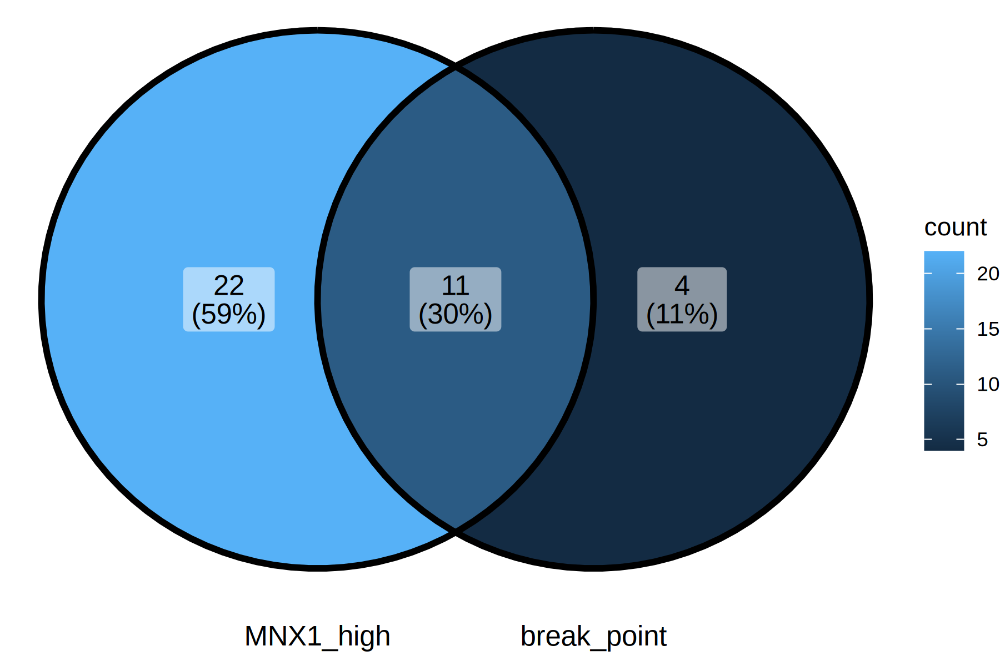

In [73]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)
sname_sel_gt5 = names(logcpm_2c['MNX1',][logcpm_2c['MNX1',] > 5])
sname_sel_fus = tmp$sample_name
ggVennDiagram(list(MNX1_high = sname_sel_gt5, break_point = sname_sel_fus)) + coord_flip()


In [278]:
logcpm_2c['MNX1', 'TARGET-20-PAWMUZ']
logcpm_2c['MNX1', 'SJ074195']
logcpm_2c['MNX1', 'TARGET-21-PARZIA']


[1] 1.493637

[1] -3.943644

[1] -2.491841

In [327]:
breakpoint_low_expression

[1] "TARGET-20-PAWMUZ" "SJ074195"         "TARGET-21-PARZIA"

In [328]:
plotdat[sample_name %in% breakpoint_low_expression, ]

sample_name,MNX1,patient_name,arriba,xx
<chr>,<dbl>,<chr>,<fct>,<int>
SJ074195,-3.943644,SJ074195,Other,753
TARGET-21-PARZIA,-2.491841,TARGET-21-PARZIA,Other,2232
TARGET-20-PAWMUZ,1.493637,TARGET-20-PAWMUZ,Yes,2697


Warning message:
"Using `bins = 30` by default. Pick better value with the argument `bins`."


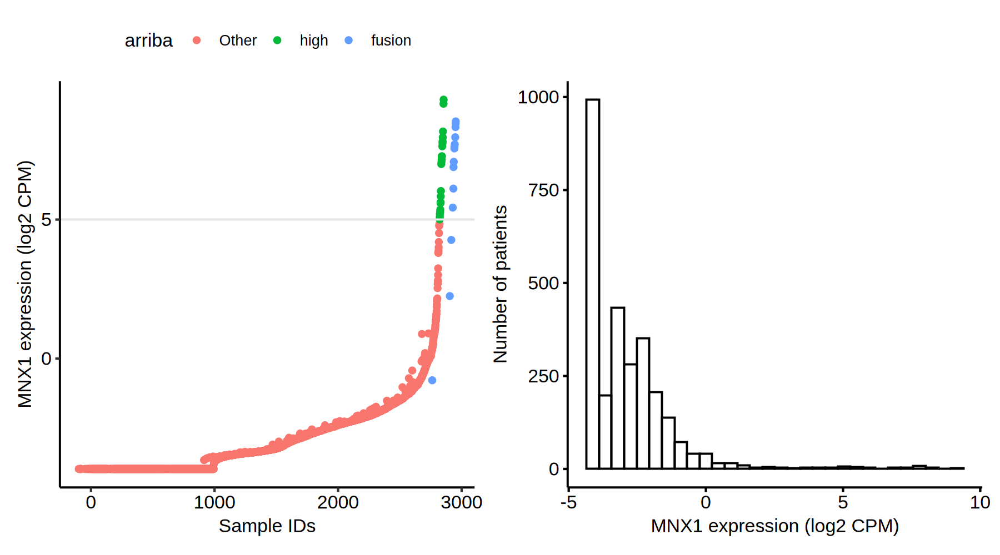

In [131]:
dsn_2c_2$mnx1 = logcpm_2c['MNX1', ][ dsn_2c_2$rn]
dsn_2c_2$cxcl9 = logcpm_2c['CXCL9', ][ dsn_2c_2$rn]
plotdat = dsn_2c_2[order(mnx1), ]
plotdat = plotdat[order(mnx1), ]
plotdat[, arriba := 'Other' ]
plotdat[rn %in% sname_sel_gt5, arriba := 'high' ]
plotdat[rn %in% sname_sel_fus, arriba := 'fusion' ]
plotdat[, arriba := factor(arriba, levels = c('Other', 'high', 'fusion')) ]
plotdat$xx = 1:nrow(plotdat)
plotdat[arriba == 'fusion', xx := xx + 100 ]  
plotdat[subtype == 'RUNX1-RUNX1T1', xx := xx - 100 ]  
plotdat[subtype == 'KMT2Ar', xx := xx - 50 ]  
#plotdat[sample_name %in% breakpoint_low_expression, xx := xx - 200 ]
options(repr.plot.width = 9, repr.plot.height = 5, repr.plot.res = 200)
ggplot(plotdat, aes(x = xx, y = mnx1, color = arriba)) + geom_point() + theme_pubr() + xlab('Sample IDs') + ylab('MNX1 expression (log2 CPM)') +
geom_hline(yintercept = 5, color = 'grey90') |
gghistogram(plotdat$mnx1) + xlab('MNX1 expression (log2 CPM)') + ylab('Number of patients')



In [147]:
colnames(dsn_2c_2)

[1] "rn"                                                      "batch"                                                   "subtype"                                                
 [4] ".id"                                                     "TARGET USI"                                              "Gender"                                                 
 [7] "Race"                                                    "Ethnicity"                                               "Age at Diagnosis in Days"                               
[10] "First Event"                                             "Event Free Survival Time in Days"                        "Vital Status"                                           
[13] "Overall Survival Time in Days"                           "Year of Diagnosis"                                       "Year of Last Follow Up"                                 
[16] "Protocol"                                                "WBC at Diagnosis"                                        "Bone marrow leukemic blast percentage (%)"              
[19] "Peripheral blasts (%)"                                   "CNS disease"                                             "Chloroma"                                               
[22] "FAB Category"                                            "t(6;9)"                                                  "t(8;21)"                                                
[25] "t(3;5)(q25;q34)"                                         "t(6;11)(q27;q23)"                                        "t(9;11)(p22;q23)"                                       
[28] "t(10;11)(p11.2;q23)"                                     "t(11:19)(q23:p13.1)"                                     "inv(16)"                                                
[31] "del5q"                                                   "del7q"                                                   "del9q"                                                  
[34] "monosomy 5"                                              "monosomy 7"                                              "trisomy 8"                                              
[37] "trisomy 21"                                              "MLL"                                                     "Minus Y"                                                
[40] "Minus X"                                                 "Cytogenetic Code Other"                                  "Cytogenetic Complexity"                                 
[43] "Primary Cytogenetic Code"                                "ISCN"                                                    "FLT3/ITD positive?"                                     
[46] "FLT3/ITD allelic ratio"                                  "FLT3 PM"                                                 "NPM mutation"                                           
[49] "CEBPA mutation"                                          "WT1 mutation"                                            "c-Kit Mutation Exon 8"                                  
[52] "c-Kit Mutation Exon 17"                                  "MRD at end of course 1"                                  "MRD % at end of course 1"                               
[55] "MRD at end of course 2"                                  "MRD % at end of course 2"                                "CR status at end of course 1"                           
[58] "CR status at end of course 2"                            "Risk group"                                              "SCT in 1st CR"                                          
[61] "Bone Marrow Site of Relapse/Induction Failure"           "CNS Site of Relapse/Induction Failure"                   "Chloroma Site of Relapse/Induction Failure"             
[64] "Cytogenetic Site of Relapse/Induction Failure"           "Other Site of Relapse/Induction Failure"                 "Gene Fusion"                                            
[67] "Gemtuzumab ozogamicin treatment"                         

[1] 2184   73

In [149]:
table(dsn_2c_2$`Gene Fusion`)


                      CBFA2T3-GLIS2        CBFB-MYH11        DEK-NUP214        ETV6-INO8D       FNBP1-KMT2A           FUS-ERG           FUS-FEV          FUS-FLI1      KAT6A-CREBBP 
             1069                10                54                 4                 1                 1                 3                 2                 1                 2 
      KAT6A-EP300        KMT2A-ABI1        KMT2A-AFF1    KMT2A-ARHGAP26     KMT2A-CEP170B         KMT2A-ELL        KMT2A-FLNA       KMT2A-MLLT1      KMT2A-MLLT10       KMT2A-MLLT3 
                2                 1                 1                 1                 1                 9                 1                 3                16                30 
      KMT2A-MLLT4       KMT2A-SEPT6        KMT2A-TET1     MLLT10-PICALM         MNX1-ETV6         NPM1-MLF1       NUP98-HMGB3       NUP98-HOXA9      NUP98-HOXD13       NUP98-KDM5A 
               12                 2                 1                 4                 3     

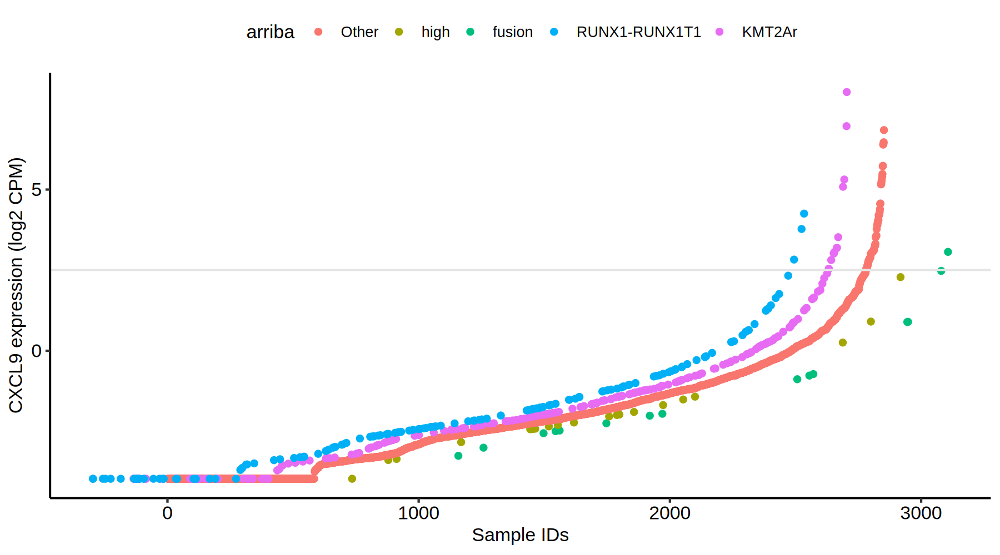

In [156]:
dsn_2c_2$mnx1 = logcpm_2c['MNX1', ][ dsn_2c_2$rn]
dsn_2c_2$cxcl9 = logcpm_2c['CXCL9', ][ dsn_2c_2$rn]
plotdat = dsn_2c_2[order(mnx1), ]
plotdat[is.na(subtype), subtype := `Gene Fusion`]
plotdat = plotdat[order(cxcl9), ]
plotdat[, arriba := 'Other' ]
plotdat[rn %in% sname_sel_gt5, arriba := 'high' ]
plotdat[rn %in% sname_sel_fus, arriba := 'fusion' ]
plotdat[, arriba := factor(arriba, levels = c('Other', 'high', 'fusion')) ]
plotdat$xx = 1:nrow(plotdat)
plotdat[arriba == 'fusion', xx := xx + 300 ]  
plotdat[arriba == 'high', xx := xx + 150 ]  
plotdat[subtype == 'RUNX1-RUNX1T1', xx := xx - 300 ]  
plotdat[subtype == 'RUNX1-RUNX1T1', arriba := 'RUNX1-RUNX1T1' ]  
plotdat[grep('KMT2A', subtype), arriba := 'KMT2Ar' ]  
plotdat[arriba == 'KMT2Ar', xx := xx - 150 ]  
#plotdat[sample_name %in% breakpoint_low_expression, xx := xx - 200 ]
options(repr.plot.width = 9, repr.plot.height = 5, repr.plot.res = 200)
ggplot(plotdat, aes(x = xx, y = cxcl9, color = arriba)) + geom_point() + theme_pubr() + xlab('Sample IDs') + ylab('CXCL9 expression (log2 CPM)') +
geom_hline(yintercept = 2.5, color = 'grey90') 


In [152]:
plotdat[cxcl9 > 5, subtype]
table(plotdat[cxcl9 > 2.5, subtype])

[1] "KMT2Ar"       NA             NA             ""             NA             "KMT2A-MLLT3"  NA             NA             NA             ""             NA             ""            
[13] NA             NA             "KMT2A-MLLT10" "KMT2A-MLLT3"


                      CEBPA  KMT2A-MLLT10   KMT2A-MLLT3        KMT2Ar     MNX1-ETV6         Other RUNX1-RUNX1T1 
           27             1             1             5             7             1             2             3 

In [104]:
ext = 500000 
tmp1 = fusion_dt[(right_chr == 'chr7'  & right_pos > 157006479 - ext & right_pos < 157006479 + ext) & (left_chr == 'chr7'  & left_pos  > 157006479 - ext & left_pos   < 157006479  + ext), ]

#datatable(tmp[tag %in% tmp[duplicated(tag), tag], .(.id, FusionName, LeftGene, LeftBreakpoint, RightGene, RightBreakpoint, right_chr, right_pos, left_chr, left_pos, tag)][order(.id), ])
cnames = c('sample_name', 'gene1', 'gene2', 'left_chr', 'left_pos', 'right_chr', 'right_pos', 'sample_name', 'breakpoint1', 'breakpoint2')
datatable(tmp1[, cnames, with = F])


HTML widgets cannot be represented in plain text (need html)

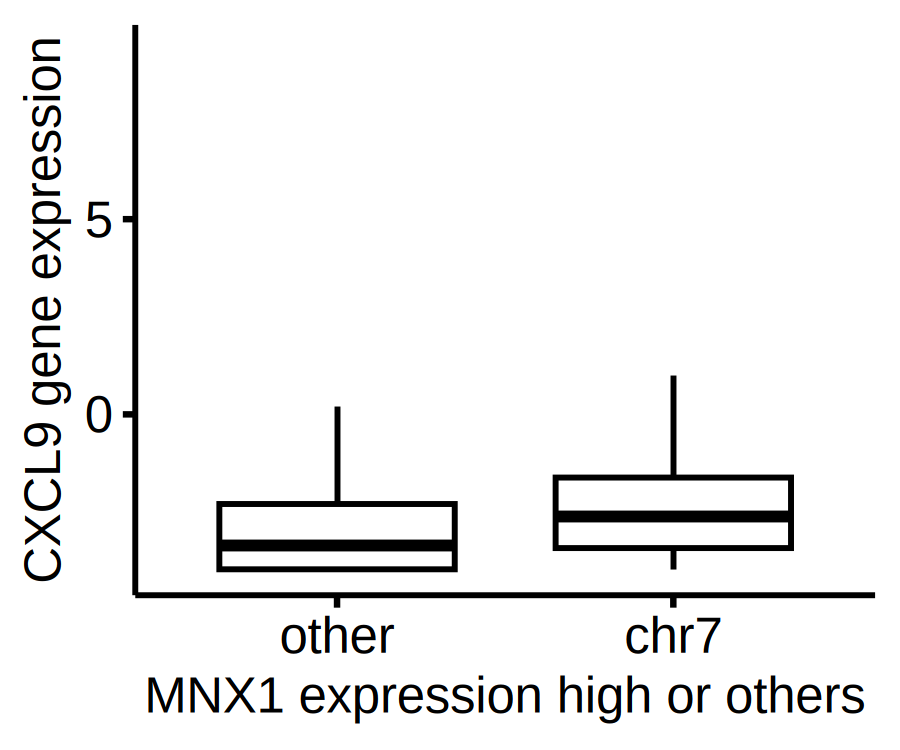

In [105]:
sname_sel_chr7 = unique(tmp1$sample_name)
plotdat = as.data.table(dsn_2c_2[order(mnx1), ], keep.rownames = T)
plotdat$group2 = 'other'
plotdat$group2[plotdat$rn %in% sname_sel_chr7] = 'chr7'
plotdat$mnx1 = logcpm_2c['MNX1', ][ plotdat$rn]
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
ggboxplot(dsn_2c_2, x = 'group2', y = 'mnx1', outlier.shape = NA) + xlab('MNX1 expression high or others') + ylab('CXCL9 gene expression')


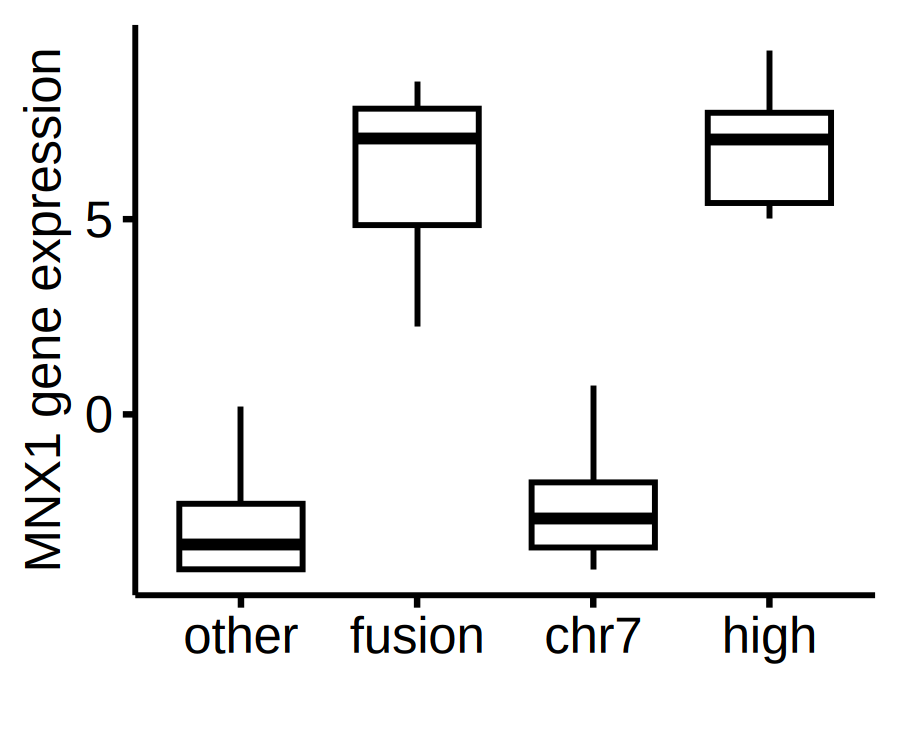

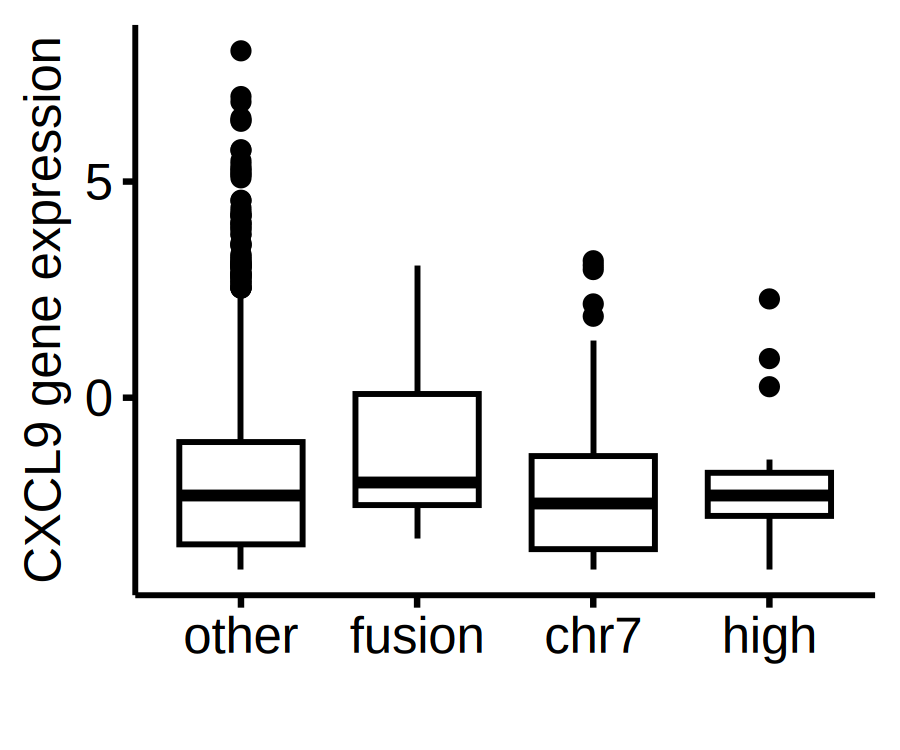

In [117]:
sname_sel_chr7 = unique(tmp1$sample_name)
dsn_2c_2$mnx1 = logcpm_2c['MNX1', ][ dsn_2c_2$rn]
dsn_2c_2$cxcl9 = logcpm_2c['CXCL9', ][ dsn_2c_2$rn]
plotdat = dsn_2c_2[order(mnx1), ]
plotdat$group2 = 'other'
plotdat$group2[plotdat$rn %in% sname_sel_chr7] = 'chr7'
plotdat$group2[plotdat$rn %in% sname_sel_gt5] = 'high'
plotdat$group2[plotdat$rn %in% sname_sel_fus] = 'fusion'
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
ggboxplot(plotdat, x = 'group2', y = 'mnx1', outlier.shape = NA) + xlab('') + ylab('MNX1 gene expression')
ggboxplot(plotdat, x = 'group2', y = 'cxcl9') + xlab('') + ylab('CXCL9 gene expression')


In [121]:
table(dsn_2c_2[cxcl9 > 0, subtype])


       BCL11B    CBFB-MYH11         CEBPA    DEK-NUP214     ETSfamily         GATA1         GLISr        KAT6Ar        KMT2Ar          NPM1        NUP98r         Other    RBM15-MKL1 
            1             1             5             1             1             2             2             3            27             3             5            13             1 
RUNX1-RUNX1T1 
           11 

In [109]:
table(plotdat$group2)


  chr7 fusion   high  other 
   248     15     22   2569 

In [5]:
248 + 15 + 22 + 2569

[1] 2854

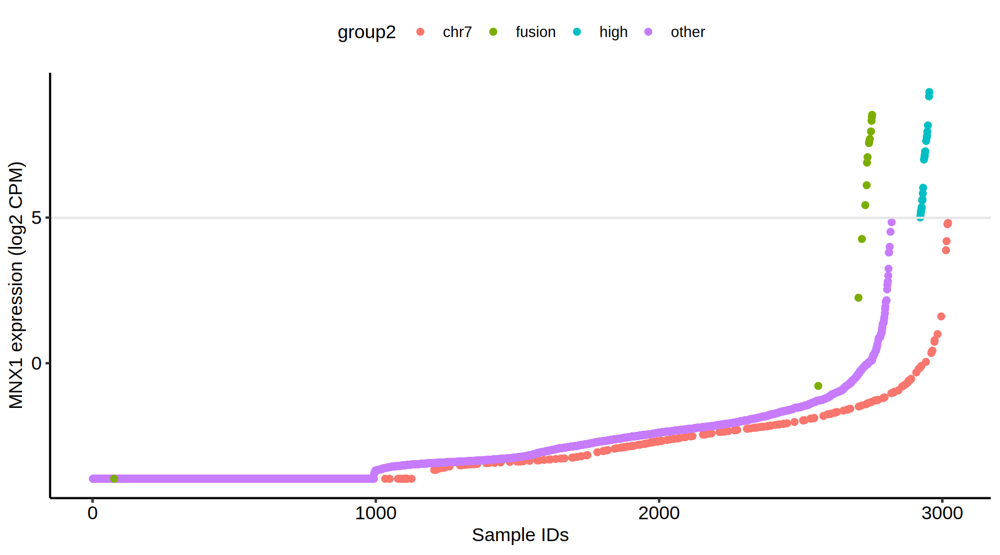

In [107]:
sname_sel_chr7 = unique(tmp1$sample_name)
dsn_2c_2$mnx1 = logcpm_2c['MNX1', ][ plotdat$rn]
plotdat = dsn_2c_2[order(mnx1), ]
plotdat$xx = 1:nrow(plotdat)
plotdat$group2 = 'other'
plotdat$group2[plotdat$rn %in% sname_sel_chr7] = 'chr7'
plotdat$group2[plotdat$rn %in% sname_sel_gt5] = 'high'
plotdat$group2[plotdat$rn %in% sname_sel_fus] = 'fusion'
plotdat[group2 == 'fusion', xx := xx - 100]
plotdat[group2 == 'high', xx := xx + 100]
plotdat[group2 == 'chr7', xx := xx + 200]

options(repr.plot.width = 9, repr.plot.height = 5, repr.plot.res = 200)
ggplot(plotdat, aes(x = xx, y = mnx1, color = group2)) + geom_point() + theme_pubr() + xlab('Sample IDs') + ylab('MNX1 expression (log2 CPM)') +
geom_hline(yintercept = 5, color = 'grey90') 


Warning message:
"The melt generic in data.table has been passed a matrix and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(logcpm_2c[c("MNX1", "ETV6", "NOM1"), ]). In the next version, this warning will become an error."


Var1,Var2,value,patient_name,arriba
<fct>,<fct>,<dbl>,<chr>,<chr>
MNX1,TARGET-20-PAVDAJ,-3.029916,TARGET-20-PAVDAJ,Other
ETV6,TARGET-20-PAVDAJ,8.776571,TARGET-20-PAVDAJ,Other
NOM1,TARGET-20-PAVDAJ,4.735157,TARGET-20-PAVDAJ,Other
MNX1,TARGET-20-PAXBXU,-3.343049,TARGET-20-PAXBXU,Other
ETV6,TARGET-20-PAXBXU,8.581516,TARGET-20-PAXBXU,Other
NOM1,TARGET-20-PAXBXU,5.350607,TARGET-20-PAXBXU,Other


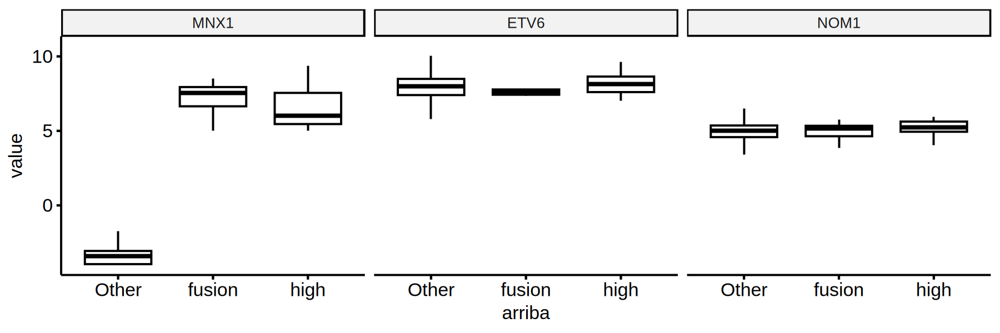

In [299]:
plotdat = as.data.table(melt(logcpm_2c[c('MNX1', 'ETV6', 'NOM1'), ]))
plotdat[, patient_name := substr(Var2, 1, 16) ]
plotdat[, arriba := 'Other' ]
plotdat[patient_name %in% sname_mnx_high, arriba := 'high' ]
plotdat[patient_name %in% sname_mnx_high_fusion, arriba := 'fusion' ]
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
ggboxplot(plotdat, x = 'arriba', y = 'value', outlier.shape = NA) + facet_wrap(~Var1)
#ggboxplot(plotdat, x = 'arriba', y = 'value', outlier.shape = NA, add = 'dotplot') + facet_wrap(~Var1)
head(plotdat) 


In [288]:
head(plotdat[Var1 == 'NOM1', ])

Var1,Var2,value,patient_name,arriba,tag,logcpm
<fct>,<fct>,<dbl>,<chr>,<chr>,<chr>,<dbl>


In [291]:
plotdat[, tag := paste0(patient_name, '_', Var1) ]
plotdat[, logcpm := mean(.SD$value), by = 'tag' ]
plotdat = plotdat[!duplicated(tag), ]
dat = plotdat[Var1 == 'MNX1', ]
summary(aov(logcpm ~ arriba, dat))

              Df Sum Sq Mean Sq F value Pr(>F)    
arriba         2   1835   917.7   496.7 <2e-16 ***
Residuals   2181   4030     1.8                   
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

# add clinical data with expression data

In [43]:
clin_dt_unq[, patient_name := `TARGET USI` ]

In [44]:
dsn_2c_2 = merge(dsn_2c, clin_dt_unq, by.x = 'rn', by.y = 'patient_name', all.x = T)

In [45]:
head(dsn_2c_2)

rn,batch,subtype,.id,TARGET USI,Gender,Race,Ethnicity,Age at Diagnosis in Days,First Event,⋯,Bone Marrow Site of Relapse/Induction Failure,CNS Site of Relapse/Induction Failure,Chloroma Site of Relapse/Induction Failure,Cytogenetic Site of Relapse/Induction Failure,Other Site of Relapse/Induction Failure,Gene Fusion,Gemtuzumab ozogamicin treatment,Refractory Timepoint sent for Induction Failure Project,Comment,Blast count used for RNA seq
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<chr>
SJ000089,jude,CBFB-MYH11,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
SJ001018,jude,RUNX1-RUNX1T1,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
SJ001408,jude,KMT2Ar,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
SJ001409,jude,NUP98r,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
SJ001414,jude,NUP98r,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
SJ001417,jude,NPM1,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [344]:
table(dsn_2c_2$group)


other  mnx1 
 2816    38 

In [347]:
dsn_2c_2[, fusion := 'no detected']
dsn_2c_2[rn %in% sname_mnx_high_fusion, fusion := 'detected']
table(dsn_2c_2$fusion, dsn_2c_2$group)


             
              other mnx1
  detected        1   12
  no detected  2815   26

In [343]:
fwrite(dsn_2c_2, file = 'dsn_target_jude_with_clinical.tsv', sep = '\t')


In [379]:
colnames(dsn_2c_2)

[1] "rn"                                                      "batch"                                                   "subtype"                                                
 [4] "group"                                                   ".id"                                                     "TARGET USI"                                             
 [7] "Gender"                                                  "Race"                                                    "Ethnicity"                                              
[10] "Age at Diagnosis in Days"                                "First Event"                                             "Event Free Survival Time in Days"                       
[13] "Vital Status"                                            "Overall Survival Time in Days"                           "Year of Diagnosis"                                      
[16] "Year of Last Follow Up"                                  "Protocol"                                                "WBC at Diagnosis"                                       
[19] "Bone marrow leukemic blast percentage (%)"               "Peripheral blasts (%)"                                   "CNS disease"                                            
[22] "Chloroma"                                                "FAB Category"                                            "t(6;9)"                                                 
[25] "t(8;21)"                                                 "t(3;5)(q25;q34)"                                         "t(6;11)(q27;q23)"                                       
[28] "t(9;11)(p22;q23)"                                        "t(10;11)(p11.2;q23)"                                     "t(11:19)(q23:p13.1)"                                    
[31] "inv(16)"                                                 "del5q"                                                   "del7q"                                                  
[34] "del9q"                                                   "monosomy 5"                                              "monosomy 7"                                             
[37] "trisomy 8"                                               "trisomy 21"                                              "MLL"                                                    
[40] "Minus Y"                                                 "Minus X"                                                 "Cytogenetic Code Other"                                 
[43] "Cytogenetic Complexity"                                  "Primary Cytogenetic Code"                                "ISCN"                                                   
[46] "FLT3/ITD positive?"                                      "FLT3/ITD allelic ratio"                                  "FLT3 PM"                                                
[49] "NPM mutation"                                            "CEBPA mutation"                                          "WT1 mutation"                                           
[52] "c-Kit Mutation Exon 8"                                   "c-Kit Mutation Exon 17"                                  "MRD at end of course 1"                                 
[55] "MRD % at end of course 1"                                "MRD at end of course 2"                                  "MRD % at end of course 2"                               
[58] "CR status at end of course 1"                            "CR status at end of course 2"                            "Risk group"                                             
[61] "SCT in 1st CR"                                           "Bone Marrow Site of Relapse/Induction Failure"           "CNS Site of Relapse/Induction Failure"                  
[64] "Chloroma Site of Relapse/Induction Failure"              "Cytogenetic Site of Relapse/Induction Failure"           "Other Site of Relapse/Induction Failure"                
[67] "Gene Fusion"                                             

# breakpoint

In [301]:
plotdat = fusion_dt[sample_name %in% sname_mnx_high_fusion, ] 
head(plotdat)

.id,gene1,gene2,strand1,strand2,breakpoint1,breakpoint2,site1,site2,type,⋯,fusion_transcript,reading_frame,peptide_sequence,read_identifiers,FusionName,left_chr,left_pos,right_chr,right_pos,sample_name
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SJ044827,"NOM1(19768),MNX1(1107)",MNX1,./-,-/-,7:156992944,7:156994181,intergenic,CDS/splice-site,duplication,⋯,CCTGACTCGGGGCCTGCAGAGGGGAACCCTGGAGTGAAAGACGGCAAAGTGAAAATCCCGCTCTCTCCTGGTGCCTTGCCtGTGATGCCTCAGAGTTCTGAGGAAGACCAGACCCATCCAGAACCTTCTGGGGGAACAGCCCTCTGCCCGTCCGT|GTAAAGAAGGCACAGACACCCTCACCTCCTGCACTCTAGGCAGCTTCCAGAATTGACTAAAAATATCCCGAGAGCTTTCCAGGAAGCCGCAGGGAGCCCTCGACCTGTTTGAATCTCTG,.,.,"K00202:114:HFLCYBBXX:8:1101:11982:19935,K00202:114:HFLCYBBXX:8:1104:16305:21518,K00202:114:HFLCYBBXX:8:1106:1783:7328,K00202:114:HFLCYBBXX:8:1107:24322:25562,K00202:114:HFLCYBBXX:8:1107:24393:25791,K00202:114:HFLCYBBXX:8:1110:1407:29360,K00202:114:HFLCYBBXX:8:1112:16386:11495,K00202:114:HFLCYBBXX:8:1112:6999:27971,K00202:114:HFLCYBBXX:8:1115:27570:10792,K00202:114:HFLCYBBXX:8:1115:27590:11390,K00202:114:HFLCYBBXX:8:1116:18193:4004,K00202:114:HFLCYBBXX:8:1118:13403:1683,K00202:114:HFLCYBBXX:8:1119:16792:7416,K00202:114:HFLCYBBXX:8:1119:16802:7468,K00202:114:HFLCYBBXX:8:1122:1479:4971,K00202:114:HFLCYBBXX:8:1122:20730:40051,K00202:114:HFLCYBBXX:8:1203:14915:12708,K00202:114:HFLCYBBXX:8:1204:5832:25034,K00202:114:HFLCYBBXX:8:1207:2148:9367,K00202:114:HFLCYBBXX:8:1209:18061:27479,K00202:114:HFLCYBBXX:8:1209:26474:44377,K00202:114:HFLCYBBXX:8:1211:10368:9297,K00202:114:HFLCYBBXX:8:1211:8146:43849,K00202:114:HFLCYBBXX:8:1214:7841:35479,K00202:114:HFLCYBBXX:8:2101:16812:34495,K00202:114:HFLCYBBXX:8:2102:20425:27145,K00202:114:HFLCYBBXX:8:2102:21034:26898,K00202:114:HFLCYBBXX:8:2102:25855:37994,K00202:114:HFLCYBBXX:8:2103:22759:1930,K00202:114:HFLCYBBXX:8:2112:5396:10317,K00202:114:HFLCYBBXX:8:2113:14204:8101,K00202:114:HFLCYBBXX:8:2115:7699:22924,K00202:114:HFLCYBBXX:8:2119:17634:38838,K00202:114:HFLCYBBXX:8:2126:28828:48702,K00202:114:HFLCYBBXX:8:2127:22871:42073,K00202:114:HFLCYBBXX:8:2201:13159:26441,K00202:114:HFLCYBBXX:8:2202:16183:7521,K00202:114:HFLCYBBXX:8:2221:27103:22151,K00202:114:HFLCYBBXX:8:2228:14468:31417,K00202:114:HFLCYBBXX:8:1102:30097:21782,K00202:114:HFLCYBBXX:8:1108:23774:39805,K00202:114:HFLCYBBXX:8:1112:14489:27865,K00202:114:HFLCYBBXX:8:1112:14661:27989,K00202:114:HFLCYBBXX:8:1117:26058:7187,K00202:114:HFLCYBBXX:8:1121:6167:1701,K00202:114:HFLCYBBXX:8:1201:32431:38170,K00202:114:HFLCYBBXX:8:1203:22272:43357,K00202:114:HFLCYBBXX:8:1204:22404:7257,K00202:114:HFLCYBBXX:8:1207:27651:7416,K00202:114:HFLCYBBXX:8:1212:21805:42407,K00202:114:HFLCYBBXX:8:1212:30147:25808,K00202:114:HFLCYBBXX:8:1214:25093:16243,K00202:114:HFLCYBBXX:8:1224:21065:12814,K00202:114:HFLCYBBXX:8:1228:21734:10211,K00202:114:HFLCYBBXX:8:2105:24556:29905,K00202:114:HFLCYBBXX:8:2107:15138:15803,K00202:114:HFLCYBBXX:8:2108:14590:35637,K00202:114:HFLCYBBXX:8:2113:30969:37537,K00202:114:HFLCYBBXX:8:2126:7628:13095,K00202:114:HFLCYBBXX:8:2210:4279:33387,K00202:114:HFLCYBBXX:8:2211:14184:22204,K00202:114:HFLCYBBXX:8:2212:13717:46293,K00202:114:HFLCYBBXX:8:2214:2747:35620,K00202:114:HFLCYBBXX:8:2221:19451:1754,K00202:114:HFLCYBBXX:8:2221:20425:2352,K00202:114:HFLCYBBXX:8:1111:2047:38451,K00202:114:HFLCYBBXX:8:1115:7740:1508,K00202:114:HFLCYBBXX:8:1115:7740:1543,K00202:114:HFLCYBBXX:8:1117:28554:36552,K00202:114:HFLCYBBXX:8:1204:19471:21307,K00202:114:HFLCYBBXX:8:1215:29325:25509,K00202:114:HFLCYBBXX:8:1216:21379:32384,K00202:114:HFLCYBBXX:8:1224:4716:19056,K00202:114:HFLCYBBXX:8:1225:18710:23540,K00202:114:HFLCYBBXX:8:1225:18730:23540,K00202:114:HFLCYBBXX:8:1226:17817:16401,K00202:114:HFLCYBBXX:8:2107:6411:37255,K00202:114:HFLCYBBXX:8:2113:8197:42460,K00202:114:HFLCYBBXX:8:2115:4026:25175,K00202:114:HFLCYBBXX:8:2119:16336:23821,K00202:114:HFLCYBBXX:8:2119:17168:45414,K00202:114:HFLCYBBXX:8:2213:13971:1332,K00202:114:HFLCYBBXX:8:2215:22039:14045,K002

In [ ]:
library(RCircos)
data(RCircos.Human.Ideogram)

# Initialize the core components
RCircos.Set.Core.Components(RCircos.Human.Ideogram, tracks.inside=10, tracks.outside=0)

# Prepare the fusion gene breakpoint data
fusion_data <- data.frame(
    Chromosome = c("chr1", "chr2"),
    Start = c(150000000, 20000000),
    End = c(150500000, 20500000),
    Label = c("Fusion1", "Fusion2")
)

# Plot the chromosome ideogram
RCircos.Chromosome.Ideogram.Plot()

# Plot the fusion gene breakpoints as links
RCircos.Link.Plot(link.data=fusion_data, track.num=5, by.chromosome=TRUE)


In [ ]:
RCircos.Set.Core.Components(RCircos.Human.Ideogram, tracks.inside=10, tracks.outside=0)


In [ ]:
RCircos.Chromosome.Ideogram.Plot()


In [ ]:
RCircos.Link.Plot(link.data=fusion_data, track.num=5, by.chromosome=TRUE)


# 2615 cases has clinical information, duplicated samples from one patients were retained

In [518]:
dsn_sel = dsn[!is.na(Gender) & patient_name %in% clin_dt_unq$`TARGET USI`, ]
dim(dsn_sel)

[1] 2615   68

In [569]:
share_dir

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/share_data/"

In [520]:
tgt_mtx_sel = tgt_dt_mtx[, dsn_sel$sample_name]
dim(tgt_mtx_sel)

[1] 19938  2615

In [521]:
logcpm_target_2615cases = logcpm_fun(tgt_mtx_sel) 

In [526]:
fwrite(logcpm_target_2615cases, file = paste0(share_dir, 'TARGET_logcpm_2615cases.xls'), sep = '\t')
fwrite(dsn_sel, file = paste0(share_dir, 'TARGET_clin_information_2615cases_filled.xls'), sep = '\t')

x being coerced from class: matrix to data.table



[1] 48

plotdat = pca_fun(logcpm_target_2615cases)
options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 200)
ggscatter(plotdat$plotdat, x = 'PC1', y = 'PC2') + xlab(plotdat$lblx) + ylab(plotdat$lbly)


# DNA mutation

In [3]:
query <- GDCquery(
    project = "TARGET-AML", 
    data.category = "Simple Nucleotide Variation", 
    access = "open",
    data.type = "Masked Somatic Mutation", 
    workflow.type = "Aliquot Ensemble Somatic Variant Merging and Masking"
)
GDCdownload(query)
maf <- GDCprepare(query)
Methylation Beta Value

--------------------------------------

o GDCquery: Searching in GDC database

--------------------------------------

Genome of reference: hg38

--------------------------------------------

oo Accessing GDC. This might take a while...

--------------------------------------------

ooo Project: TARGET-AML

--------------------

oo Filtering results

--------------------

ooo By access

ooo By data.type

ooo By workflow.type

----------------

oo Checking data

----------------

ooo Checking if there are duplicated cases


ooo Checking if there are results for the query

-------------------

o Preparing output

-------------------


Of the 806 files for download 806 already exist.

All samples have been already downloaded



In [731]:
data_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/TARGET_AML_Clinical_GDC/'
setwd(data_dir)
target_gdc_clin = fread('clinical.project-target-aml.2024-06-11/clinical.tsv')
colnames(target_gdc_clin)
dim(target_gdc_clin)
head(target_gdc_clin)


[1] "case_id"                                  "case_submitter_id"                        "project_id"                               "age_at_index"                            
  [5] "age_is_obfuscated"                        "cause_of_death"                           "cause_of_death_source"                    "country_of_birth"                        
  [9] "country_of_residence_at_enrollment"       "days_to_birth"                            "days_to_death"                            "education_level"                         
 [13] "ethnicity"                                "gender"                                   "marital_status"                           "occupation_duration_years"               
 [17] "premature_at_birth"                       "race"                                     "vital_status"                             "weeks_gestation_at_birth"                
 [21] "year_of_birth"                            "year_of_death"                            "adrenal_hormone"                          "age_at_diagnosis"                        
 [25] "ajcc_clinical_m"                          "ajcc_clinical_n"                          "ajcc_clinical_stage"                      "ajcc_clinical_t"                         
 [29] "ajcc_pathologic_m"                        "ajcc_pathologic_n"                        "ajcc_pathologic_stage"                    "ajcc_pathologic_t"                       
 [33] "ajcc_staging_system_edition"              "ann_arbor_b_symptoms"                     "ann_arbor_b_symptoms_described"           "ann_arbor_clinical_stage"                
 [37] "ann_arbor_extranodal_involvement"         "ann_arbor_pathologic_stage"               "best_overall_response"                    "burkitt_lymphoma_clinical_variant"       
 [41] "cancer_detection_method"                  "child_pugh_classification"                "clark_level"                              "classification_of_tumor"                 
 [45] "cog_liver_stage"                          "cog_neuroblastoma_risk_group"             "cog_renal_stage"                          "cog_rhabdomyosarcoma_risk_group"         
 [49] "contiguous_organ_invaded"                 "days_to_best_overall_response"            "days_to_diagnosis"                        "days_to_last_follow_up"                  
 [53] "days_to_last_known_disease_status"        "days_to_recurrence"                       "diagnosis_is_primary_disease"             "double_expressor_lymphoma"               
 [57] "double_hit_lymphoma"                      "eln_risk_classification"                  "enneking_msts_grade"                      "enneking_msts_metastasis"                
 [61] "enneking_msts_stage"                      "enneking_msts_tumor_site"                 "ensat_clinical_m"                         "ensat_pathologic_n"                      
 [65] "ensat_pathologic_stage"                   "ensat_pathologic_t"                       "esophageal_columnar_dysplasia_degree"     "esophageal_columnar_metaplasia_present"  
 [69] "fab_morphology_code"                      "figo_stage"                               "figo_staging_edition_year"                "first_symptom_longest_duration"          
 [73] "first_symptom_prior_to_diagnosis"         "gastric_esophageal_junction_involvement"  "gleason_grade_group"                      "gleason_grade_tertiary"                  
 [77] "gleason_patterns_percent"                 "gleason_score"                            "goblet_cells_columnar_mucosa_present"     "icd_10_code"                             
 [81] "igcccg_stage"                             "inpc_grade"                               "inpc_histologic_group"                    "inrg_stage"                              
 [85] "inss_stage"                               "international_prognostic_index"           "irs_group"                                "irs_stage"                               
 [89] "ishak_fibrosis_score"                     "iss_stage"                          

[1] 9818  210

case_id,case_submitter_id,project_id,age_at_index,age_is_obfuscated,cause_of_death,cause_of_death_source,country_of_birth,country_of_residence_at_enrollment,days_to_birth,⋯,treatment_dose_units,treatment_duration,treatment_effect,treatment_effect_indicator,treatment_frequency,treatment_intent_type,treatment_or_therapy,treatment_outcome,treatment_outcome_duration,treatment_type
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
002e6505-2e1f-4606-ba1e-0201bf9e53a6,TARGET-20-PARPSX,TARGET-AML,'--,'--,'--,'--,'--,'--,'--,⋯,'--,'--,'--,'--,'--,'--,'--,'--,'--,'--
00b9bfd0-95c0-59c6-afa4-44d13563a7e6,TARGET-20-PANTIV,TARGET-AML,7,false,'--,'--,'--,'--,-2833,⋯,'--,'--,'--,'--,'--,'--,yes,'--,'--,'--
00b9bfd0-95c0-59c6-afa4-44d13563a7e6,TARGET-20-PANTIV,TARGET-AML,7,false,'--,'--,'--,'--,-2833,⋯,'--,'--,'--,'--,'--,'--,no,'--,'--,"Stem Cell Transplantation, NOS"
00b9bfd0-95c0-59c6-afa4-44d13563a7e6,TARGET-20-PANTIV,TARGET-AML,7,false,'--,'--,'--,'--,-2833,⋯,'--,'--,'--,'--,'--,'--,yes,'--,'--,"Pharmaceutical Therapy, NOS"
00b9bfd0-95c0-59c6-afa4-44d13563a7e6,TARGET-20-PANTIV,TARGET-AML,7,false,'--,'--,'--,'--,-2833,⋯,'--,'--,'--,'--,'--,'--,yes,'--,'--,'--
00b9bfd0-95c0-59c6-afa4-44d13563a7e6,TARGET-20-PANTIV,TARGET-AML,7,false,'--,'--,'--,'--,-2833,⋯,'--,'--,'--,'--,'--,'--,yes,'--,'--,'--


In [732]:
table(target_gdc_clin$project_id)


TARGET-AML 
      9818 

# dna methylation

In [549]:
query <- GDCquery(
    experimental.strategy = 'Methylation Array', 
    project = "TARGET-AML",
    data.category = "DNA Methylation", 
    data.type = "Methylation Beta Value"
    #workflow.type = "Aliquot Ensemble Somatic Variant Merging and Masking"
)
#GDCdownload(query)

--------------------------------------

o GDCquery: Searching in GDC database

--------------------------------------

Genome of reference: hg38

--------------------------------------------

oo Accessing GDC. This might take a while...

--------------------------------------------

ooo Project: TARGET-AML

--------------------

oo Filtering results

--------------------

ooo By experimental.strategy

ooo By data.type

----------------

oo Checking data

----------------

ooo Checking if there are duplicated cases


ooo Checking if there are results for the query

-------------------

o Preparing output

-------------------



In [ ]:
getManifest(query)

# TARGET based on cbioportal

## load from GDC

In [1]:
getwd()

[1] "/research/rgs01/home/clusterHome/whu78/script/JinWang"

In [154]:
target_aml_clin = readRDS('data/target_aml_clin.rds')
colnames(target_aml_clin)

[1] "project"                                  "submitter_id"                             "disease_type"                             "primary_site"                            
  [5] "submitter_id"                             "irs_stage"                                "iss_stage"                                "ajcc_pathologic_stage"                   
  [9] "ann_arbor_clinical_stage"                 "created_datetime"                         "enneking_msts_stage"                      "treatments"                              
 [13] "inrg_stage"                               "enneking_msts_metastasis"                 "tissue_or_organ_of_origin"                "age_at_diagnosis"                        
 [17] "esophageal_columnar_dysplasia_degree"     "cog_liver_stage"                          "child_pugh_classification"                "metastasis_at_diagnosis_site"            
 [21] "state"                                    "prior_treatment"                          "cog_rhabdomyosarcoma_risk_group"          "days_to_last_known_disease_status"       
 [25] "primary_gleason_grade"                    "inpc_grade"                               "ajcc_pathologic_t"                        "morphology"                              
 [29] "ajcc_pathologic_n"                        "ajcc_pathologic_m"                        "irs_group"                                "medulloblastoma_molecular_classification"
 [33] "wilms_tumor_histologic_subtype"           "residual_disease"                         "weiss_assessment_score"                   "classification_of_tumor"                 
 [37] "tumor_focality"                           "ann_arbor_b_symptoms"                     "icd_10_code"                              "cog_renal_stage"                         
 [41] "figo_stage"                               "synchronous_malignancy"                   "burkitt_lymphoma_clinical_variant"        "days_to_best_overall_response"           
 [45] "inss_stage"                               "supratentorial_localization"              "ishak_fibrosis_score"                     "tumor_confined_to_organ_of_origin"       
 [49] "gleason_grade_group"                      "days_to_diagnosis"                        "goblet_cells_columnar_mucosa_present"     "laterality"                              
 [53] "last_known_disease_status"                "days_to_last_follow_up"                   "primary_diagnosis"                        "ajcc_clinical_stage"                     
 [57] "cog_neuroblastoma_risk_group"             "updated_datetime"                         "metastasis_at_diagnosis"                  "enneking_msts_tumor_site"                
 [61] "prior_malignancy"                         "year_of_diagnosis"                        "secondary_gleason_grade"                  "best_overall_response"                   
 [65] "ann_arbor_pathologic_stage"               "ann_arbor_extranodal_involvement"         "method_of_diagnosis"                      "mitosis_karyorrhexis_index"              
 [69] "ajcc_staging_system_edition"              "days_to_recurrence"                       "esophageal_columnar_metaplasia_present"   "ajcc_clinical_m"                         
 [73] "ajcc_clinical_n"                          "ajcc_clinical_t"                          "inpc_histologic_group"                    "masaoka_stage"                           
 [77] "micropapillary_features"                  "diagnosis_id"                             "igcccg_stage"                             "tumor_regression_grade"                  
 [81] "site_of_resection_or_biopsy"              "first_symptom_prior_to_diagnosis"         "tumor_grade"                              "enneking_msts_grade"                     
 [85] "sites_of_involvement"                     "gastric_esophageal_junction_involvement"  "progression_or_recurrence"                "NA."                                     
 [89] "submitter_sample_ids"                     "cause_of_death"                     

In [155]:
datatable(head(target_aml_clin))

Warning message in instance$preRenderHook(instance):
"It seems your data is too big for client-side DataTables. You may consider server-side processing: https://rstudio.github.io/DT/server.html"


HTML widgets cannot be represented in plain text (need html)

## load clinical data from cbioportal

In [260]:
target_clin = read_xlsx('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/workspace/ImmuCellAI/TARGET/41375_2019_402_MOESM6_ESM.xlsx', 1)

In [261]:
dim(target_clin)
head(target_clin)

[1] 57445    56

Gene,TARGET-21-PAMXZY-09A-03R,TARGET-21-PAMYMA-09A-02R,TARGET-21-PAMYMA-41A-01R,TARGET-21-PANVPB-09A-02R,TARGET-21-PANZLR-09A-03R,TARGET-21-PANZLR-41A-02R,TARGET-21-PARBTV-09A-03R,TARGET-21-PARBTV-41A-02R,TARGET-21-PARHRS-09A-02R,⋯,TARGET-21-PATISD-09A-01R,TARGET-21-PATISD-41A-01R,TARGET-21-PATJMY-09A-01R,TARGET-21-PATJMY-41A-01R,TARGET-21-PATKBK-03A-01R,TARGET-21-PATKBK-41A-02R,TARGET-21-PATKKJ-09A-01R,TARGET-21-PATKKJ-41A-01R,TARGET-21-PATKWH-09A-01R,TARGET-21-PATKWH-41A-02R
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000000003.10,14.25423,0.0000,103.4042,0.00000,0.0000,16.69985,0.0000,277.1082,0.0000,⋯,86.18001,116.0984,0.0000,122.112,2618.0162,244.5005,0.0000,48.52906,305.2827,245.7673
ENSG00000000005.5,0.00000,0.0000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,⋯,0.00000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000,0.00000,0.0000,0.0000
ENSG00000000419.8,4370.34669,3725.5479,4476.7257,2106.85118,2345.7198,3157.03051,2810.6834,3045.0411,3177.4287,⋯,4330.20376,5473.0310,2834.5240,3880.592,2706.2894,3596.8488,4143.9221,2545.07969,2658.8592,4634.0067
ENSG00000000457.8,788.25888,390.1385,447.3354,40.01617,915.0019,1137.86697,636.1861,574.9995,371.2359,⋯,909.67793,503.5138,888.1400,507.729,549.2553,280.3905,985.4673,1006.52869,1224.5420,415.0018
ENSG00000000460.12,648.56743,668.5472,982.3395,862.34839,354.0838,2072.29942,558.1899,1369.7962,543.6999,⋯,1146.33099,273.8408,889.7756,1100.294,1527.8049,390.3035,855.9697,823.19668,1632.1541,448.4175
ENSG00000000938.8,4061.02991,52179.6501,28435.0195,356.14388,2602.5504,2303.06097,5335.6938,9995.4183,3574.9727,⋯,3816.54352,733.1868,4020.3462,1341.947,9987.6942,9910.1203,3835.3322,2478.57691,4231.3212,1324.7719


In [262]:
# https://portal.gdc.cancer.gov/analysis_page?app=Projects

In [263]:
target_clin = fread('data/target_cbio/data_clinical_sample.txt', skip = 4)
setnames(target_clin, 1, 'PatientID')
target_clin_2 = readRDS('data/target_aml_clin.rds')
target_clin_2 = as.data.table(target_clin_2)
target_clin = merge(target_clin, target_clin_2[, .(submitter_id, vital_status, days_to_death)], by.x = 'PatientID', by.y = 'submitter_id', all.x = T)

# vital_status: Dead / Alive
# days_to_death: 
target_clin[, stat := factor(vital_status)]

dim(target_clin)
datatable(target_clin, options = list(pageLength = 3))


[1] 1025   40

HTML widgets cannot be represented in plain text (need html)

- MA9: t(9;11)(p22;q23) 
- MA6: t(6;11)(p27;q23) 
- AML1-ETO: t(8;21) (q21;q22) 


In [264]:
target_clin[, FLT3ITD := 'WT']
target_clin[FLT3_ITD_POSITIVE == 'Yes', FLT3ITD := 'FLT3ITD'] 

target_clin[,  MA6 := 'WT']
target_clin[T_6_11_Q27_Q23 == 'Yes',  MA6 := 'MA6']

target_clin[,  MA9 := 'WT']
target_clin[T_9_11_P22_Q23 == 'Yes',  MA9 := 'MA6']

target_clin[,  AML1ETO:= 'WT']
target_clin[T_8_21 == 'Yes',  AML1ETO := 'AML1ETO']


In [559]:
colnames(target_clin)

[1] "PatientID"                   "SAMPLE_ID"                   "T_6_9"                       "T_8_21"                      "T_3_5_Q25_Q34"               "T_6_11_Q27_Q23"             
 [7] "T_9_11_P22_Q23"              "T_10_11_P11_2_Q23"           "T_11_19_Q23_P13_1"           "INV_16"                      "DEL_5Q"                      "DEL_7Q"                     
[13] "DEL_9Q"                      "MONOSOMY_5"                  "MONOSOMY_7"                  "TRISOMY_8"                   "TRISOMY_21"                  "MLL"                        
[19] "MINUS_Y"                     "MINUS_X"                     "FLT3_ITD_POSITIVE"           "FLT3_ITD_ALLELIC_RATIO"      "FLT3_PM"                     "NPM_MUTATION"               
[25] "CEBPA_MUTATION"              "WT1_MUTATION"                "NUP98_NSD1"                  "CBFT2A3_GLIS"                "BONE_MARROW_SITE_OF_RELAPSE" "CNS_SITE_OF_RELAPSE"        
[31] "OTHER_SITE_OF_RELAPSE"       "ONCOTREE_CODE"               "ANALYSIS_COHORT"             "CANCER_TYPE"                 "CANCER_TYPE_DETAILED"        "SOMATIC_STATUS"             
[37] "TMB_NONSYNONYMOUS"           "vital_status"                "days_to_death"               "stat"                        "FLT3ITD"                     "MA6"                        
[43] "MA9"                         "AML1ETO"

In [574]:
fwrite(target_clin, file = 'target_clin.tsv', sep = '\t')

In [573]:
patientid = unique(target_clin[T_6_9 == 'No' & T_8_21 == 'No' & T_3_5_Q25_Q34 == 'No' & T_6_11_Q27_Q23 == 'No' &
            T_9_11_P22_Q23 == 'No' & T_10_11_P11_2_Q23 == 'No' & T_11_19_Q23_P13_1 == 'No' & 
            INV_16 == 'No' & DEL_5Q == 'No' & DEL_7Q == 'No' & DEL_9Q == 'No' & MONOSOMY_5 == 'No' &
            MONOSOMY_7 == 'No' & TRISOMY_8 == 'No' & TRISOMY_21 == 'No', PatientID])
patientid
            

[1] "TARGET-20-PADZCG" "TARGET-20-PAECBZ" "TARGET-20-PAECRF" "TARGET-20-PAEDKB" "TARGET-20-PAEEYP" "TARGET-20-PAEFHC" "TARGET-20-PAKKBK" "TARGET-20-PAKKIM" "TARGET-20-PAKRZG"
 [10] "TARGET-20-PAMVVP" "TARGET-20-PAMYAS" "TARGET-20-PAMYGX" "TARGET-20-PANAEV" "TARGET-20-PANASY" "TARGET-20-PANCSC" "TARGET-20-PANDDC" "TARGET-20-PANDIX" "TARGET-20-PANGDN"
 [19] "TARGET-20-PANGJY" "TARGET-20-PANGTF" "TARGET-20-PANINI" "TARGET-20-PANJVI" "TARGET-20-PANKNB" "TARGET-20-PANLIR" "TARGET-20-PANLJN" "TARGET-20-PANLKB" "TARGET-20-PANLLX"
 [28] "TARGET-20-PANLXM" "TARGET-20-PANSBH" "TARGET-20-PANSJB" "TARGET-20-PANTNA" "TARGET-20-PANTPW" "TARGET-20-PANTRL" "TARGET-20-PANVUF" "TARGET-20-PANZWB" "TARGET-20-PAPSCM"
 [37] "TARGET-20-PAPUPC" "TARGET-20-PAPWIU" "TARGET-20-PAPXUF" "TARGET-20-PAPZCZ" "TARGET-20-PAPZFV" "TARGET-20-PAPZIZ" "TARGET-20-PAPZJT" "TARGET-20-PAPZYJ" "TARGET-20-PAPZYS"
 [46] "TARGET-20-PARAEG" "TARGET-20-PARAFA" "TARGET-20-PARAIC" "TARGET-20-PARAJX" "TARGET-20-PARANT" "TARGET-20-PARBEL" "TARGET-20-PARBFJ" "TARGET-20-PARBGF" "TARGET-20-PARBLP"
 [55] "TARGET-20-PARBTV" "TARGET-20-PARBXE" "TARGET-20-PARBZJ" "TARGET-20-PARCCH" "TARGET-20-PARCEC" "TARGET-20-PARCRW" "TARGET-20-PARCTW" "TARGET-20-PARCUK" "TARGET-20-PARDEV"
 [64] "TARGET-20-PARDRM" "TARGET-20-PARDYL" "TARGET-20-PARDZW" "TARGET-20-PAREHK" "TARGET-20-PARFGK" "TARGET-20-PARFIW" "TARGET-20-PARFLB" "TARGET-20-PARFMY" "TARGET-20-PARFWM"
 [73] "TARGET-20-PARFXF" "TARGET-20-PARGDB" "TARGET-20-PARGTF" "TARGET-20-PARGTR" "TARGET-20-PARHBA" "TARGET-20-PARHJL" "TARGET-20-PARHKJ" "TARGET-20-PARHKX" "TARGET-20-PARHKY"
 [82] "TARGET-20-PARHPP" "TARGET-20-PARHRS" "TARGET-20-PARHSA" "TARGET-20-PARHUP" "TARGET-20-PARILH" "TARGET-20-PARINM" "TARGET-20-PARJCR" "TARGET-20-PARJLW" "TARGET-20-PARKFB"
 [91] "TARGET-20-PARKHV" "TARGET-20-PARKSH" "TARGET-20-PARKSY" "TARGET-20-PARLFE" "TARGET-20-PARLGT" "TARGET-20-PARLSL" "TARGET-20-PARLVL" "TARGET-20-PARMGH" "TARGET-20-PARMHD"
[100] "TARGET-20-PARMIZ" "TARGET-20-PARMME" "TARGET-20-PARMMZ" "TARGET-20-PARMZC" "TARGET-20-PARNAW" "TARGET-20-PARNIN" "TARGET-20-PARNNT" "TARGET-20-PARNTM" "TARGET-20-PARNXW"
[109] "TARGET-20-PARPBA" "TARGET-20-PARPEK" "TARGET-20-PARPZP" "TARGET-20-PARRDD" "TARGET-20-PARRMF" "TARGET-20-PARRYL" "TARGET-20-PARSAN" "TARGET-20-PARSFK" "TARGET-20-PARSGE"
[118] "TARGET-20-PARSGS" "TARGET-20-PARSRR" "TARGET-20-PARTVG" "TARGET-20-PARTXH" "TARGET-20-PARTYK" "TARGET-20-PARTYV" "TARGET-20-PARUBT" "TARGET-20-PARUEX" "TARGET-20-PARUNX"
[127] "TARGET-20-PARUTH" "TARGET-20-PARUZS" "TARGET-20-PARVLH" "TARGET-20-PARVSF" "TARGET-20-PARVUC" "TARGET-20-PARVZU" "TARGET-20-PARWCG" "TARGET-20-PARWNS" "TARGET-20-PARWXU"
[136] "TARGET-20-PARXCG" "TARGET-20-PARXNG" "TARGET-20-PARXVI" "TARGET-20-PARYEB" "TARGET-20-PARYGA" "TARGET-20-PARYHR" "TARGET-20-PARYVW" "TARGET-20-PARYXV" "TARGET-20-PARZHI"
[145] "TARGET-20-PARZIA" "TARGET-20-PARZWH" "TARGET-20-PARZYF" "TARGET-20-PARZYN" "TARGET-20-PASAFM" "TARGET-20-PASANW" "TARGET-20-PASARF" "TARGET-20-PASAXB" "TARGET-20-PASBAX"
[154] "TARGET-20-PASBBE" "TARGET-20-PASBDC" "TARGET-20-PASBGZ" "TARGET-20-PASBPK" "TARGET-20-PASCBW" "TARGET-20-PASCCS" "TARGET-20-PASCGC" "TARGET-20-PASCGR" "TARGET-20-PASCIG"
[163] "TARGET-20-PASDET" "TARGET-20-PASDUD" "TARGET-20-PASDXF" "TARGET-20-PASECW" "TARGET-20-PASEFD" "TARGET-20-PASEGC" "TARGET-20-PASENE" "TARGET-20-PASFEW" "TARGET-20-PASFFS"
[172] "TARGET-20-PASFJJ" "TARGET-20-PASFLM" "TARGET-20-PASFNP" "TARGET-20-PASFTR" "TARGET-20-PASFVP" "TARGET-20-PASFZB" "TARGET-20-PASGAE" "TARGET-20-PASGEM" "TARGET-20-PASGML"
[181] "TARGET-20-PASGMZ" "TARGET-20-PASGWE" "TARGET-20-PASGZK" "TARGET-20-PASHLE" "TARGET-20-PASHMK" "TARGET-20-PASHWN" "TARGET-20-PASHWV" "TARGET-20-PASHZX" "TARGET-20-PASIBG"
[190] "TARGET-20-PASICM" "TARGET-20-PASIEJ" "TARGET-20-PASIEP" "TARGET-20-PASILA" "TARGET-20-PASINN" "TARGET-20-PASIZX" "TARGET-20-PASJNM" "TARGET-20-PASJRD" "TARGET-20-PASJZX"
[199] "TARGET-20-PASKAS" "TARGET-20-PASKGD" "TARGET-20-PASKGH" "TARGET-20-PASKRJ" "TARGET-20-PASKUA" "TARGET

In [ ]:
target_clin

In [566]:
table(target_clin$T_11_19_Q23_P13_1)



             No Unknown     Yes 
     13     938      49      25 

## load RNA-Seq data

In [702]:
target_rnaseq = readRDS('data/target_laml_RNAseq_Counts.rds')

In [719]:
head(target_rnaseq@rowRanges$gene_name)

[1] "TSPAN6"   "TNMD"     "DPM1"     "SCYL3"    "C1orf112" "FGR"

In [721]:
mtx = assays(target_rnaseq)$unstranded
rownames(mtx) = target_rnaseq@rowRanges$gene_name
mtx = mtx[!duplicated(rownames(mtx)), ]
dim(mtx)


[1] 59427  3182

In [723]:
dge = DGEList(counts=mtx)
dge <- calcNormFactors(dge)

dge = normLibSizes(dge)
logcpm_target = log1p(cpm(dge, normalize = T))

logcpm_target_t = as.data.table(t(logcpm_target), keep.rownames = T)
head(logcpm_target_t)


rn,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,⋯,AL451106.1,AC092910.4,AC073611.1,AC136977.1,AC078856.1,AC008763.4,AL592295.6,AC006486.3,AL391628.1,AP006621.6
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TARGET-20-PASNIY-09A-02R,0.3152128,0.0000000,3.859646,2.389885,1.894752,4.664969,0.1382132,3.871678,3.247103,⋯,0,0.2158031,1.105092,0,0.3016023,0.05409288,1.0802420,0,0.6459768,0.2596226
TARGET-20-PASNKC-09A-01R,0.5073243,0.0000000,3.582083,2.271363,2.294690,4.676518,0.9753531,4.070213,3.722981,⋯,0,0.4919023,2.032590,0,0.5374726,0.00000000,0.8746074,0,0.7385650,0.3767265
TARGET-20-PASNLR-03A-01R,0.4704141,0.0000000,2.927265,2.009162,1.479197,5.909950,0.3719033,3.435046,4.058929,⋯,0,0.5226347,1.946848,0,0.5842946,0.00000000,0.6865220,0,0.7792615,0.1765284
TARGET-20-PASNAL-09A-01R,0.1005664,0.0000000,3.140334,2.493923,2.609323,3.589899,1.5704255,3.135746,3.193810,⋯,0,0.3528996,0.819588,0,0.6132250,0.00000000,0.7217203,0,0.3528996,0.5542180
TARGET-20-PASNDA-09A-01R,0.4380425,0.0000000,2.965993,2.045557,1.912729,4.214312,4.3804974,3.007586,4.311047,⋯,0,0.1287605,1.283967,0,0.3451864,0.00000000,0.3451864,0,0.1287605,0.0000000
TARGET-20-PASNYB-09A-01R,0.1283320,0.0270178,3.369732,2.705841,1.995186,4.623359,1.1253654,2.497011,3.585782,⋯,0,0.2420523,1.546950,0,0.3045533,0.00000000,0.9510372,0,0.4007537,0.4367840


In [640]:
target_rna = fread('data/target_cbio/data_mrna_seq_rpkm.txt')
target_rna[, Entrez_Gene_Id := NULL]
target_rna = target_rna[!duplicated(Hugo_Symbol), ]
head(target_rna)


Hugo_Symbol,TARGET-20-PABLDZ-04,TARGET-20-PADYIR-04,TARGET-20-PADZCG-04,TARGET-20-PAECCE-04,TARGET-20-PAEDKB-04,TARGET-20-PAEERJ-04,TARGET-20-PAEFGT-04,TARGET-20-PAEIKD-04,TARGET-20-PAKERZ-04,⋯,TARGET-20-PASPLU-04,TARGET-20-PASTUH-04,TARGET-20-PASVVS-04,TARGET-20-PASVYA-04,TARGET-20-PASWAJ-04,TARGET-20-PASXNR-04,TARGET-20-PASYJI-04,TARGET-20-PATDNN-04,TARGET-20-PATIAK-04,TARGET-20-PATJHJ-40
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TSPAN6,0.0000,0.0984,0.5163,0.1460,0.1509,0.1133,0.5556,NA,2.3656,⋯,0.0203,0.0400,0.0108,6.1147,0.2787,0.1694,0.1138,0.0095,0.0000,0.0000
TNMD,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,NA,0.0000,⋯,0.0000,0.0000,0.0448,0.0000,0.0000,0.0000,0.0152,0.0000,0.0000,0.0000
DPM1,38.2073,38.3176,24.4961,23.6720,50.1441,27.3078,21.7395,15.5213,17.8026,⋯,23.2317,26.7705,22.5473,29.6641,23.1722,31.0614,37.2344,17.5910,17.8578,23.0481
SCYL3,1.5071,1.4018,2.7219,4.9166,2.5829,5.5144,3.6603,0.9568,2.6750,⋯,4.7472,2.1981,2.2526,1.9956,6.6199,1.1677,3.6221,1.1359,2.0481,1.1945
C1orf112,0.1419,1.3998,0.3922,1.5836,0.4882,0.8848,1.7182,1.2730,2.5015,⋯,1.2261,0.9854,2.8554,1.0667,0.6274,1.7670,0.6663,0.8247,2.1462,1.1378
FGR,4.3848,15.0849,59.4319,30.5444,24.4406,28.4595,9.0564,22.7011,11.4983,⋯,27.9447,14.4064,30.7829,11.9304,20.4708,30.9586,57.7182,72.9432,8.6219,4.0474


In [689]:
target_rna_t = data.table::transpose(target_rna, make.names = 'Hugo_Symbol', keep.names = 'sample_name')
target_rna_t = merge(target_clin, target_rna_t, by.y = 'sample_name', by.x = 'SAMPLE_ID', all.x = T)
head(target_rna_t)
dim(target_rna_t)


SAMPLE_ID,PatientID,T_6_9,T_8_21,T_3_5_Q25_Q34,T_6_11_Q27_Q23,T_9_11_P22_Q23,T_10_11_P11_2_Q23,T_11_19_Q23_P13_1,INV_16,⋯,EDDM13,LINC01539,RUNDC3A-AS1,C19orf83,LINC01801,LINC01999,LINC01533,LINC01987,SMIM22,LIN37
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TARGET-20-PABLDZ-04,TARGET-20-PABLDZ,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,⋯,0.0326,0,0.0812,0.9643,0.0000,0,0,0,0,2.0284
TARGET-20-PABLDZ-09,TARGET-20-PABLDZ,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
TARGET-20-PADYIR-03,TARGET-20-PADYIR,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
TARGET-20-PADYIR-04,TARGET-20-PADYIR,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,⋯,0.0894,0,0.8169,1.5444,0.0517,0,0,0,0,1.5513
TARGET-20-PADYIR-09,TARGET-20-PADYIR,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
TARGET-20-PADZCG-04,TARGET-20-PADZCG,No,No,No,No,No,No,No,No,⋯,0.2465,0,0.3686,0.7363,0.0892,0,0,0,0,2.1492


[1]  1025 23768

## gene expression vs molecular subtypes

In [647]:
target_rna_t$BCAT1

ERROR: Error in eval(expr, envir, enclos): object 'target_rna_t' not found


In [696]:
genes

[1] "BCAT1"  "BCAT2"  "SLC7A8"

In [700]:
summary(target_rna_t$SLC7A8)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.0129  0.1489  0.4021  1.2188  1.0436 13.9083     980 

In [691]:
plotdat = target_rna_t[, .(genes, 'FLT3ITD', 'MA6', 'MA9', 'AML1ETO'), with = F]

ERROR: Error: When with=FALSE, j-argument should be of type logical/character/integer indicating the columns to select.


In [ ]:
vname = 'SLC7A8'
cname1 = 'FLT3ITD'
stat.test = plotdat %>% select(!!sym(vname), !!sym(cname1)) %>% 
  mutate(across(!!sym(cname1), factor)) %>% mutate(across(!!sym(cname1), ~ relevel(.x, ref = 'WT'))) %>% 
  t_test(as.formula(paste0(vname, ' ~ ', cname1))) %>% add_significance()
stat.test <- stat.test %>% add_xy_position(x = cname1)

gg1 = ggboxplot(plotdat, x = cname1, y = vname, outlier.shape = NA, add = 'jitter', color = cname1, width = .5) + 
stat_pvalue_manual(stat.test, label = "p") + 
scale_y_continuous(expand = expansion(mult = c(0, 0.10))) + theme(legend.position="none") + xlab('') +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust = 1))

cname2 = 'MA9'
stat.test = plotdat %>% select(!!sym(vname), !!sym(cname2)) %>% 
  mutate(across(!!sym(cname2), factor)) %>% mutate(across(!!sym(cname2), ~ relevel(.x, ref = 'WT'))) %>% 
  t_test(as.formula(paste0(vname, ' ~ ', cname2))) %>% add_significance()
stat.test <- stat.test %>% add_xy_position(x = cname2)

gg2 = ggboxplot(plotdat, x = cname2, y = vname, outlier.shape = NA, add = 'jitter', color = cname2, width = .5) + 
stat_pvalue_manual(stat.test, label = "p") + 
scale_y_continuous(expand = expansion(mult = c(0, 0.10))) + theme(legend.position="none") + xlab('') +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust = 1))

cname3 = 'AML1ETO'
stat.test = plotdat %>% select(!!sym(vname), !!sym(cname3)) %>% 
  mutate(across(!!sym(cname3), factor)) %>% mutate(across(!!sym(cname3), ~ relevel(.x, ref = 'WT'))) %>% 
  t_test(as.formula(paste0(vname, ' ~ ', cname3))) %>% add_significance()
stat.test <- stat.test %>% add_xy_position(x = cname3)

gg3 = ggboxplot(plotdat, x = cname3, y = vname, outlier.shape = NA, add = 'jitter', color = cname3, width = .5) + 
stat_pvalue_manual(stat.test, label = "p") + 
scale_y_continuous(expand = expansion(mult = c(0, 0.10))) + theme(legend.position="none") + xlab('') +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust = 1))

options(repr.plot.width = 8, repr.plot.height = 3.5, repr.plot.res = 200)
gg1 + gg2 + gg3


In [630]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat"

# put three cohort together

## organize raw counts

In [121]:
# TCGA rsem raw counts
tcga_rna_count = as.matrix(tcga_rna_mtx)
mode(tcga_rna_count) = 'integer'
head(tcga_rna_count)


,TCGA-AB-2803-03,TCGA-AB-2805-03,TCGA-AB-2806-03,TCGA-AB-2807-03,TCGA-AB-2808-03,TCGA-AB-2810-03,TCGA-AB-2811-03,TCGA-AB-2812-03,TCGA-AB-2813-03,TCGA-AB-2814-03,⋯,TCGA-AB-3000-03,TCGA-AB-3001-03,TCGA-AB-3002-03,TCGA-AB-3005-03,TCGA-AB-3006-03,TCGA-AB-3007-03,TCGA-AB-3008-03,TCGA-AB-3009-03,TCGA-AB-3011-03,TCGA-AB-3012-03
UBE2Q2P2,0,0,16,13,28,8,6,11,1,118,⋯,2,16,7,11,15,11,27,55,16,11
HMGB1P1,92,92,119,178,170,152,30,120,51,87,⋯,120,96,138,96,92,78,163,107,81,86
RNU12-2P,9,9,4,4,2,2,1,3,4,5,⋯,2,1,1,0,3,3,0,1,0,0
SSX9P,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
EZHIP,4,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,1,0,0,0,4,0
EFCAB8,0,1,8,0,2,0,8,1,0,0,⋯,5,3,0,5,0,5,4,2,6,10


In [123]:
beat_count = fread('data/beataml/beataml_waves1to4_counts_dbgap.txt')
beat_count = beat_count[!duplicated(display_label), ]
beat_count = setDF(beat_count[, 5:ncol(beat_count)], rownames = beat_count$display_label)
head(beat_count)
 

,BA2392R,BA2611R,BA2506R,BA2430R,BA2448R,BA2730R,BA2845R,BA2326R,BA2341R,BA2612R,⋯,BA3376R,BA3137R,BA3300R,BA3375R,BA3249R,BA3385R,BA3242R,BA3446R,BA3416R,BA3123R
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
TSPAN6,80,58,110,89,76,75,111,97,126,89,⋯,11,2,0,4,2,7,1,4,1,4
TNMD,0,0,0,0,0,0,0,0,1,1,⋯,0,0,0,0,0,0,0,0,0,0
DPM1,1000,520,1092,831,762,645,1811,1563,1599,1421,⋯,1416,1291,1447,1017,762,1309,1032,1506,1841,1068
SCYL3,621,364,805,531,566,448,1060,955,902,810,⋯,1353,858,1050,751,1409,1171,941,1085,1063,965
C1orf112,789,522,1007,791,706,601,1263,1058,1043,914,⋯,689,656,579,581,109,720,458,635,812,451
FGR,565,295,633,458,468,405,912,750,763,625,⋯,3972,14537,1208,2153,2686,17518,14547,38913,357,9714


In [135]:
target_raw_count = target_rnaseq@assays@data[[1]]
colnames(target_raw_count) = target_rnaseq@colData$patient
rownames(target_raw_count) = target_rnaseq@rowRanges$gene_name
colnames(target_raw_count) = substr(colnames(target_raw_count), 1, 16)
target_raw_count = target_raw_count[, !duplicated(colnames(target_raw_count))]
head(target_raw_count)


,TARGET-20-PASNIY,TARGET-20-PASNKC,TARGET-20-PASNLR,TARGET-20-PASNAL,TARGET-20-PASNDA,TARGET-20-PASNYB,TARGET-20-PATLDZ,TARGET-20-PASPFE,TARGET-20-PATLHB,TARGET-20-PATLKU,⋯,TARGET-20-PAWGEW,TARGET-20-PAVWZV,TARGET-00-RO0236,TARGET-20-PAYASV,TARGET-20-PAEPTD,TARGET-20-TF1,TARGET-20-PAXUVK,TARGET-20-PANTEL,TARGET-20-PAWYEK,TARGET-20-PATVAV
TSPAN6,20,26,28,1,4,5,29,12,4,4,⋯,24,7,61,171,25,19,3,1,1,44
TNMD,0,0,0,0,0,1,0,0,0,0,⋯,0,0,1,0,1,1,0,1,0,0
DPM1,2507,1375,824,209,134,1025,727,1936,812,194,⋯,606,780,865,147,1014,1486,416,672,441,1003
SCYL3,535,342,301,105,49,510,570,446,387,149,⋯,209,514,261,147,270,322,142,144,268,787
C1orf112,305,351,158,119,42,232,274,500,304,54,⋯,189,359,263,131,272,974,165,53,133,201
FGR,5676,4186,17140,333,485,3682,1016,32895,18494,1720,⋯,5303,2805,17278,841,8086,15,267,20783,7064,503


In [127]:
dim(tcga_rna_count)
dim(beat_count)
dim(target_raw_count)

[1] 20511   173

[1] 56638   707

[1] 60660  3182

In [124]:
ov = intersect(rownames(tcga_rna_count), intersect(rownames(beat_count), rownames(target_raw_count)))
length(ov)

[1] 17611

In [136]:
raw_count = cbind(cbind(tcga_rna_count[ov, ], beat_count[ov, ]), target_raw_count[ov, ])
raw_count = as.matrix(raw_count)
head(raw_count)

,TCGA-AB-2803-03,TCGA-AB-2805-03,TCGA-AB-2806-03,TCGA-AB-2807-03,TCGA-AB-2808-03,TCGA-AB-2810-03,TCGA-AB-2811-03,TCGA-AB-2812-03,TCGA-AB-2813-03,TCGA-AB-2814-03,⋯,TARGET-20-PAWGEW,TARGET-20-PAVWZV,TARGET-00-RO0236,TARGET-20-PAYASV,TARGET-20-PAEPTD,TARGET-20-TF1,TARGET-20-PAXUVK,TARGET-20-PANTEL,TARGET-20-PAWYEK,TARGET-20-PATVAV
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
UBE2Q2P2,0,0,16,13,28,8,6,11,1,118,⋯,38,15,71,75,41,293,38,5,53,124
HMGB1P1,92,92,119,178,170,152,30,120,51,87,⋯,5,7,8,4,10,175,7,3,1,78
RNU12-2P,9,9,4,4,2,2,1,3,4,5,⋯,2,8,2,3,6,1,3,1,14,39
EFCAB8,0,1,8,0,2,0,8,1,0,0,⋯,37,20,54,13,43,46,30,19,125,61
SDR16C6P,0,0,0,0,0,0,0,0,0,0,⋯,0,0,1,0,0,0,0,0,0,0
HSPB1P1,26,7,11,26,3,10,97,10,19,17,⋯,0,2,2,0,14,107,7,2,2,12


In [138]:
dsn_batch = data.table(rn = colnames(raw_count))

dsn_batch[, batch := 'BeatAML']
dsn_batch[grep('TCGA', rn), batch := 'TCGA']
dsn_batch[grep('TARGET', rn), batch := 'TARGET']

head(dsn_batch_df)

,batch
,<chr>
TCGA-AB-2803-03,TCGA
TCGA-AB-2805-03,TCGA
TCGA-AB-2806-03,TCGA
TCGA-AB-2807-03,TCGA
TCGA-AB-2808-03,TCGA
TCGA-AB-2810-03,TCGA


In [143]:
raw_count_adj <- ComBat_seq(raw_count, batch=dsn_batch$batch, group=NULL)


Found 3 batches
Using null model in ComBat-seq.
Adjusting for 0 covariate(s) or covariate level(s)
Estimating dispersions
Fitting the GLM model
Shrinkage off - using GLM estimates for parameters
Adjusting the data


In [144]:
head(raw_count_adj)


,TCGA-AB-2803-03,TCGA-AB-2805-03,TCGA-AB-2806-03,TCGA-AB-2807-03,TCGA-AB-2808-03,TCGA-AB-2810-03,TCGA-AB-2811-03,TCGA-AB-2812-03,TCGA-AB-2813-03,TCGA-AB-2814-03,⋯,TARGET-20-PAWGEW,TARGET-20-PAVWZV,TARGET-00-RO0236,TARGET-20-PAYASV,TARGET-20-PAEPTD,TARGET-20-TF1,TARGET-20-PAXUVK,TARGET-20-PANTEL,TARGET-20-PAWYEK,TARGET-20-PATVAV
UBE2Q2P2,0,0,20,17,35,11,8,14,1,141,⋯,19,6,37,47,20,176,19,2,27,67
HMGB1P1,14,16,25,49,50,36,1,27,4,15,⋯,15,18,21,9,22,180,18,14,1,97
RNU12-2P,6,6,3,3,2,2,1,3,3,4,⋯,2,7,2,3,5,1,3,1,12,31
EFCAB8,0,1,33,0,10,0,34,1,0,0,⋯,24,14,34,9,28,30,20,13,76,39
SDR16C6P,0,0,0,0,0,0,0,0,0,0,⋯,0,0,1,0,0,0,0,0,0,0
HSPB1P1,10,2,3,10,1,3,57,3,6,6,⋯,0,6,6,0,19,101,12,6,6,20


## summarized the batch correct effect

In [148]:
percent = function(x){round(x, 2)}

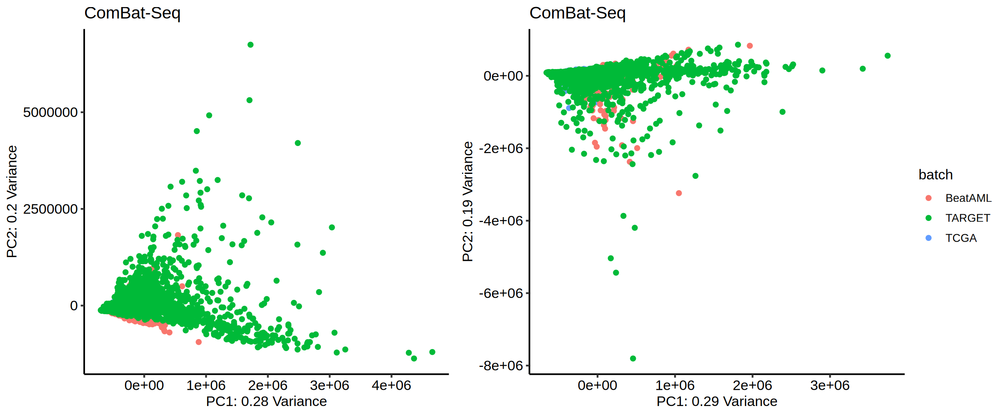

In [157]:
seobj <- SummarizedExperiment(assays=raw_count, colData=dsn_batch_df)
pca_obj <- plotPCA(DESeqTransform(seobj), intgroup=c("batch"))
plt <- ggplot(pca_obj$data, aes(x=PC1, y=PC2, color=batch)) + 
  geom_point() + 
  labs(x=sprintf("PC1: %s Variance", percent(pca_obj$plot_env$percentVar[1])),
       y=sprintf("PC2: %s Variance", percent(pca_obj$plot_env$percentVar[2])),
       title="ComBat-Seq") + theme_pubr()

seobj_adj <- SummarizedExperiment(assays=raw_count_adj, colData=dsn_batch_df)
pca_obj_adj <- plotPCA(DESeqTransform(seobj_adj), intgroup=c("batch"))
plt_adj <- ggplot(pca_obj_adj$data, aes(x=PC1, y=PC2, color=batch)) + 
  geom_point() + 
  labs(x=sprintf("PC1: %s Variance", percent(pca_obj_adj$plot_env$percentVar[1])),
       y=sprintf("PC2: %s Variance", percent(pca_obj_adj$plot_env$percentVar[2])),
       title="ComBat-Seq") + theme_pubr()

options(repr.plot.width = 12, repr.plot.height = 5, repr.plot.res = 200)
ggarrange(plt, plt_adj, ncol=2, nrow=1, common.legend=TRUE, legend="right")


In [161]:
sum_tbl = as.data.table(apply(raw_count_adj, 2, mean), keep.rownames = T)
head(sum_tbl)


V1,V2
<chr>,<dbl>
TCGA-AB-2803-03,937.8902
TCGA-AB-2805-03,789.3105
TCGA-AB-2806-03,842.9436
TCGA-AB-2807-03,933.2900
TCGA-AB-2808-03,813.7149
TCGA-AB-2810-03,1032.5357


In [167]:
library(BatchQC)

In [173]:
  unadjusted = batchqc_explained_variation(cpm(raw_count, log=TRUE), batch = dsn_batch$batch, condition = rep(1, nrow(dsn_batch)))$explained_variation

In [174]:
head(unadjusted)

,Full (Condition+Batch),Condition,Batch
UBE2Q2P2,48.417,0,48.417
HMGB1P1,49.587,0,49.587
RNU12-2P,15.238,0,15.238
EFCAB8,28.189,0,28.189
SDR16C6P,4.246,0,4.246
HSPB1P1,23.440,0,23.440


In [176]:
varexp_full <- list(
  unadjusted=batchqc_explained_variation(cpm(raw_count, log=TRUE), batch=dsn_batch$batch, condition = rep(1, nrow(dsn_batch)))$explained_variation,
  combatseq=batchqc_explained_variation(cpm(raw_count_adj, log=TRUE), condition = rep(1, nrow(dsn_batch)), batch=dsn_batch$batch)$explained_variation
)
varexp_full_df <- melt(varexp_full)
head(varexp_full_df) 


Warning message:
"The melt generic in data.table has been passed a list and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(varexp_full). In the next version, this warning will become an error."


,Var1,Var2,value,L1
,<fct>,<fct>,<dbl>,<chr>
1,UBE2Q2P2,Full (Condition+Batch),48.417,unadjusted
2,HMGB1P1,Full (Condition+Batch),49.587,unadjusted
3,RNU12-2P,Full (Condition+Batch),15.238,unadjusted
4,EFCAB8,Full (Condition+Batch),28.189,unadjusted
5,SDR16C6P,Full (Condition+Batch),4.246,unadjusted
6,HSPB1P1,Full (Condition+Batch),23.440,unadjusted


In [182]:
head(varexp_full_df)

,Var1,Var2,value,L1
,<fct>,<fct>,<dbl>,<fct>
1,UBE2Q2P2,Condition+Batch,48.417,unadjusted
2,HMGB1P1,Condition+Batch,49.587,unadjusted
3,RNU12-2P,Condition+Batch,15.238,unadjusted
4,EFCAB8,Condition+Batch,28.189,unadjusted
5,SDR16C6P,Condition+Batch,4.246,unadjusted
6,HSPB1P1,Condition+Batch,23.440,unadjusted


In [183]:
table(varexp_full_df$Var2)


Condition+Batch       Condition           Batch 
          35222           35222           35222 

In [185]:
varexp_full <- list(
  unadjusted=batchqc_explained_variation(cpm(raw_count, log=TRUE), batch=dsn_batch$batch, condition = rep(1, nrow(dsn_batch)))$explained_variation,
  combatseq=batchqc_explained_variation(cpm(raw_count_adj, log=TRUE), condition = rep(1, nrow(dsn_batch)), batch=dsn_batch$batch)$explained_variation
)
varexp_full_df <- melt(varexp_full)
varexp_full_df$L1 <- factor(varexp_full_df$L1, levels=c("unadjusted", "combatseq"))
varexp_full_df$Var2 <- plyr::revalue(varexp_full_df$Var2, c("Full (Condition+Batch)"="Condition+Batch"))
varexp_full_df = varexp_full_df[varexp_full_df$Var2 %in% c('Batch'), ]
head(varexp_full_df) 


Warning message:
"The melt generic in data.table has been passed a list and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(varexp_full). In the next version, this warning will become an error."


,Var1,Var2,value,L1
,<fct>,<fct>,<dbl>,<fct>
35223,UBE2Q2P2,Batch,48.417,unadjusted
35224,HMGB1P1,Batch,49.587,unadjusted
35225,RNU12-2P,Batch,15.238,unadjusted
35226,EFCAB8,Batch,28.189,unadjusted
35227,SDR16C6P,Batch,4.246,unadjusted
35228,HSPB1P1,Batch,23.440,unadjusted


In [187]:
summary(varexp_full_df$L1)

unadjusted  combatseq 
     17611      17611

In [ ]:
ggplot(varexp_full_df, aes(y=L1, y=value)) +
  geom_boxplot() +
  labs(y="Explained variation") +
  theme(axis.title.x = element_blank()) + theme_pubr()


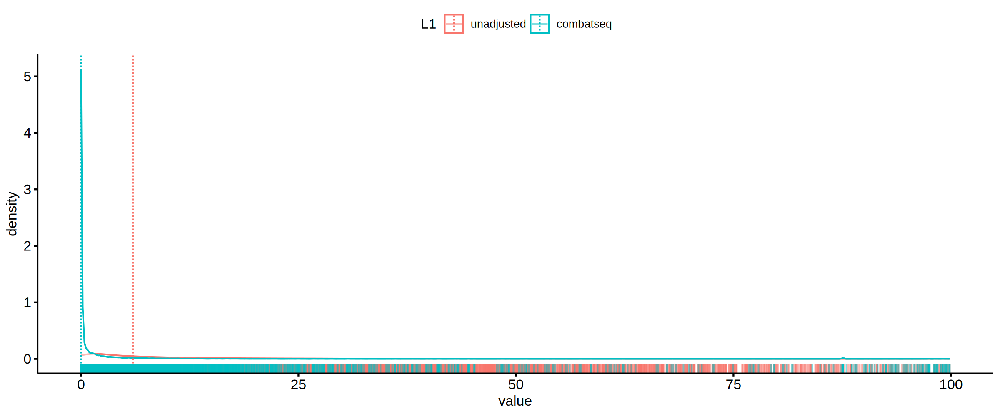

In [194]:
ggdensity(varexp_full_df, x = "value", color = "L1", add = "median", rug = TRUE)


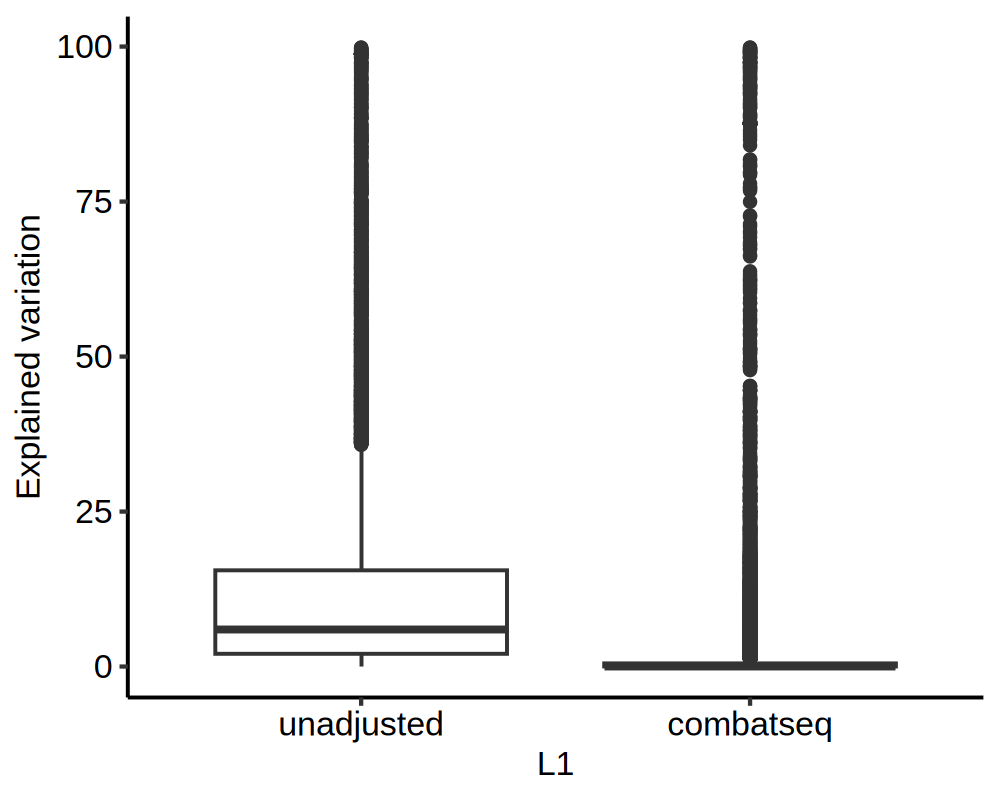

In [526]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
ggplot(varexp_full_df, aes(x=L1, y=value)) +
  geom_boxplot() +
  labs(y="Explained variation") +
  theme(axis.title.x = element_blank()) + theme_pubr()


## organize clinical information needed

In [280]:
dsn_batch_tcga = dsn_batch[batch == 'TCGA', ]
dim(dsn_batch_tcga)
dsn_batch_tcga[, PatientID := substr(rn, 1, 12) ]
dsn_batch_tcga = merge(dsn_batch_tcga, 
                       cbio_tcga_clin[, .(PatientID, DFS_MONTHS, DFS_STATUS, OS_MONTHS, OS_STATUS, MLL_re, AML1ETO, PMLRARA, CBFBMYH11, FLT3)], 
                       by = 'PatientID', all.x = T)
setnames(dsn_batch_tcga, 'FLT3', 'FLT3ITD')
dim(dsn_batch_tcga)
head(dsn_batch_tcga)

[1] 173   2

[1] 173  12

PatientID,rn,batch,DFS_MONTHS,DFS_STATUS,OS_MONTHS,OS_STATUS,MLL_re,AML1ETO,PMLRARA,CBFBMYH11,FLT3ITD
<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
TCGA-AB-2803,TCGA-AB-2803-03,TCGA,24.1,1:Recurred/Progressed,25.7,1:DECEASED,WT,WT,PML-RARA,WT,WT
TCGA-AB-2805,TCGA-AB-2805-03,TCGA,11.6,1:Recurred/Progressed,18.5,1:DECEASED,WT,WT,WT,WT,WT
TCGA-AB-2806,TCGA-AB-2806-03,TCGA,16.1,1:Recurred/Progressed,30.6,1:DECEASED,WT,AML1-ETO,WT,WT,WT
TCGA-AB-2807,TCGA-AB-2807-03,TCGA,4.9,0:DiseaseFree,4.9,1:DECEASED,WT,WT,WT,WT,WT
TCGA-AB-2808,TCGA-AB-2808-03,TCGA,10.0,1:Recurred/Progressed,118.1,0:LIVING,WT,WT,WT,WT,WT
TCGA-AB-2810,TCGA-AB-2810-03,TCGA,1.3,0:DiseaseFree,1.3,1:DECEASED,WT,WT,WT,WT,WT


In [258]:
beat_clin = fread('data/beat_clin_beat12.tsv')
dsn_batch_beat = dsn_batch[batch == 'BeatAML', ]
dsn_batch_beat = merge(dsn_batch_beat, beat_clin[, .(dbgap_rnaseq_sample,  OS_Month, stat, MLL_re, AML1ETO, PMLRARA, CBFBMYH11, FLT3ITD)], by.x = 'rn', by.y = 'dbgap_rnaseq_sample', all.x = T) 
dsn_batch_beat = dsn_batch_beat[!is.na(FLT3ITD), ]
setnames(dsn_batch_beat, 'stat', 'OS_STATUS')
setnames(dsn_batch_beat, 'OS_Month', 'OS_MONTHS')
head( dsn_batch_beat )
dim( dsn_batch_beat )
 

rn,batch,OS_MONTHS,OS_STATUS,MLL_re,AML1ETO,PMLRARA,CBFBMYH11,FLT3ITD
<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
BA2000R,BeatAML,20.925620,1,WT,WT,WT,WT,FLT3-ITD
BA2003R,BeatAML,8.495868,1,WT,WT,WT,WT,FLT3-ITD
BA2004R,BeatAML,11.272727,1,WT,WT,WT,WT,WT
BA2011R,BeatAML,10.115702,0,WT,WT,WT,WT,WT
BA2019R,BeatAML,5.586777,1,WT,WT,WT,WT,WT
BA2020R,BeatAML,25.190083,0,WT,WT,WT,WT,FLT3-ITD


[1] 671   9

In [425]:
dsn_batch_target = dsn_batch[batch == 'TARGET', ]
dim(dsn_batch_target)
dsn_batch_target = merge(dsn_batch_target, target_clin[, .(PatientID, vital_status, days_to_death, FLT3ITD, MA9, AML1ETO)], by.x = 'rn', by.y = 'PatientID')


[1] 2185    2

In [277]:
dsn_batch_target = dsn_batch[batch == 'TARGET', ]
dim(dsn_batch_target)
dsn_batch_target = merge(dsn_batch_target, target_clin[, .(PatientID, vital_status, days_to_death, FLT3ITD, MA9, AML1ETO)], by.x = 'rn', by.y = 'PatientID')
dsn_batch_target[, days_to_death := days_to_death / 30.25 ]
setnames(dsn_batch_target, 'vital_status', 'OS_STATUS')
setnames(dsn_batch_target, 'days_to_death', 'OS_MONTHS')
setnames(dsn_batch_target, 'MA9', 'MLL_re')
head(dsn_batch_target)
dim(dsn_batch_target)


[1] 2185    2

rn,batch,OS_STATUS,OS_MONTHS,FLT3ITD,MLL_re,AML1ETO
<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>
TARGET-20-PABLDZ,TARGET,Alive,NA,FLT3ITD,WT,WT
TARGET-20-PABLDZ,TARGET,Alive,NA,FLT3ITD,WT,WT
TARGET-20-PADYIR,TARGET,Dead,19.33884,WT,WT,WT
TARGET-20-PADYIR,TARGET,Dead,19.33884,WT,WT,WT
TARGET-20-PADYIR,TARGET,Dead,19.33884,WT,WT,WT
TARGET-20-PADZCG,TARGET,Dead,17.71901,WT,WT,WT


[1] 823   7

In [281]:
dsn_batch_v2 = rbindlist(list(dsn_batch_target[, .(rn, batch, OS_STATUS, OS_MONTHS, MLL_re, FLT3ITD, AML1ETO)], 
                           dsn_batch_beat[, .(rn, batch, OS_STATUS, OS_MONTHS, MLL_re, FLT3ITD, AML1ETO)], 
                           dsn_batch_tcga[, .(rn, batch, OS_STATUS, OS_MONTHS, MLL_re, FLT3ITD, AML1ETO)])) 
head(dsn_batch_v2)
                           

rn,batch,OS_STATUS,OS_MONTHS,MLL_re,FLT3ITD,AML1ETO
<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>
TARGET-20-PABLDZ,TARGET,Alive,NA,WT,FLT3ITD,WT
TARGET-20-PABLDZ,TARGET,Alive,NA,WT,FLT3ITD,WT
TARGET-20-PADYIR,TARGET,Dead,19.33884,WT,WT,WT
TARGET-20-PADYIR,TARGET,Dead,19.33884,WT,WT,WT
TARGET-20-PADYIR,TARGET,Dead,19.33884,WT,WT,WT
TARGET-20-PADZCG,TARGET,Dead,17.71901,WT,WT,WT


In [283]:
raw_count_adj_v2 = raw_count_adj[, dsn_batch_v2$rn]

In [363]:
fwrite(raw_count_adj_v2, file = 'data/batch_corrected_3cohort_raw_counts.tsv', sep = '\t')
fwrite(dsn_batch_v2, file = 'data/batch_corrected_3cohort_design_table.tsv', sep = '\t')


x being coerced from class: matrix to data.table



## normalized reads 

In [551]:
dge = DGEList(counts=raw_count_adj_v2)
dge <- calcNormFactors(dge)

dge = normLibSizes(dge)
logcpm = log1p(cpm(dge, normalize = T))

logcpm_t = as.data.table(t(logcpm_tcga), keep.rownames = T)

logcpm_t = merge(logcpm_t, dsn_batch_v2, by.x = 'rn', by.y = 'rn', all.x = T)

head(logcpm_t)


Repeated column names found in count matrix



rn,UBE2Q2P2,HMGB1P1,RNU12-2P,EFCAB8,SDR16C6P,HSPB1P1,PPBPP1,GTPBP6,EFCAB12,⋯,ZYX,ZZEF1,ZZZ3,AKR1C6P,batch,OS_STATUS,OS_MONTHS,MLL_re,FLT3ITD,AML1ETO
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>
BA2000R,0.02926131,0.4846250,0.18884637,0.1122339,0,0.1122339,0,3.915470,1.897842,⋯,5.936752,5.347596,4.340146,0.02926131,BeatAML,1,20.925620,WT,FLT3-ITD,WT
BA2003R,0.90268049,0.4228661,0.03690553,0.3191444,0,0.2034060,0,4.137656,2.575903,⋯,6.346626,5.543146,4.113977,0.29144123,BeatAML,1,8.495868,WT,FLT3-ITD,WT
BA2004R,0.75782187,0.3605750,0.02383337,1.0413694,0,0.5444091,0,3.834550,2.075757,⋯,5.726868,6.153414,4.082155,0.06986087,BeatAML,1,11.272727,WT,WT,WT
BA2011R,0.70116448,0.3463987,0.17241135,1.5996898,0,0.1069691,0,4.180953,1.780018,⋯,6.844946,6.058742,3.713674,0.03694244,BeatAML,0,10.115702,WT,WT,WT
BA2019R,1.26473146,1.5293057,0.00000000,0.2096319,0,1.3346557,0,3.955835,2.087743,⋯,5.448280,5.146951,4.385431,1.17524927,BeatAML,1,5.586777,WT,WT,WT
BA2020R,0.53412315,1.2472955,0.18373763,0.2167557,0,0.1320719,0,4.130938,2.337846,⋯,5.134402,4.768515,4.534286,0.00000000,BeatAML,0,25.190083,WT,FLT3-ITD,WT


In [546]:
datatable(head(logcpm_t))

Warning message in instance$preRenderHook(instance):
"It seems your data is too big for client-side DataTables. You may consider server-side processing: https://rstudio.github.io/DT/server.html"


HTML widgets cannot be represented in plain text (need html)

In [597]:
logcpm_t[FLT3ITD == 'FLT3ITD', FLT3ITD := 'FLT3-ITD']
logcpm_t[FLT3ITD == 'FLT3_Mut', FLT3ITD := 'WT']
logcpm_t[MLL_re == 'MA6', MLL_re := 'WT']
logcpm_t[AML1ETO == 'AML1ETO', AML1ETO := 'AML1-ETO']

In [598]:
logcpm_t[, FLT3ITD := factor(FLT3ITD, levels = c('WT', 'FLT3-ITD'))] 
logcpm_t[, MLL_re := factor(MLL_re, levels = c('WT', 'MLL_re'))] 
logcpm_t[, AML1ETO := factor(AML1ETO, levels = c('WT', 'AML1-ETO'))] 

In [336]:
table(logcpm_t$AML1ETO)


AML1-ETO  AML1ETO       WT 
      23      134     1774 

In [ ]:
logcpm_t[OS_STATUS == '0:LIVING',   OS_STATUS2 := 0] 
logcpm_t[OS_STATUS == '1:DECEASED', OS_STATUS2 := 1] 
logcpm_t[OS_STATUS == 'Alive',      OS_STATUS2 := 0] 
logcpm_t[OS_STATUS == 'Dead',       OS_STATUS2 := 1] 

In [595]:
head(logcpm_t[, .(FLT3ITD, MLL_re, AML1ETO)])

FLT3ITD,MLL_re,AML1ETO
<chr>,<chr>,<chr>
FLT3-ITD,WT,WT
FLT3-ITD,WT,WT
WT,WT,WT
WT,WT,WT
WT,WT,WT
FLT3-ITD,WT,WT


In [521]:
dim(logcpm_t)

[1]  1931 17623

In [599]:
table(logcpm_t$FLT3ITD)
table(logcpm_t$MLL_re)
table(logcpm_t$AML1ETO)


      WT FLT3-ITD 
    1583      348 


    WT MLL_re 
  1898     33 


      WT AML1-ETO 
    1774      157 

In [544]:
dim(logcpm_t)

[1]  1931 17623

## correlation


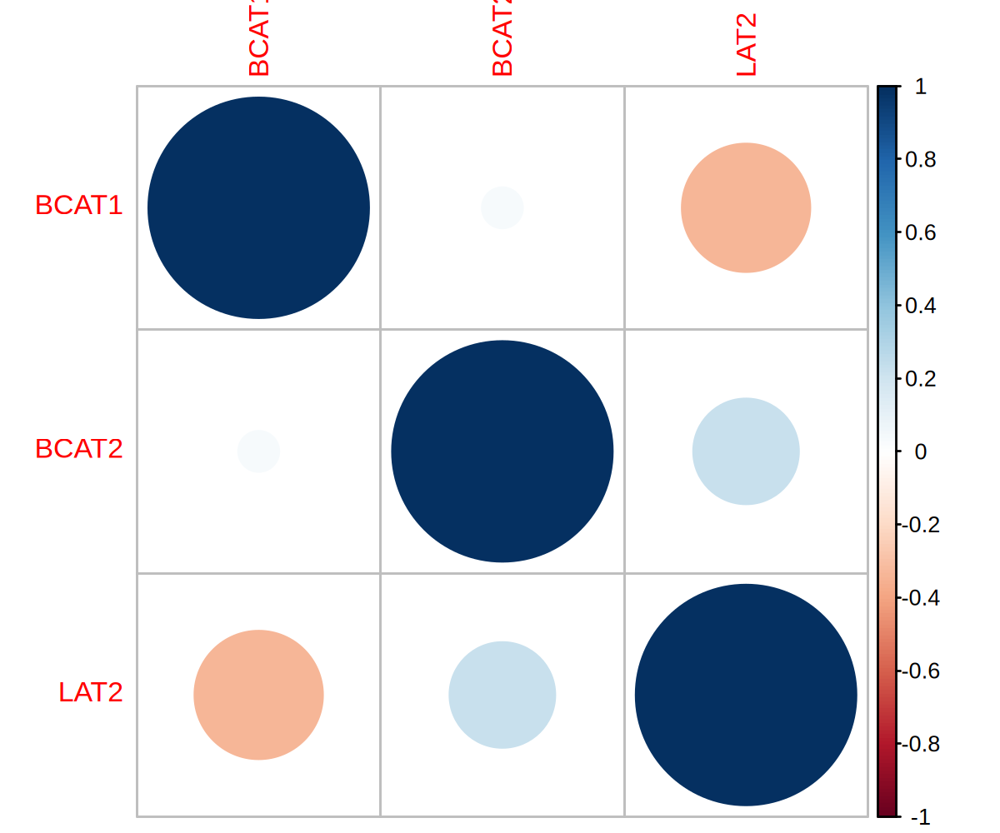

In [378]:
genes = c('BCAT1', 'BCAT2', 'SLC7A8', 'BCKDK')
genes = c('BCAT1', 'BCAT2', 'LAT2')
plotdat = logcpm_t[, genes, with = F]
plotdat = cor(plotdat)
options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 200)
corrplot(plotdat) # colorful number


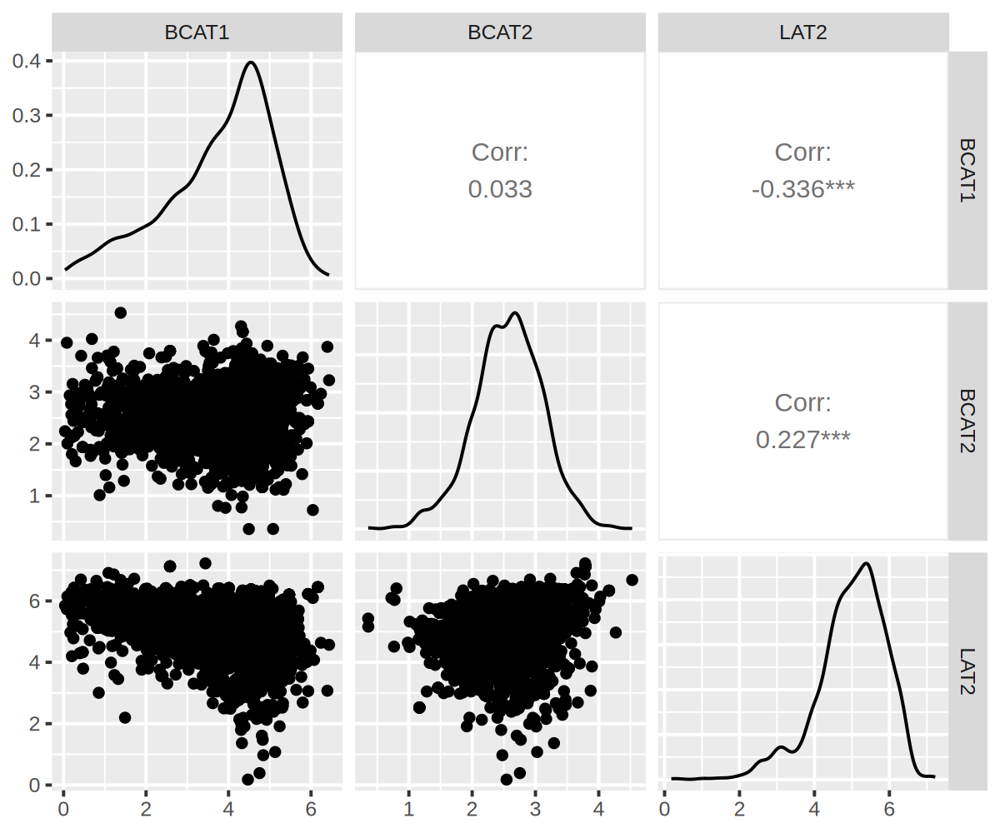

In [386]:
options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 200)
ggpairs(logcpm_t, columns = genes)


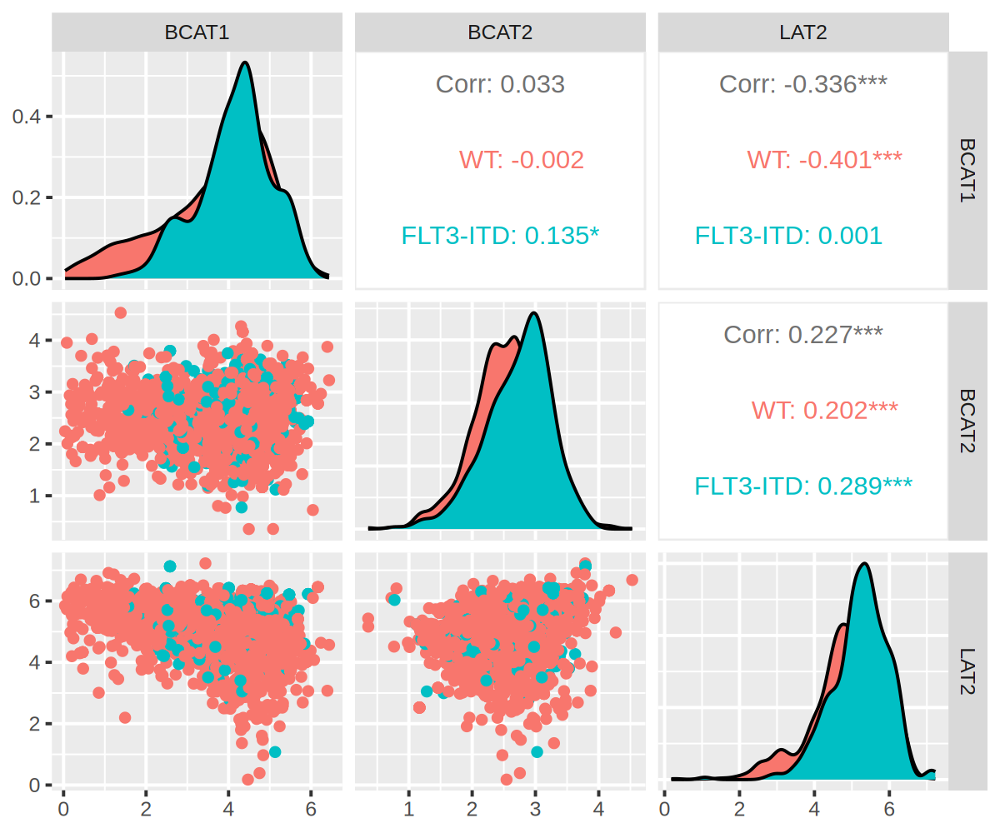

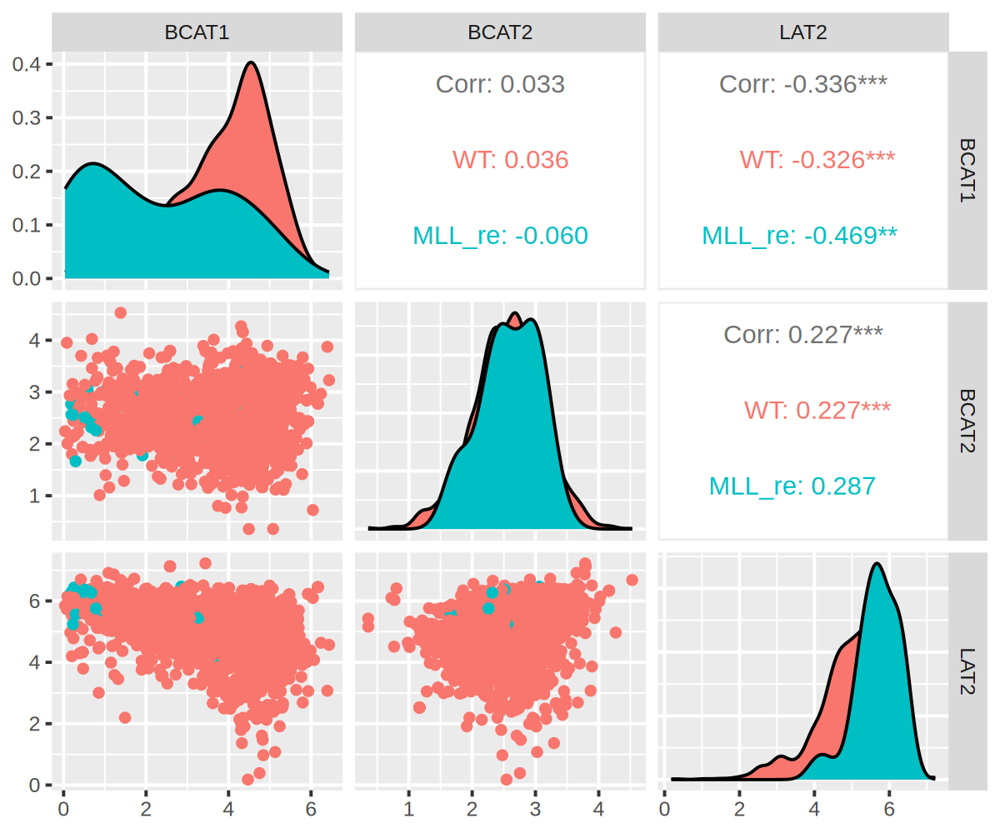

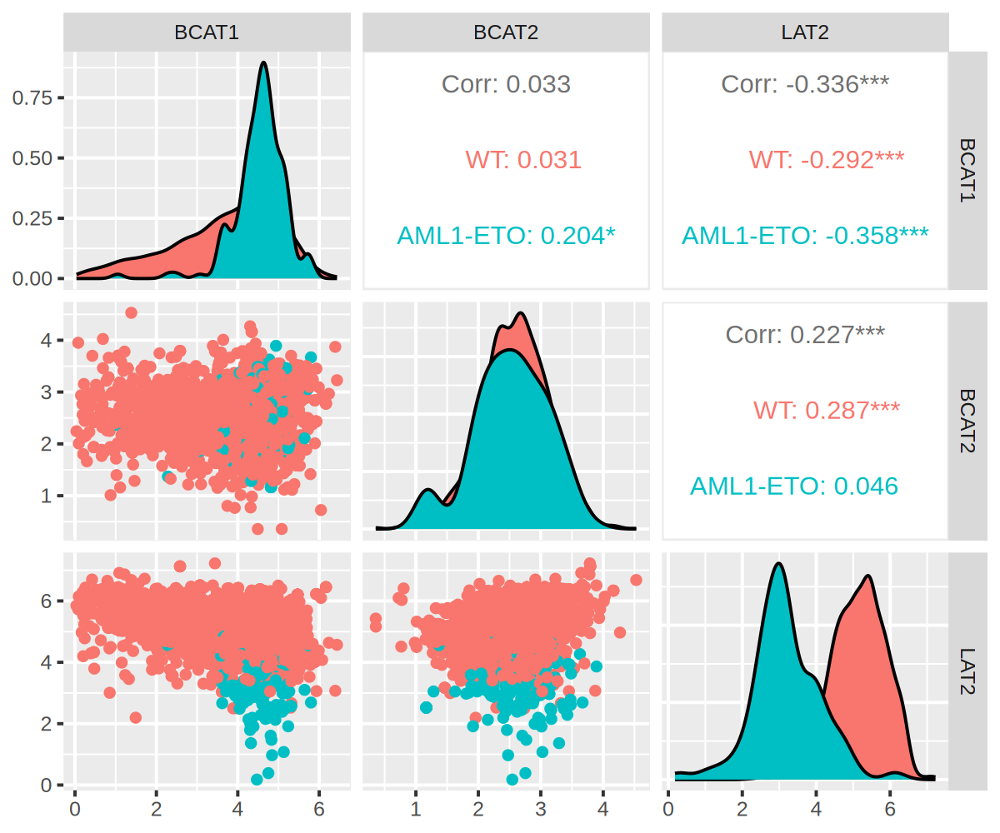

In [380]:
ggpairs(logcpm_t, columns = genes, aes(color = FLT3ITD))
ggpairs(logcpm_t, columns = genes, aes(color = MLL_re))
ggpairs(logcpm_t, columns = genes, aes(color = AML1ETO))

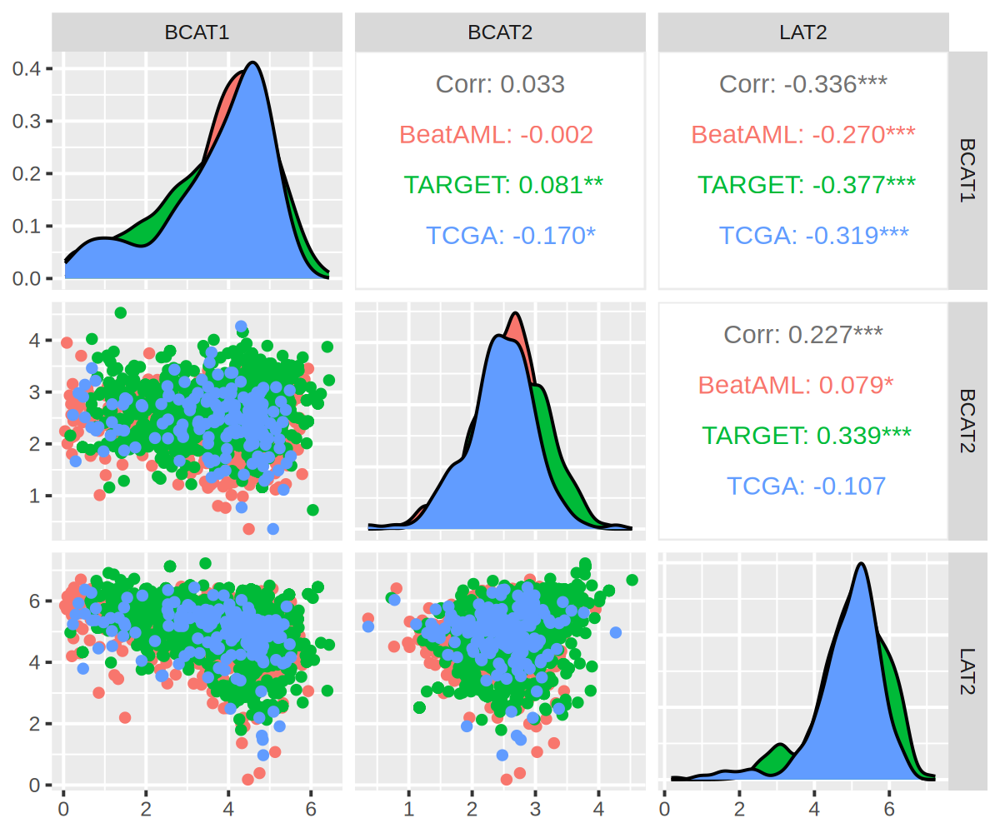

In [435]:
ggpairs(logcpm_t, columns = c('BCAT1', 'BCAT2', 'LAT2'), aes(color = batch))


## gene expression by molecular subtypes

In [589]:
vnames = genes
cnames = c('FLT3ITD', 'AML1ETO', 'MLL_re')
vnames_rep = rep(vnames, each = length(cnames))
cnames_rep = rep(cnames, times = length(vnames))

vnames_rep
cnames_rep

[1] "BCAT1" "BCAT1" "BCAT1" "BCAT2" "BCAT2" "BCAT2" "LAT2"  "LAT2"  "LAT2"

[1] "FLT3ITD" "AML1ETO" "MLL_re"  "FLT3ITD" "AML1ETO" "MLL_re"  "FLT3ITD" "AML1ETO" "MLL_re"

In [638]:
gg_list = lapply(1:length(vnames_rep), function(ii){
    vname = vnames_rep[ii]
    cname = cnames_rep[ii]
    stat.test = logcpm_t %>% select(!!sym(vname), !!sym(cname)) %>% 
    mutate(across(!!sym(cname), factor)) %>% mutate(across(!!sym(cname), ~ relevel(.x, ref = 'WT'))) %>% 
    t_test(as.formula(paste0(vname, ' ~ ', cname))) %>% add_significance()
    stat.test <- stat.test %>% add_xy_position(x = cname)
    #gg1 = ggboxplot(logcpm_t, x = cname, y = vname, outlier.shape = NA, color = cname, alpha = .2, width = .5) + 
    gg1 = ggboxplot(logcpm_t, x = cname, y = vname, color = cname, outlier.shape = NA, width = .5) + 
    ylab(paste0(vname, ' expressin (logCPM)')) + ggtitle(vname) + 
    theme(axis.text = element_text(size = 9), axis.title = element_text(size = 9), plot.title = element_text(size = 12, color = '#1874DC')) +
    stat_pvalue_manual(stat.test, label = "p") + 
    scale_y_continuous(expand = expansion(mult = c(0, 0.08))) + theme(legend.position="none") + xlab('') +
    theme(axis.text.x = element_text(angle = 0, vjust = 1, hjust = .5))
    gg1
})


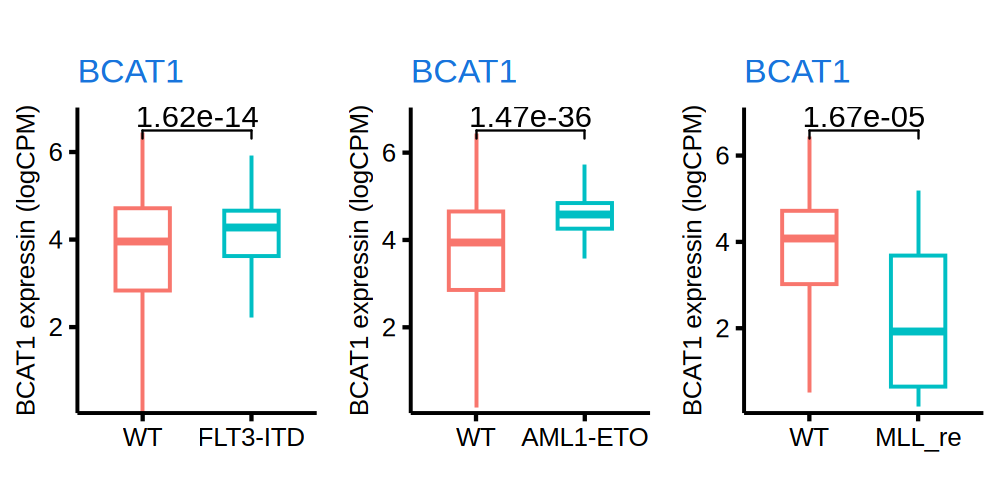

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL


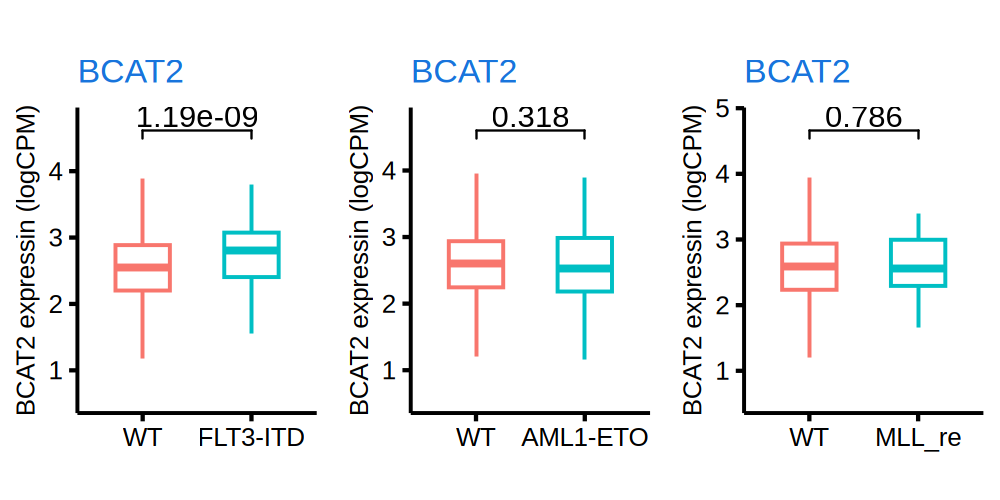

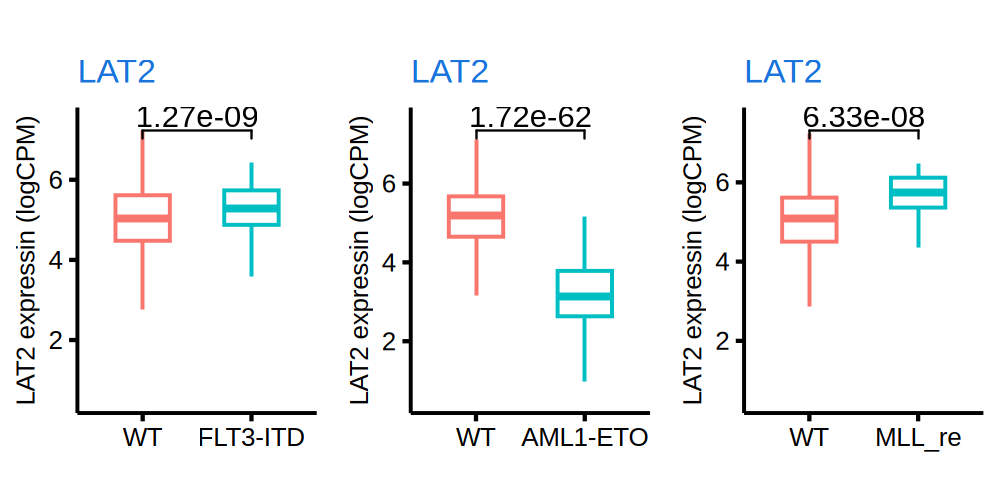

In [639]:
options(repr.plot.width = 5, repr.plot.height = 2.5, repr.plot.res = 200)
gridExtra::marrangeGrob(gg_list, ncol = 3, nrow = 1, top = '', by)


## survival analysis 

In [462]:
genes = c('BCAT1', 'BCAT2', 'LAT2')#, 'BCKDK')
genes_cat = paste0(genes, '')


In [ ]:
BeatAML  TARGET    TCGA 
    671    1087     173 


In [489]:
plotdat = logcpm_t[OS_STATUS2 %in% c('0', '1'), c(genes, 'OS_MONTHS', 'OS_STATUS2', 'batch'), with = F]
plotdat = plotdat[!is.na(OS_MONTHS), ]
plotdat[, OS_STATUS := as.numeric(OS_STATUS2) ]
dim(plotdat)


[1] 1271    7

In [500]:
plotdat[, BCAT1_cat := factor(findInterval(BCAT1, c(-Inf, quantile(BCAT1, probs=c(0.25, .75)),  Inf)),  labels=c("Low", "Middle", "High") ) ]
plotdat[, BCAT2_cat := factor(findInterval(BCAT2, c(-Inf, quantile(BCAT2, probs=c(0.25, .75)),  Inf)),  labels=c("Low", "Middle", "High") ) ]
plotdat[, LAT2_cat := factor(findInterval(LAT2, c(-Inf, quantile(LAT2, probs=c(0.25, .75)),  Inf)),  labels=c("Low", "Middle", "High") ) ]
plotdat[, BCAT1_LAT2_cat := paste0(BCAT1_cat, '_', LAT2_cat) ]
#plotdat[, BCKDK_cat := factor(findInterval(BCKDK, c(-Inf, quantile(BCKDK, probs=c(0.25, .75)),  Inf)),  labels=c("Low", "Middle", "High") ) ]


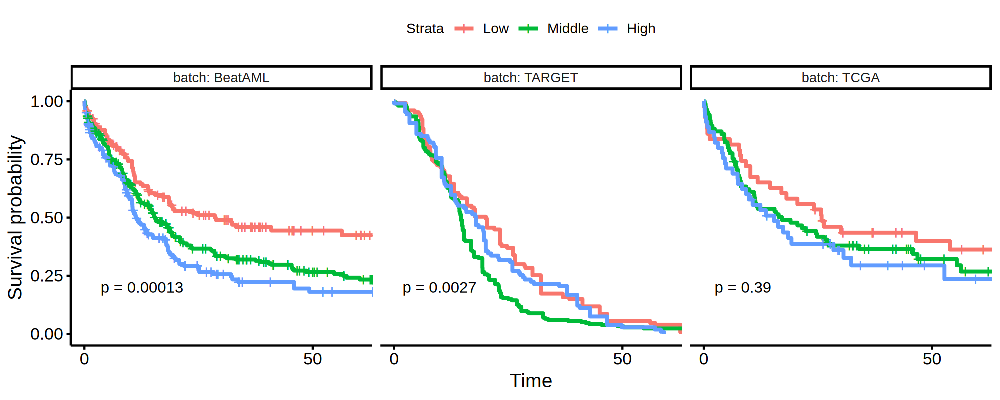

In [518]:
fit_bcat1 <- surv_fit(Surv(OS_MONTHS, OS_STATUS) ~ BCAT1_cat, data = plotdat)

options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
ggsurvplot_facet(fit_bcat1, data = plotdat, facet.by = 'batch', xlim = c(0, 60), pval = T)


Warning message:
"`as.tibble()` was deprecated in tibble 2.0.0.
ℹ Please use `as_tibble()` instead.
ℹ The signature and semantics have changed, see `?as_tibble`.
ℹ The deprecated feature was likely used in the survminer package.
  Please report the issue at <https://github.com/kassambara/survminer/issues>."
Warning message:
"`select_()` was deprecated in dplyr 0.7.0.
ℹ Please use `select()` instead.
ℹ The deprecated feature was likely used in the survminer package.
  Please report the issue at <https://github.com/kassambara/survminer/issues>."


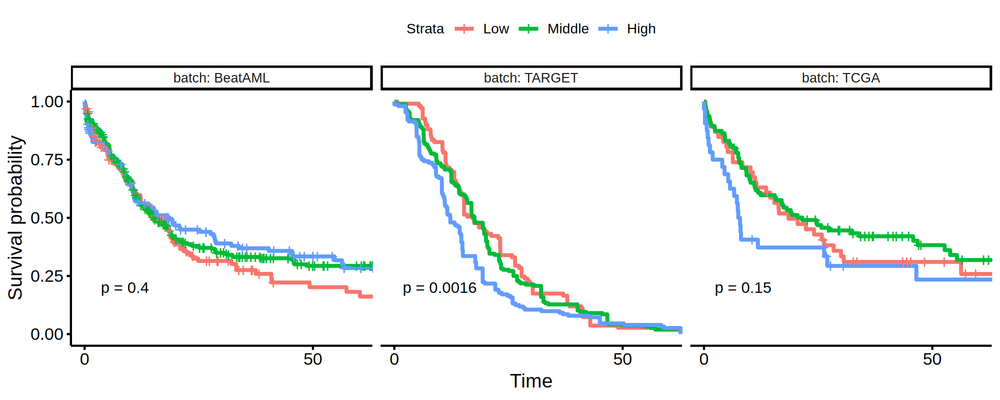

In [517]:
fit_bcat2 <- surv_fit(Surv(OS_MONTHS, OS_STATUS) ~ BCAT2_cat, data = plotdat)

options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
ggsurvplot_facet(fit_bcat2, data = plotdat, facet.by = 'batch', xlim = c(0, 60), pval = T)


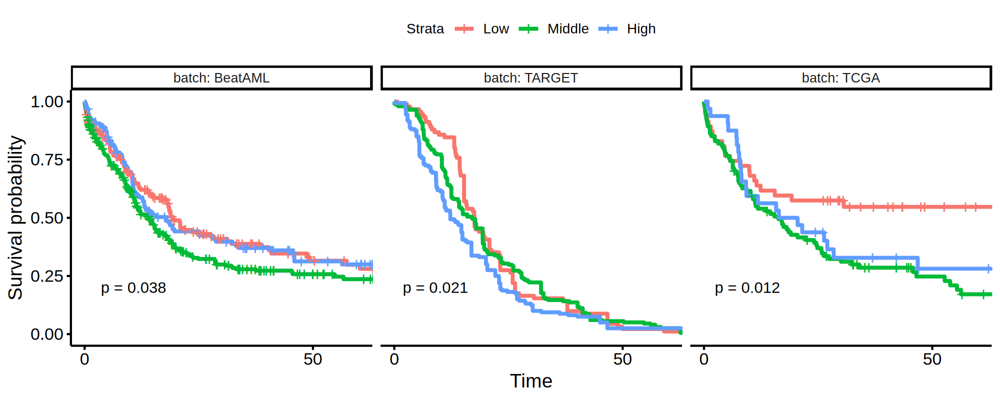

In [519]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
fit_lat2  <- surv_fit(Surv(OS_MONTHS, OS_STATUS) ~ LAT2_cat,  data = plotdat)

options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
ggsurvplot_facet(fit_lat2, data = plotdat, facet.by = 'batch', xlim = c(0, 60), pval = T)


In [503]:
table(plotdat$BCAT1_LAT2_cat)


    High_High      High_Low   High_Middle      Low_High       Low_Low    Low_Middle   Middle_High    Middle_Low Middle_Middle 
           57           106           155           120            53           145           141           159           335 

In [506]:
head(plotdat)

BCAT1,BCAT2,LAT2,OS_MONTHS,OS_STATUS2,batch,OS_STATUS,BCAT1_cat,BCAT2_cat,LAT2_cat,BCAT1_LAT2_cat,tmp1
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<fct>,<fct>,<fct>,<chr>,<fct>
3.920193,3.019401,5.236813,20.925620,1,BeatAML,1,Middle,High,Middle,Middle_Middle,Low
3.869503,2.222817,5.031643,8.495868,1,BeatAML,1,Middle,Middle,Middle,Middle_Middle,Low
3.960267,2.556529,5.033442,11.272727,1,BeatAML,1,Middle,Middle,Middle,Middle_Middle,Low
3.790495,1.568817,4.669780,10.115702,0,BeatAML,0,Middle,Low,Middle,Middle_Middle,Low
4.484909,2.653276,3.604861,5.586777,1,BeatAML,1,Middle,Middle,Low,Middle_Low,High
2.528706,2.863301,4.528423,25.190083,0,BeatAML,0,Low,Middle,Low,Low_Low,Low


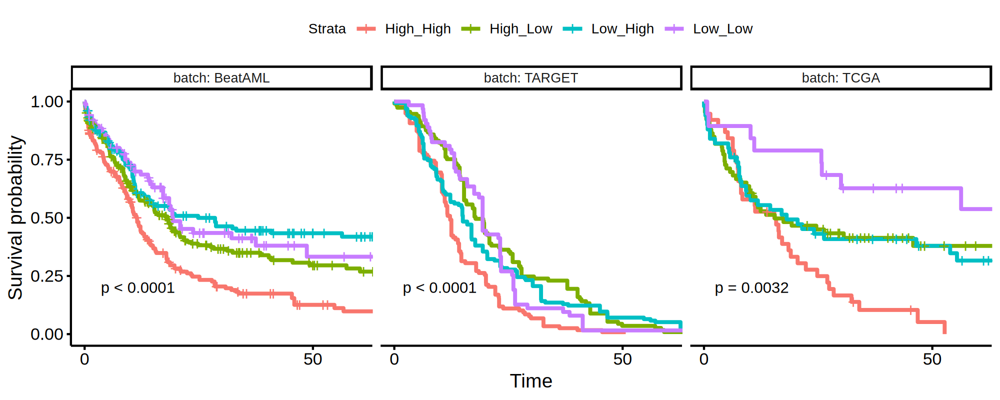

In [527]:
plotdat[, tmp1 := factor(findInterval(BCAT1, c(-Inf, mean(BCAT1),  Inf)),  labels=c("Low", "High") ) ]
plotdat[, tmp2 := factor(findInterval(LAT2, c(-Inf, mean(LAT2),  Inf)),  labels=c("Low", "High") ) ]
plotdat[, BCAT1_LAT2_cat := paste0(tmp1, '_', tmp2) ]
#plotdat[, BCKDK_cat := factor(findInterval(BCKDK, c(-Inf, quantile(BCKDK, probs=c(0.25, .75)),  Inf)),  labels=c("Low", "Middle", "High") ) ]

options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
fit_bcat1_lat2  <- surv_fit(Surv(OS_MONTHS, OS_STATUS) ~ BCAT1_LAT2_cat,  data = plotdat)

options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
ggsurvplot_facet(fit_bcat1_lat2, data = plotdat, facet.by = 'batch', xlim = c(0, 60), pval = T)


In [543]:
table(plotdat$FLT3ITD)


      WT FLT3-ITD 
    1583      348 

In [ ]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
tmp <- surv_fit(Surv(OS_MONTHS, OS_STATUS) ~ FLT3ITD,  data = plotdat)

options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
ggsurvplot_facet(tmp, data = plotdat, facet.by = 'batch', xlim = c(0, 60), pval = T)


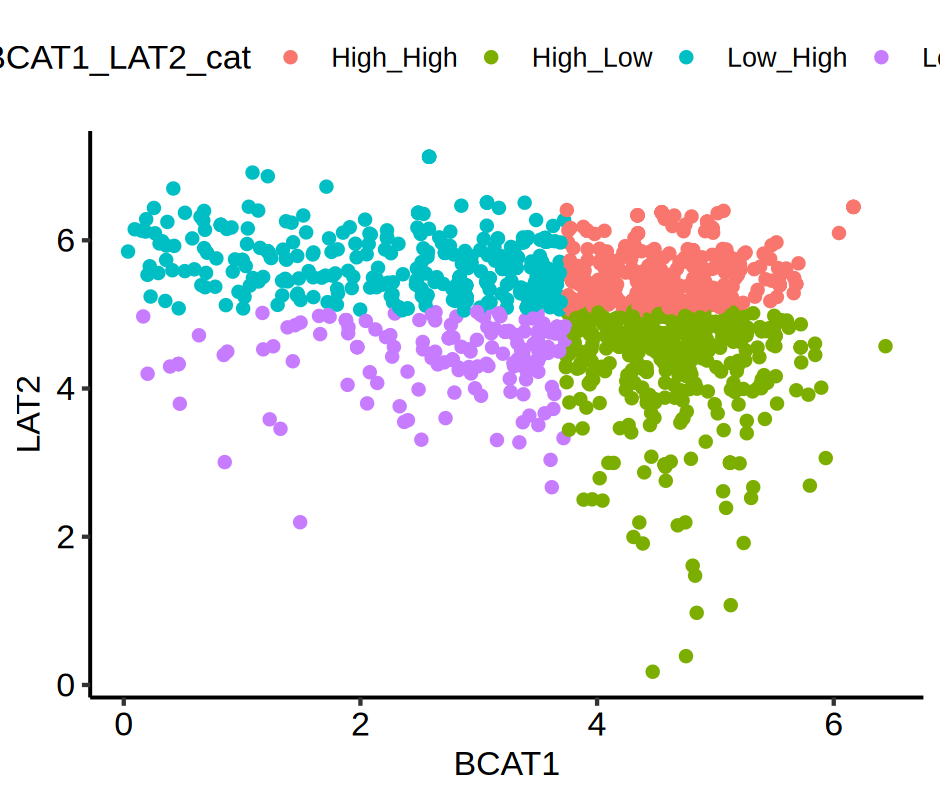

In [516]:
options(repr.plot.width = 4.7, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(x = BCAT1, y = LAT2, color = BCAT1_LAT2_cat)) + geom_point() + theme_pubr()


In [541]:
plotdat = copy(logcpm_t)
plotdat[, tmp1 := factor(findInterval(BCAT1, c(-Inf, mean(BCAT1),  Inf)),  labels=c("Low", "High") ) ]
plotdat[, tmp2 := factor(findInterval(LAT2, c(-Inf, mean(LAT2),  Inf)),  labels=c("Low", "High") ) ]
plotdat[, BCAT1_LAT2_cat := paste0(tmp1, '_', tmp2) ]
table(plotdat[BCAT1_LAT2_cat == 'High_High', batch], plotdat[BCAT1_LAT2_cat == 'High_High', MLL_re])
table(plotdat[BCAT1_LAT2_cat == 'High_High', batch], plotdat[BCAT1_LAT2_cat == 'High_High', AML1ETO])
table(plotdat[BCAT1_LAT2_cat == 'High_High', batch], plotdat[BCAT1_LAT2_cat == 'High_High', FLT3ITD])

         
           WT MLL_re
  BeatAML 181      7
  TARGET  254      0
  TCGA     43      0

         
           WT AML1-ETO
  BeatAML 188        0
  TARGET  254        0
  TCGA     43        0

         
           WT FLT3-ITD
  BeatAML 134       54
  TARGET  136      118
  TCGA     41        2

In [507]:
quantile(plotdat$BCAT1, probs=c(0.5))

50% 
3.968582

In [ ]:
BCAT1_LAT2_cat

In [469]:
table(logcpm_t$batch)


BeatAML  TARGET    TCGA 
    671    1087     173 

# export 

In [34]:
save.image('jude_target_oct14.rds')